## Import

In [2]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor

In [3]:
from ML.utils.utils import *
from ML.utils.Data_preparator import Data_preparator
from ML.utils.Model_evaluator import Model_evaluator
from physics.Iso_data_handler import Iso_data_handler
from physics.Data_visualiser import Data_visualiser

In [4]:
pre_path = "../../../../../../../"
physical_model = "MIST"
path_to_data = pre_path + "data/MIST_v1.2_vvcrit0.0_basic_isos/"
path_to_results = pre_path + "results/model_B/default_models/"
path_to_predictions = pre_path + "predictions/model_B/default_models/"
tag = "Base_old"
output_parameters = ['T_eff', 'log_g', 'radius']
categories_name = ["phase"]

In [5]:
override = False
use_preds = True
save = True
show = True

## Data preparation

This notebook contains the results of the model which are trained using all the data from MIST and filtered on the phases

Reading MIST dataframe from MIST_reclassified_iso_full_data.csv file...


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,3.486221,3.131342,-1.0,-0.25,0.100000,0.153402
1,5.0,3.487362,3.126808,-1.0,-0.25,0.102645,0.160326
2,5.0,3.489243,3.119367,-1.0,-0.25,0.107039,0.171785
3,5.0,3.491102,3.112165,-1.0,-0.25,0.111419,0.183099
4,5.0,3.492937,3.105143,-1.0,-0.25,0.115789,0.194305
...,...,...,...,...,...,...,...
1467117,10.3,4.402490,7.777159,6.0,0.50,0.532726,-1.806255
1467118,10.3,4.387132,7.783242,6.0,0.50,0.532730,-1.809295
1467119,10.3,4.371789,7.789130,6.0,0.50,0.532735,-1.812237
1467120,10.3,4.356480,7.794844,6.0,0.50,0.532741,-1.815091


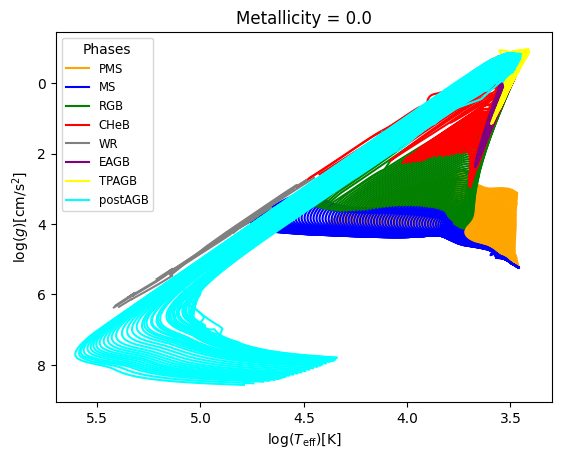

In [6]:
iso_handler = Iso_data_handler(path_to_data, 
                              ['log10_isochrone_age_yr', 'log_Teff', 'log_g', 'phase', 'metallicity', 'star_mass', 'log_R'], 
                              physical_model, reclassify=True)

iso_df = iso_handler.get_isochrone_dataframe()
display(iso_df)
data_visualiser = Data_visualiser(iso_df, physical_model)
data_visualiser.plot_Kiel([], [0.0])

,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,4.494412,4.346972,0.0,-0.25,13.584360,0.610679
1,5.0,4.497517,4.345776,0.0,-0.25,13.765512,0.614753
2,5.0,4.500556,4.344580,0.0,-0.25,13.942887,0.618755
3,5.0,4.504040,4.343050,0.0,-0.25,14.591712,0.624670
4,5.0,4.507576,4.341483,0.0,-0.25,15.426062,0.631187
...,...,...,...,...,...,...,...
1140739,10.3,3.425746,-0.551440,5.0,0.50,0.602856,2.384899
1140740,10.3,3.426469,-0.560350,5.0,0.50,0.598549,2.387797
1140741,10.3,3.427744,-0.566057,5.0,0.50,0.594116,2.389036
1140742,10.3,3.429413,-0.569225,5.0,0.50,0.589648,2.388981


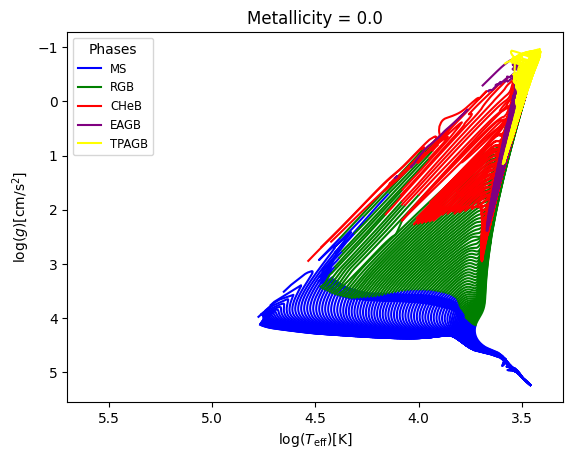

In [7]:
phase_filtered_iso_df = Data_preparator.filter_data(iso_df, {'phase':[0, 2, 3, 4, 5]})
display(phase_filtered_iso_df)
data_visualiser_phase_filtered = Data_visualiser(phase_filtered_iso_df, physical_model)
data_visualiser_phase_filtered.plot_Kiel([], [0.0])

In [8]:
print_all_uniques(phase_filtered_iso_df)

log10_isochrone_age_yr  : Range : 5.0 - 10.3, Mean : 8.4657, Median : 8.55

log_Teff  : Range : 3.34 - 5.3788, Mean : 3.8298, Median : 3.6739

log_g  : Range : -1.14 - 6.2594, Mean : 2.0665, Median : 2.005

Values in phase column : 0.0, 2.0, 3.0, 4.0, 5.0 

Values in metallicity column : -0.25, -0.5, -0.75, -1.0, -1.25, -1.5, -1.75, -2.0, -2.5, -3.0, -3.5, -4.0, 0.0, 0.25, 0.5 

star_mass  : Range : 0.1 - 298.5448, Mean : 7.5368, Median : 2.0818

log_R  : Range : -1.0 - 3.1298, Mean : 1.3949, Median : 1.5001



In [9]:
X_train, X_ivs, y_train, y_ivs, categories_train, categories_ivs = \
    Data_preparator.split_data(phase_filtered_iso_df, x_cols=['log10_isochrone_age_yr', 'metallicity', 'star_mass'], 
                               y_cols=['log_Teff', 'log_g', 'log_R'], categories_cols=['phase'], random_state=12, print_stats=True)

print(X_train.shape, X_ivs.shape)
print(y_train.shape, y_ivs.shape)

Training set statistics:
Range in train data for the log_Teff parameter : 3.344668191350628 - 5.378675973625695
Median value in train data for the log_Teff parameter: 3.6737679778938226
Mean value in train data for the log_Teff parameter: 3.829879593824312

Range in train data for the log_g parameter : -1.14489780699774 - 6.259434356871683
Median value in train data for the log_g parameter: 2.007777137067153
Mean value in train data for the log_g parameter: 2.067468513515282

Range in train data for the log_R parameter : -0.9974747647513328 - 3.129269620812593
Median value in train data for the log_R parameter: 1.4993114860984695
Mean value in train data for the log_R parameter: 1.3944707591667809

Testing set statistics:
Range in test data for the log_Teff parameter : 3.3446822240585243 - 5.378801600728572
Median value in test data for the log_Teff parameter: 3.674156503315524
Mean value in test data for the log_Teff parameter: 3.8296077112173066

Range in test data for the log_g para

## Model training

### Linear regression

In [10]:
lr_evaluator = Model_evaluator("linear_regression", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


Base_old train data :
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.7568985755265953
  RMSE :  0.23208985703139562
  MAE :  0.20136753524571152
  MedAE :  0.21084159478932363
  CORR :  0.8701840000515795
  MAX_ER :  0.8161700075513716
  Percentiles : 
    75th percentile :  0.3026643896783475
    90th percentile :  0.34703332851341745
    95th percentile :  0.3641807261005948
    99th percentile :  0.3875489777283454

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.711472733477716
  RVE :  0.7402770106026048
  RMSE :  0.19510612104635516
  MAE :  0.16480534537730382
  MedAE :  0.15941500510140405
  CORR :  0.8614475709609247
  MAX_ER :  0.5603288213852355
  Percentiles : 
    75th percentile :  0.248618476668651
    90th percentile :  0.3077507435155635
    95th percentile :  0.33242300463930796
    99th percentile : 

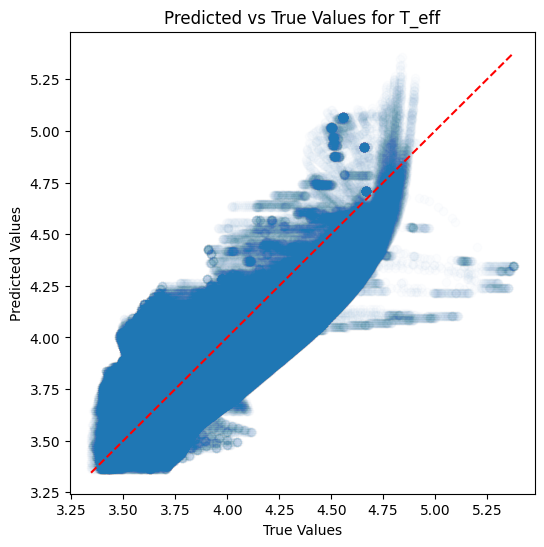

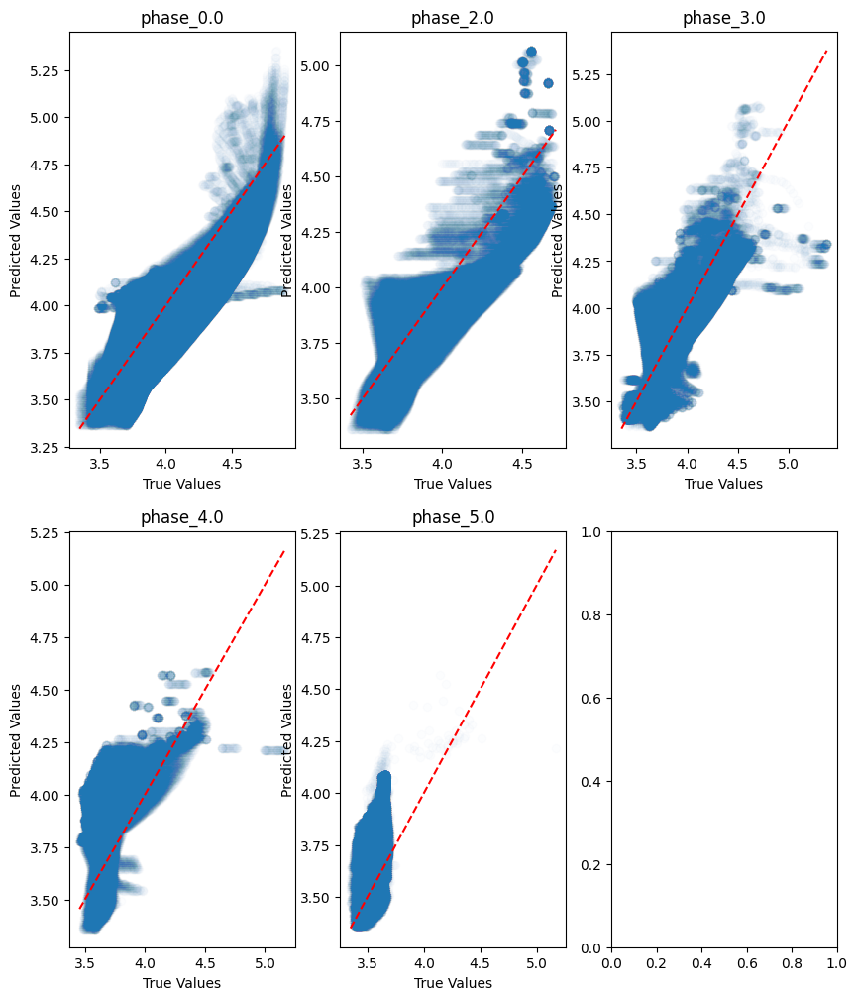

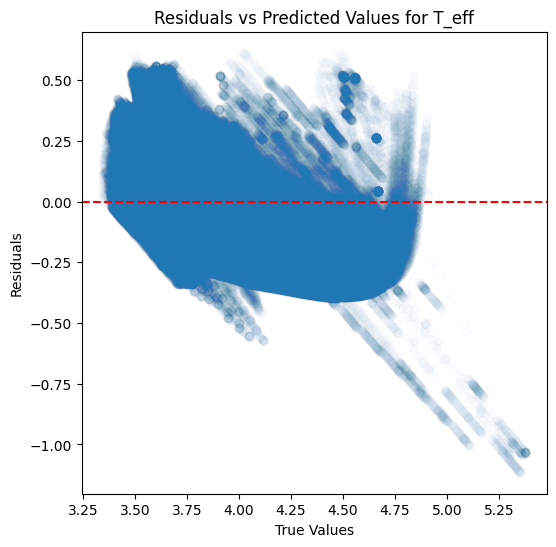

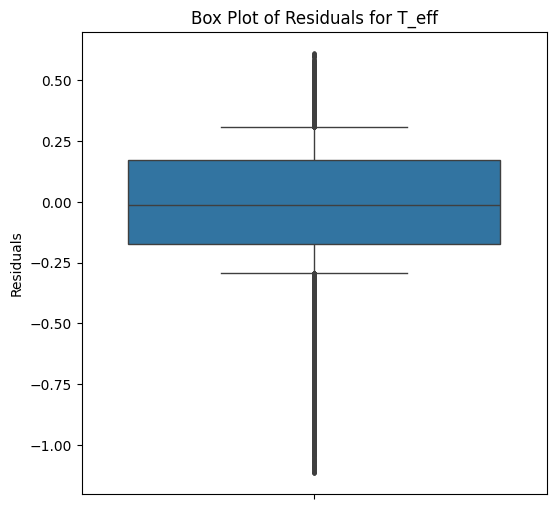

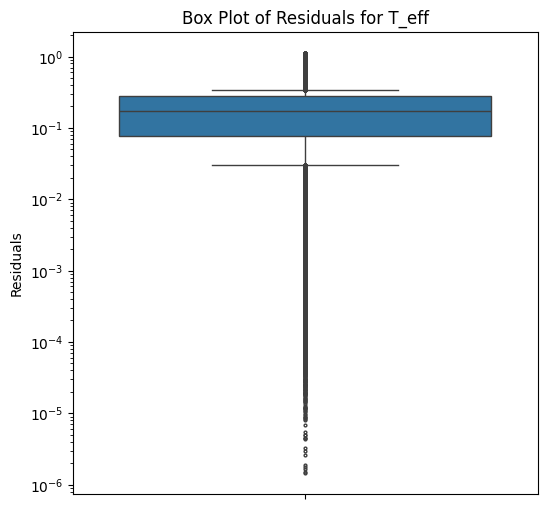

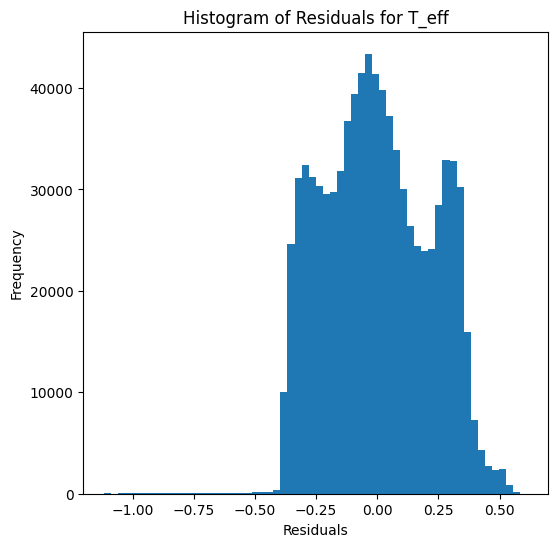

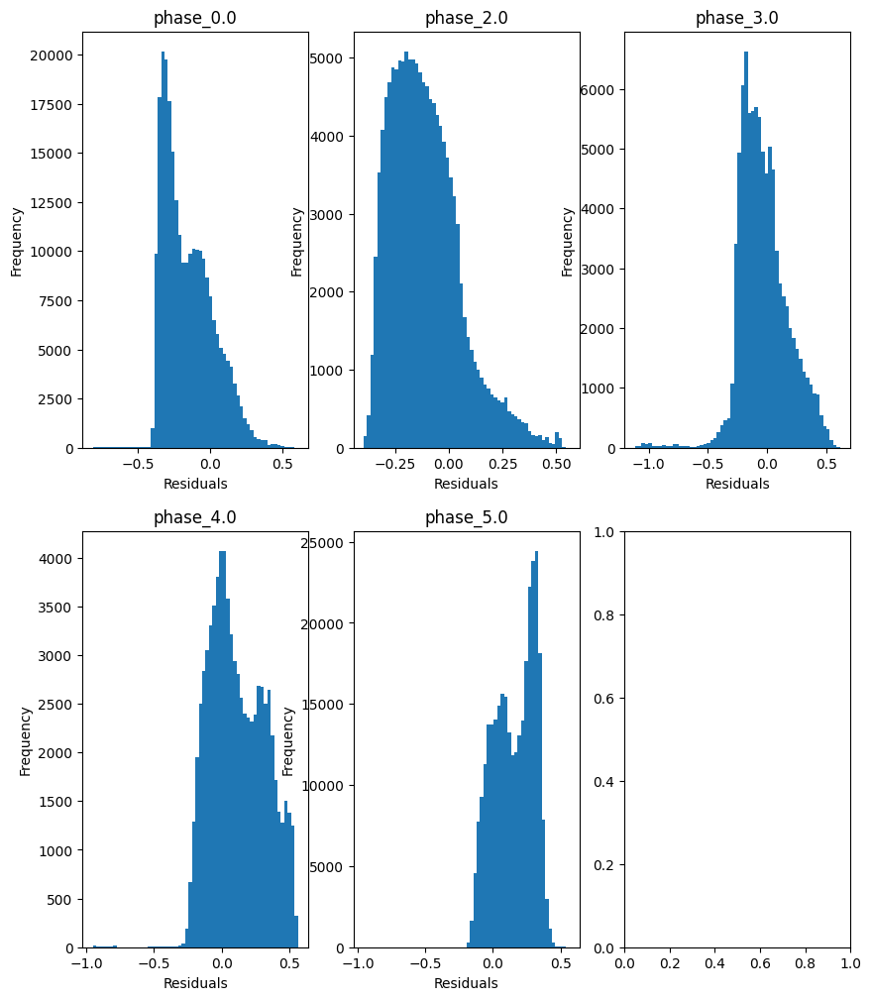

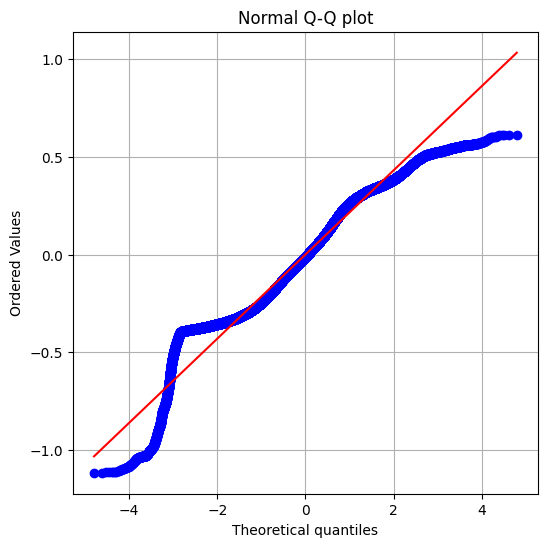

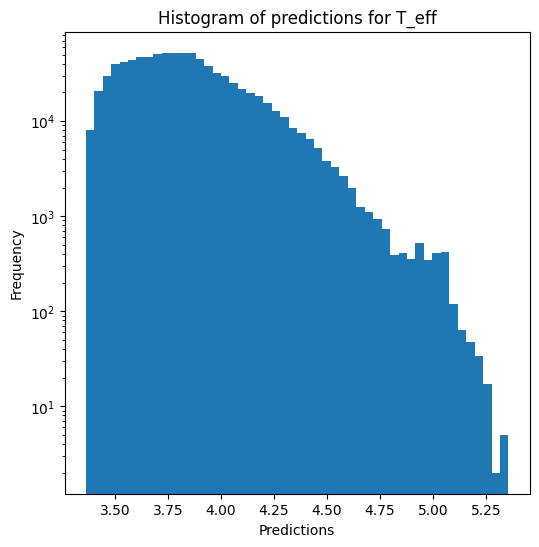

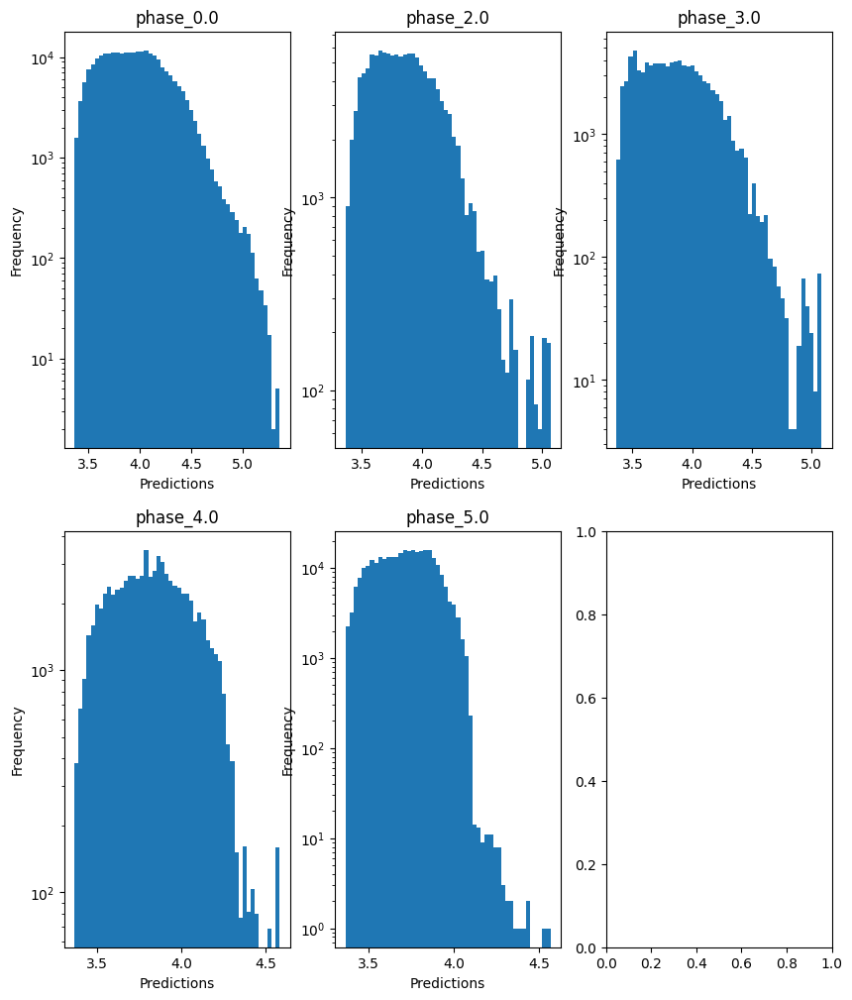

no negative values

log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  -1.6764404810619689
  RMSE :  2.2191882789535393
  MAE :  2.024113118848547
  MedAE :  1.960816638005118
  CORR :  -0.09166160425591395
  MAX_ER :  4.387659091389643
  Percentiles : 
    75th percentile :  2.6815672398480386
    90th percentile :  3.334528733267368
    95th percentile :  3.6007461409658386
    99th percentile :  3.96536756123626

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.408311770676233
  RVE :  0.06316315232088132
  RMSE :  1.0988193492360585
  MAE :  0.8993252104471419
  MedAE :  0.7691446567386784
  CORR :  0.4014154584172252
  MAX_ER :  3.416112559974204
  Percentiles : 
    75th percentile :  1.2973418124956337
    90th percentile :  1.8016557079149984
    95th percentile :  2.111373453527364
    99th percentile :  2.6654033865442743

log_g results for the phase catego

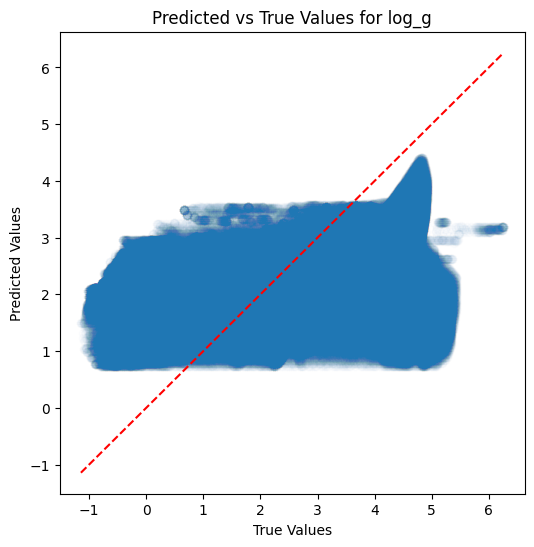

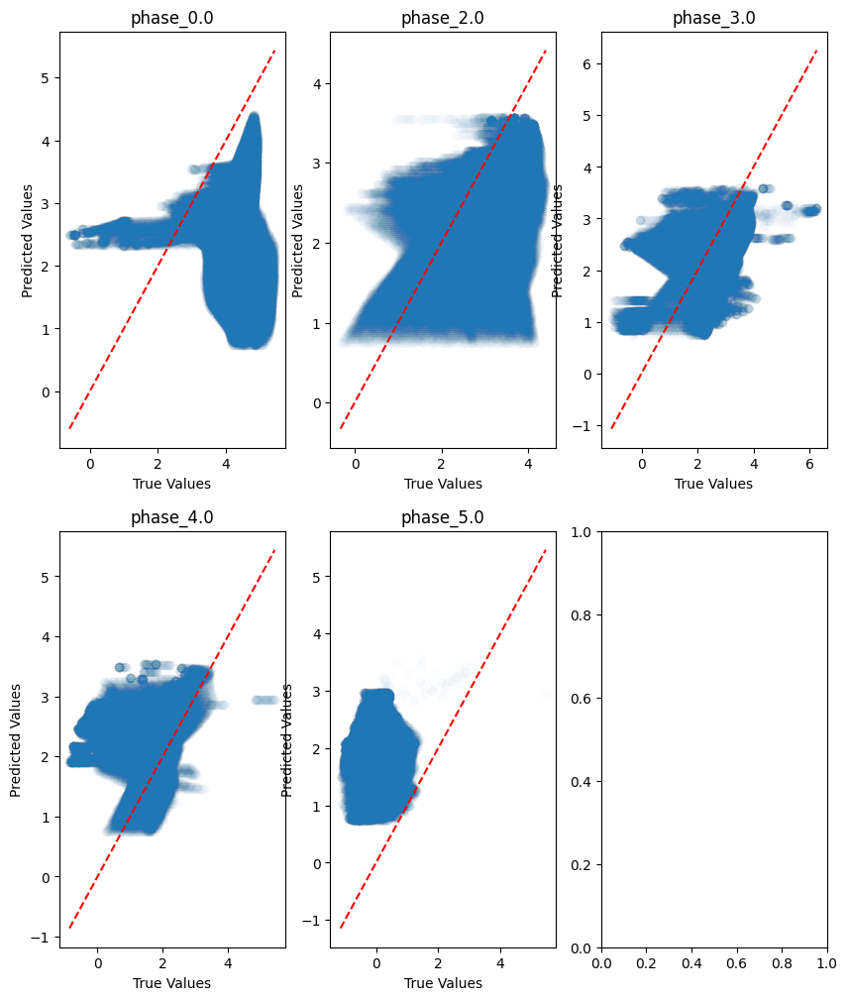

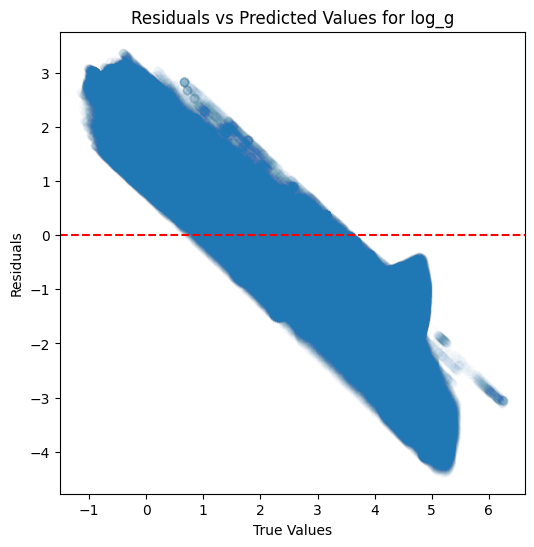

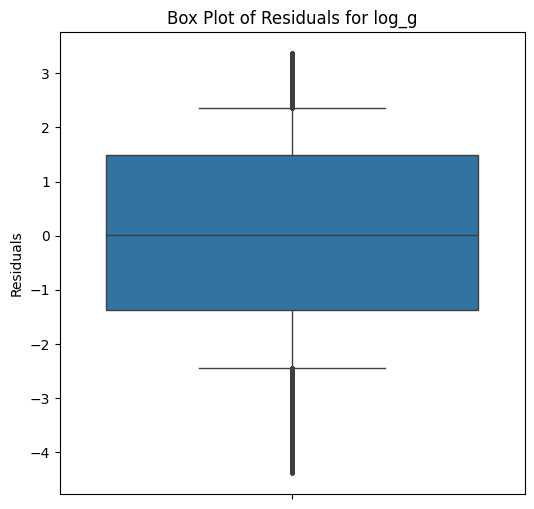

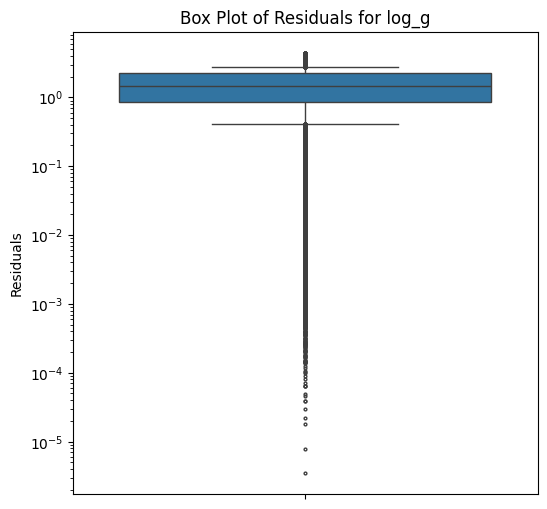

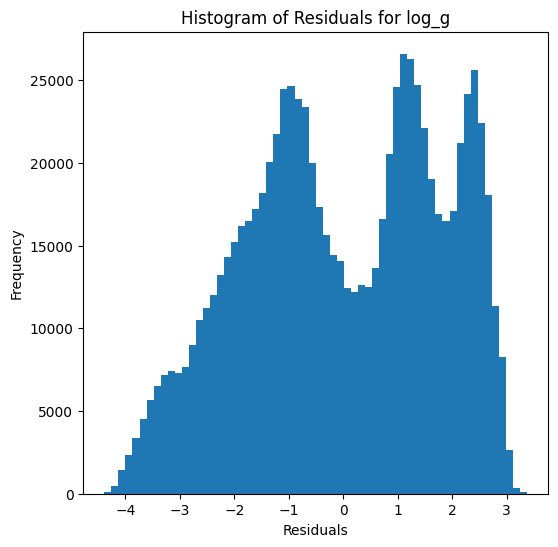

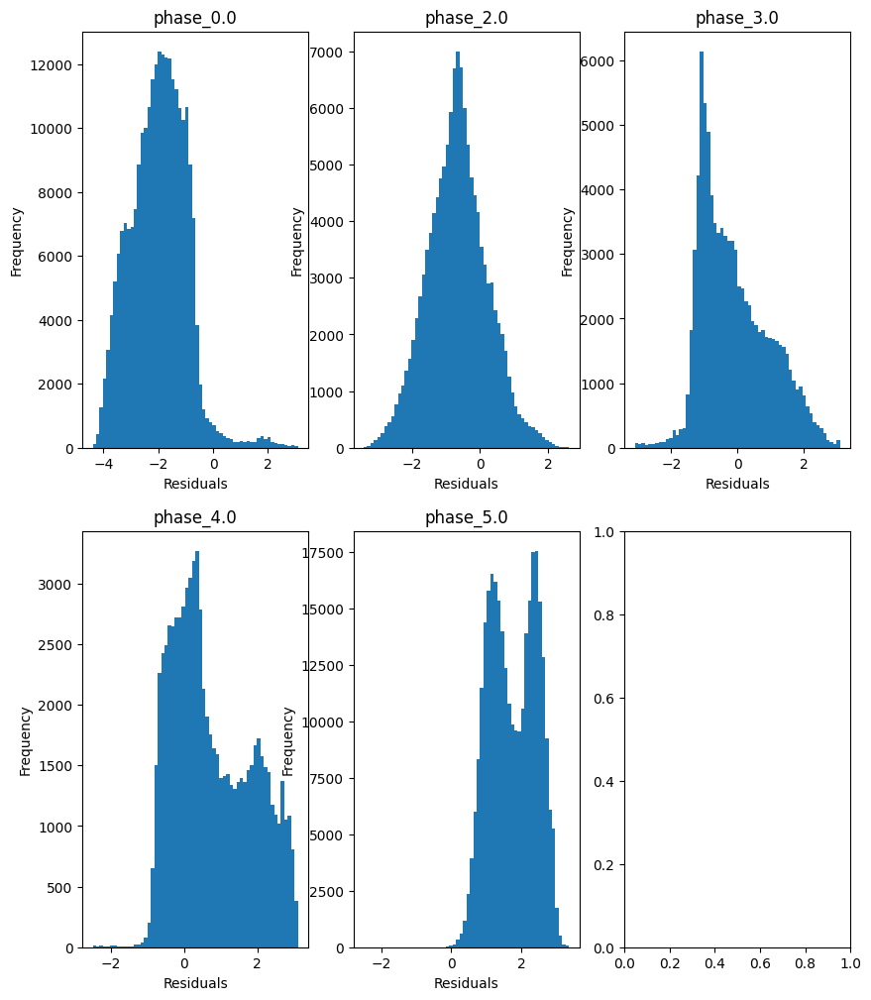

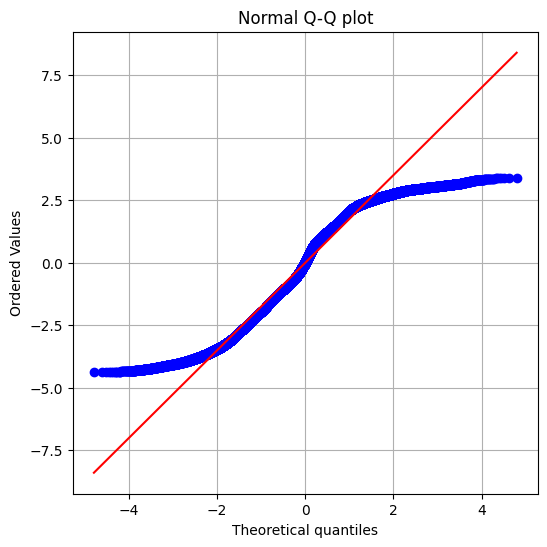

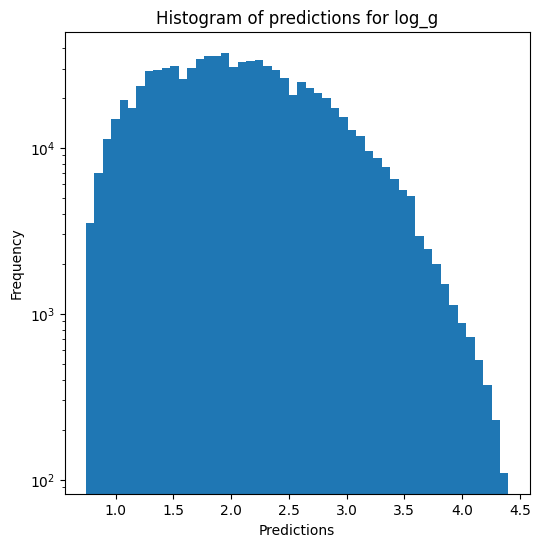

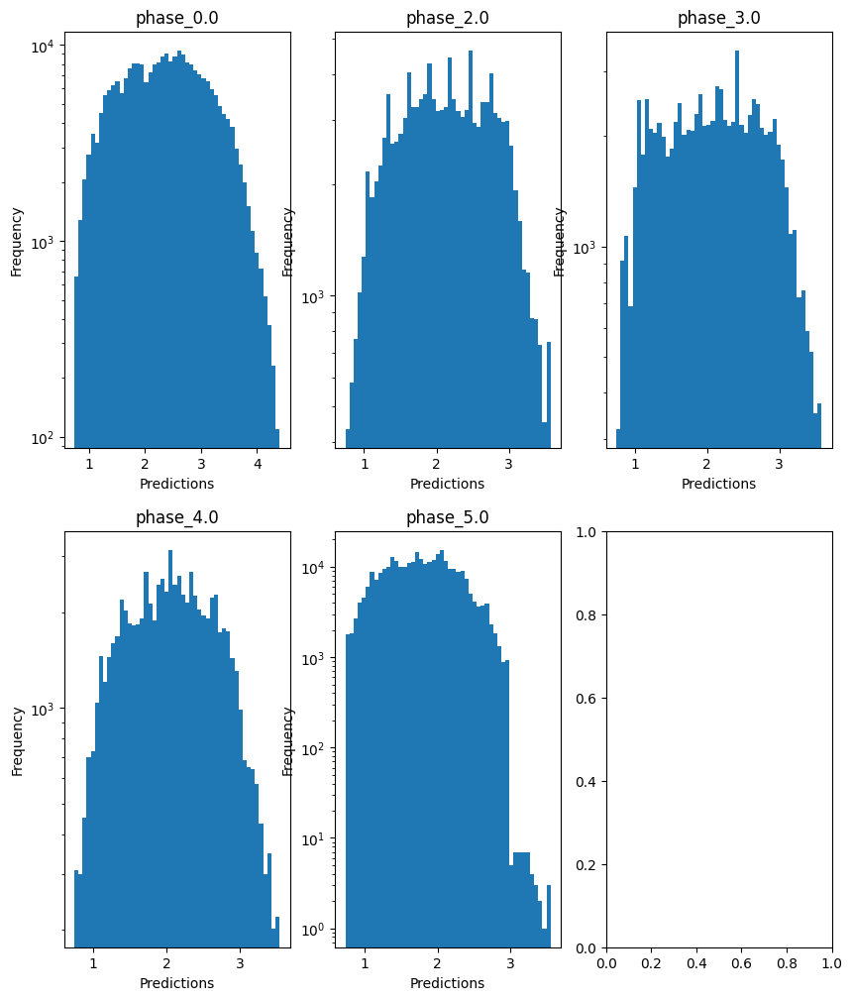

no negative values

radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.0827540579576227
  RVE :  -0.06485552171129982
  RMSE :  1.2154313506599925
  MAE :  1.094939191122202
  MedAE :  1.0630274553144965
  CORR :  0.08671985051816705
  MAX_ER :  2.5913426684529366
  Percentiles : 
    75th percentile :  1.4437125494155594
    90th percentile :  1.829945796243677
    95th percentile :  2.0530259147262426
    99th percentile :  2.324465840689578

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.891706235288321
  RVE :  0.14777388633181388
  RMSE :  0.5250459684478384
  MAE :  0.4199209202856378
  MedAE :  0.35173594270626796
  CORR :  0.3845213019416885
  MAX_ER :  1.637481694579149
  Percentiles : 
    75th percentile :  0.6185214156796125
    90th percentile :  0.8798566902410665
    95th percentile :  1.034068092506048
    99th percentile :  1.2920856018642235

radius results for the phase

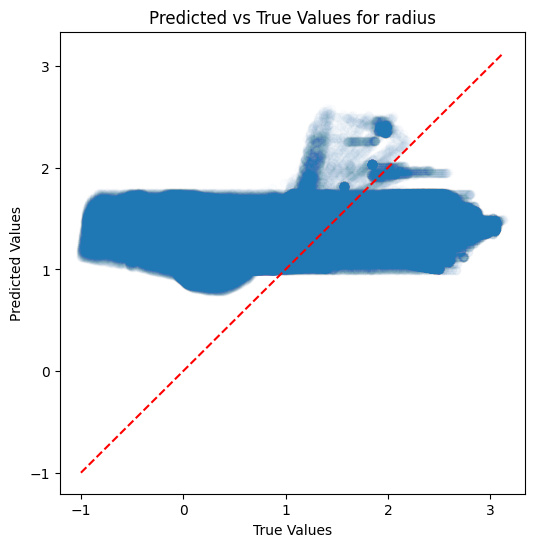

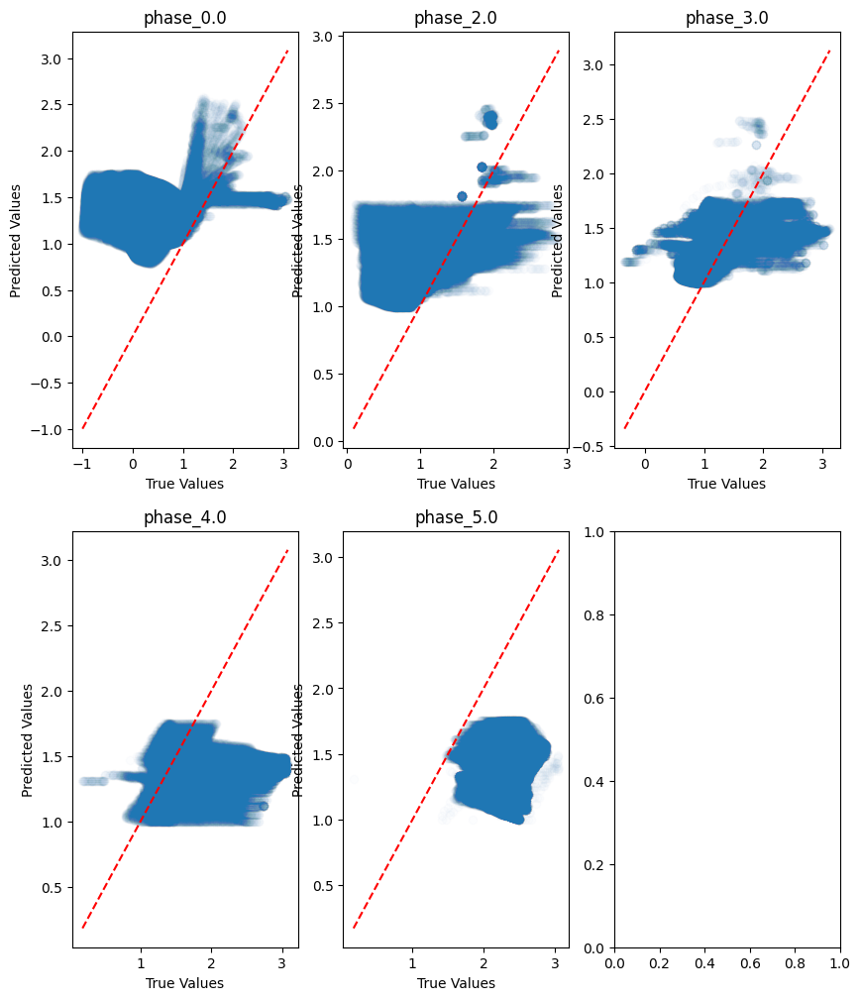

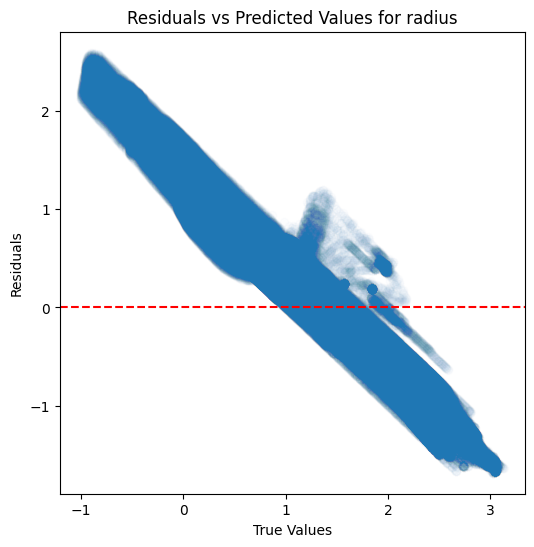

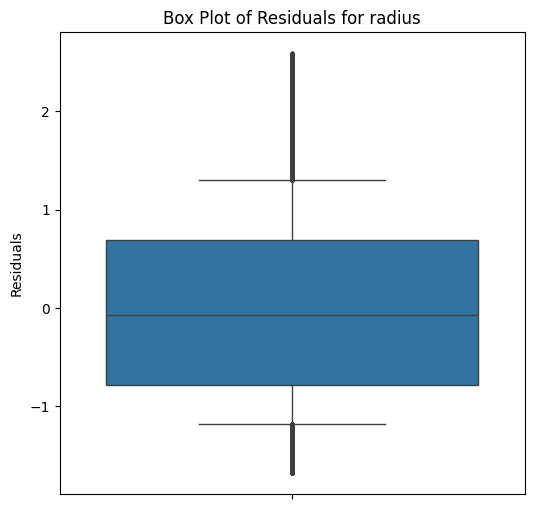

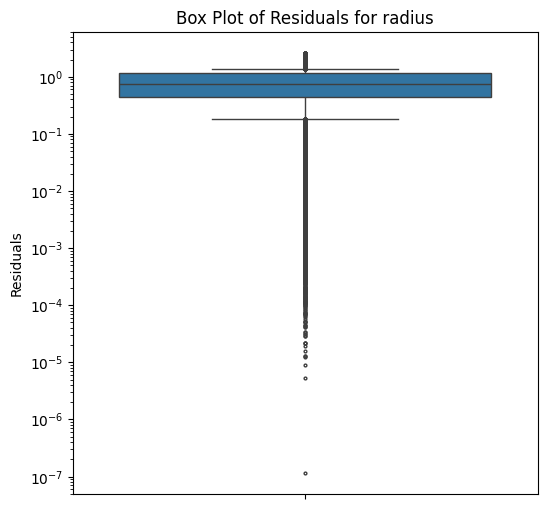

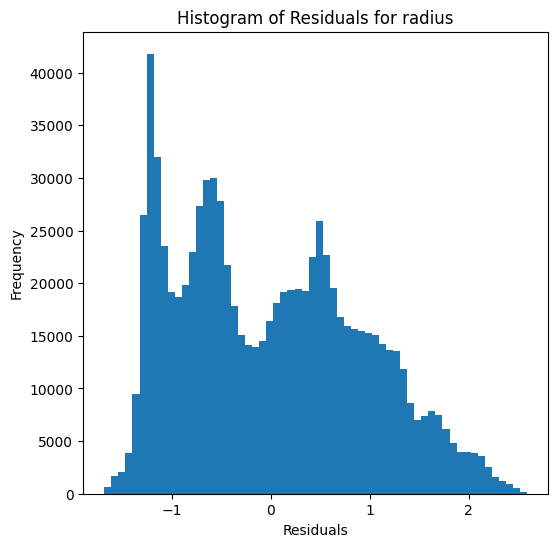

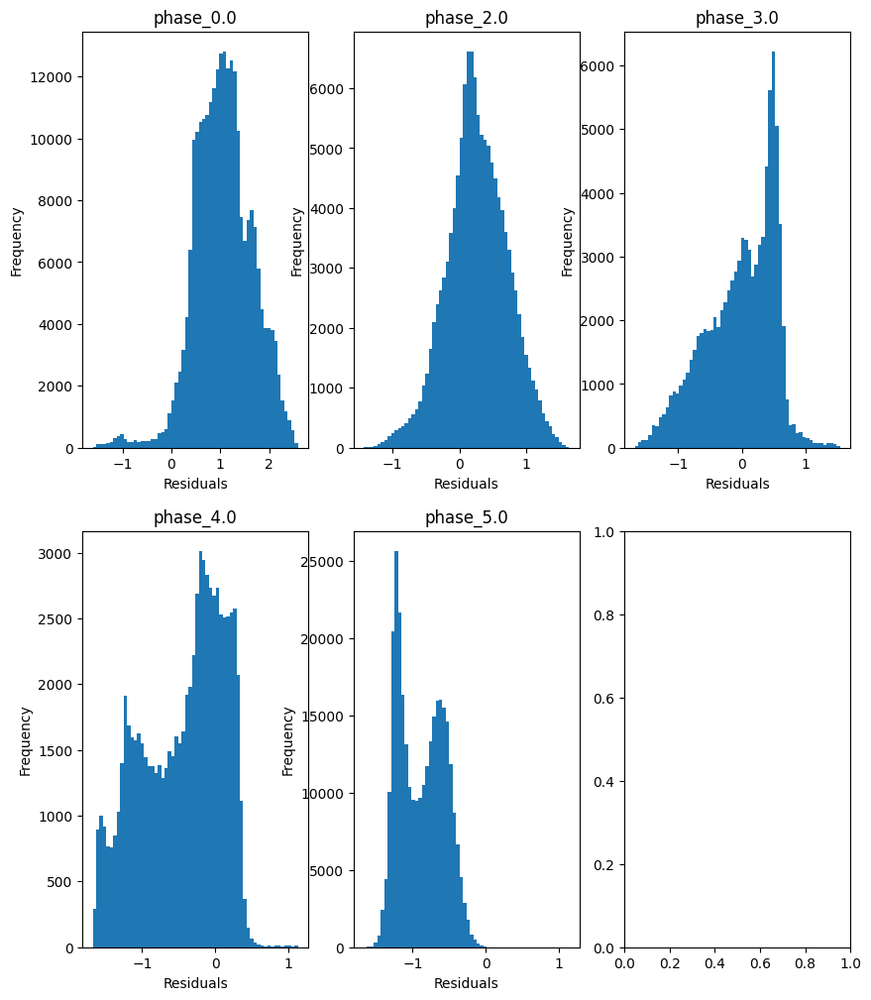

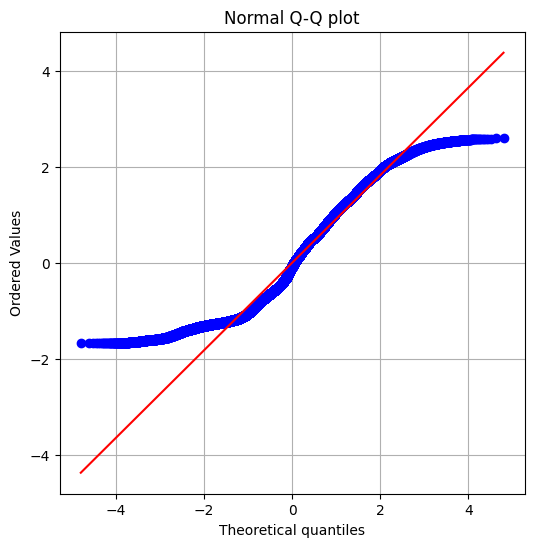

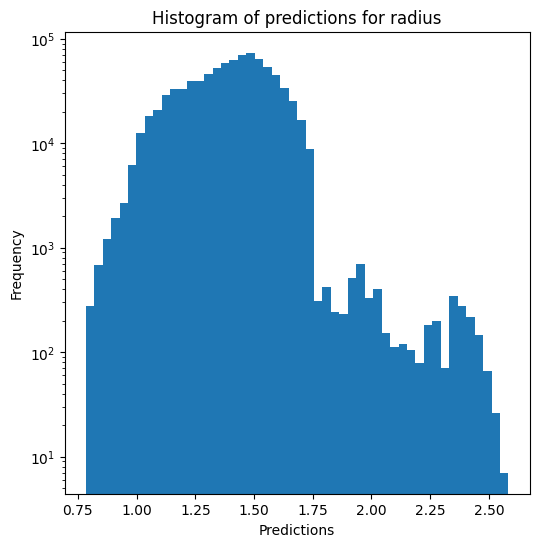

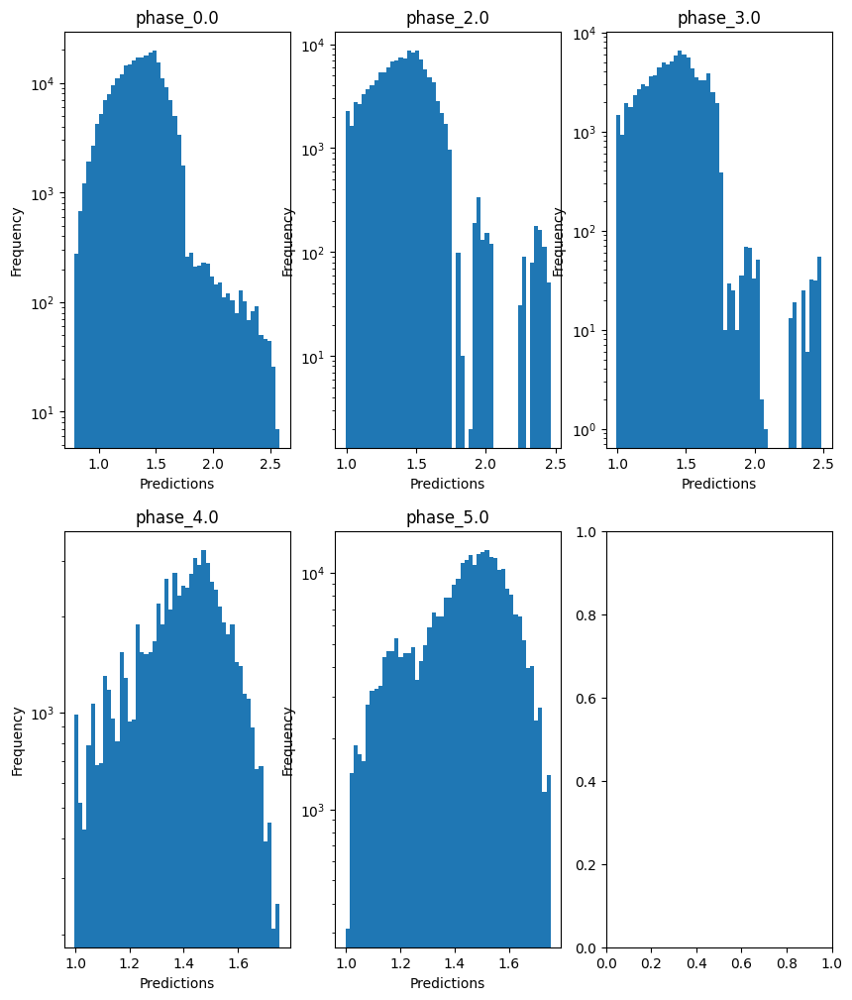

Saving results...


In [11]:
lr_evaluator.evaluate_Kfold_results(LinearRegression, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show) # override=True, use_preds=False

### Decision tree

In [12]:
dt_evaluator = Model_evaluator("decision_tree", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


Base_old train data :
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.7247383819259099
  RMSE :  0.200354922376183
  MAE :  0.08439660278825675
  MedAE :  0.0015902783929613307
  CORR :  0.8922053034189579
  MAX_ER :  0.9649891692791774
  Percentiles : 
    75th percentile :  0.005969481830111478
    90th percentile :  0.40698854832606574
    95th percentile :  0.5537342899969694
    99th percentile :  0.6769590325072355

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.711472733477716
  RVE :  0.905323871232318
  RMSE :  0.09884681355452239
  MAE :  0.03910022212908641
  MedAE :  0.0034303074851183
  CORR :  0.9547119780178087
  MAX_ER :  0.8499651329223448
  Percentiles : 
    75th percentile :  0.021553379925060567
    90th percentile :  0.1343549772302145
    95th percentile :  0.2041163502206092
    99th percentile 

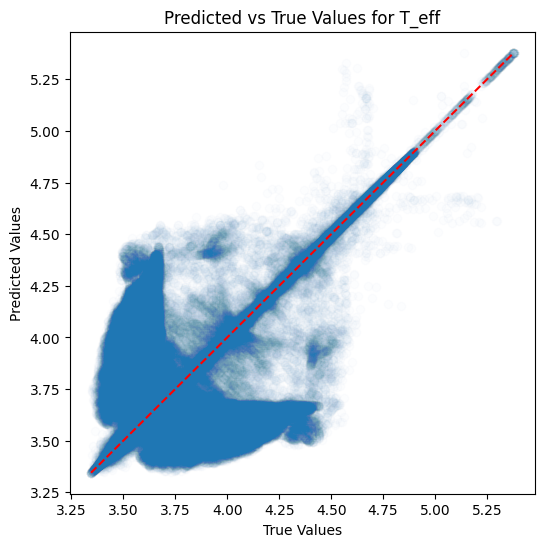

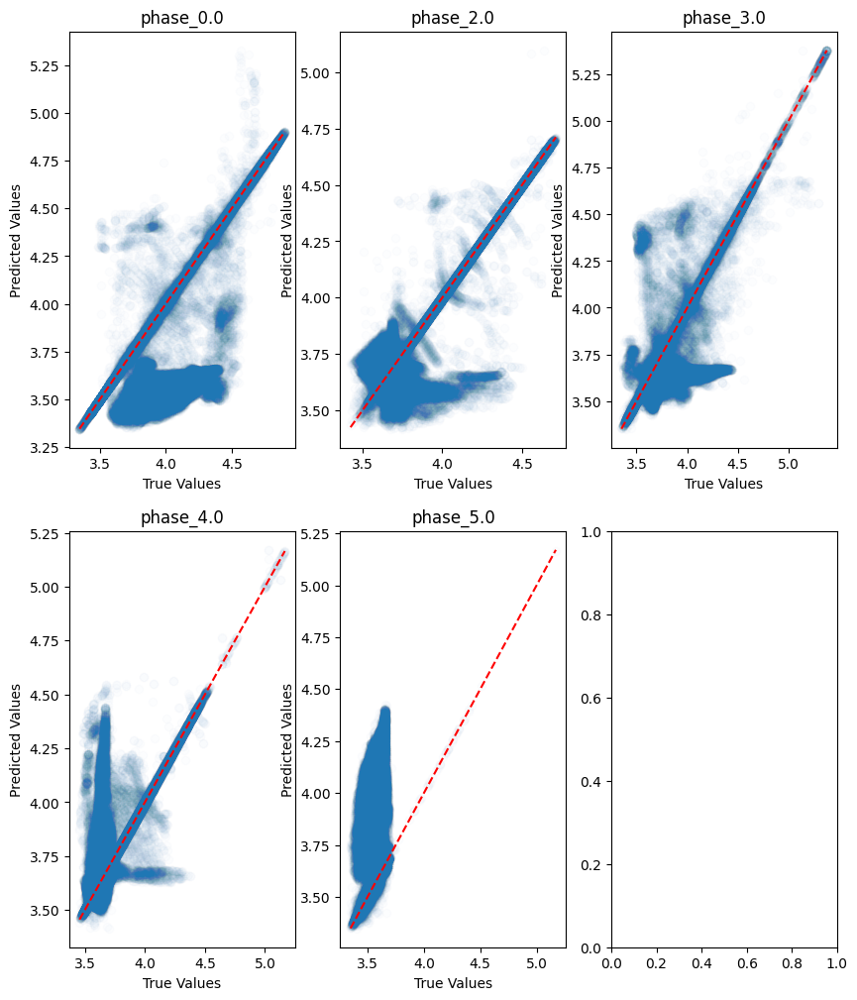

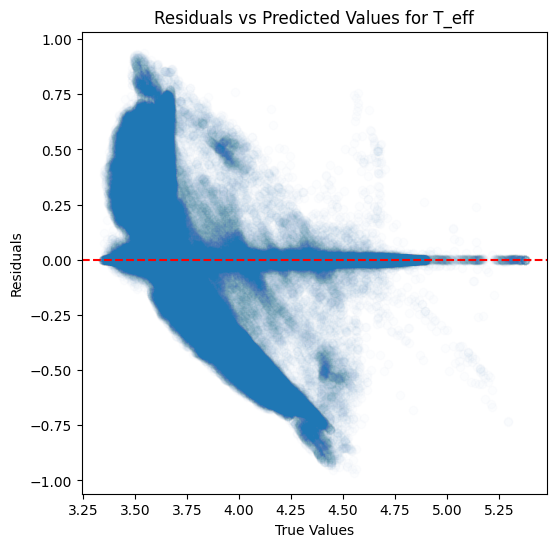

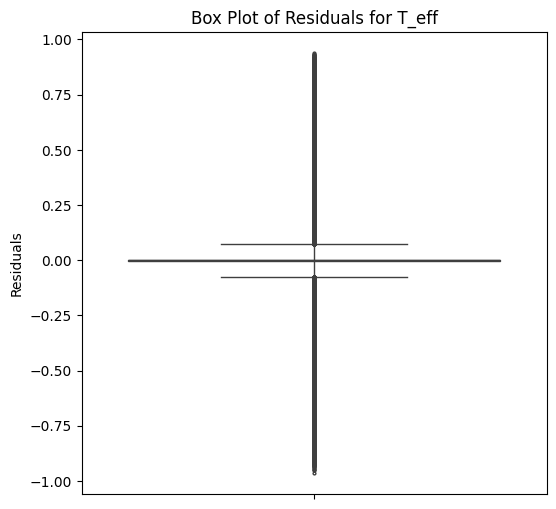

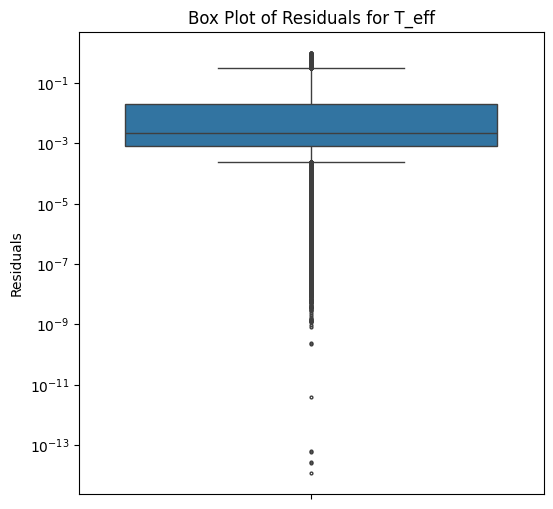

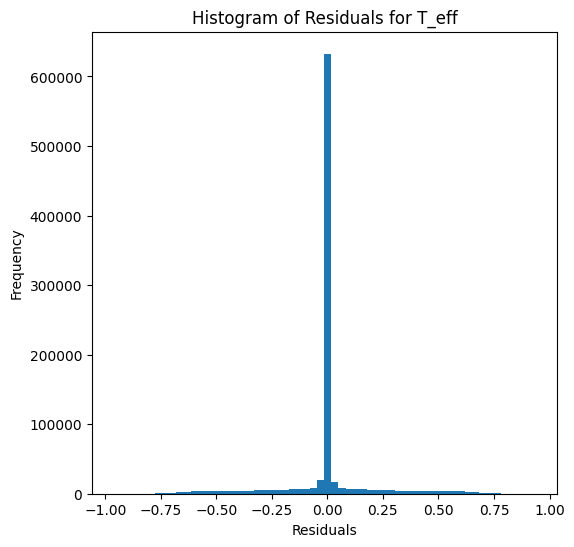

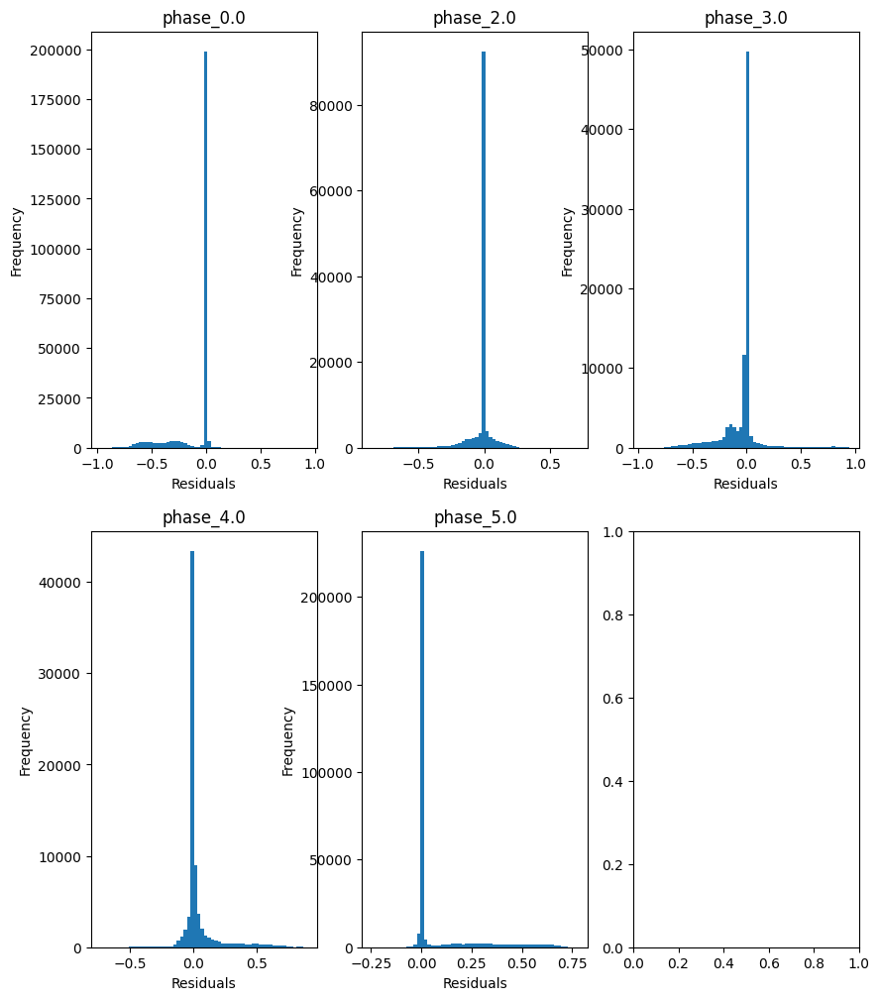

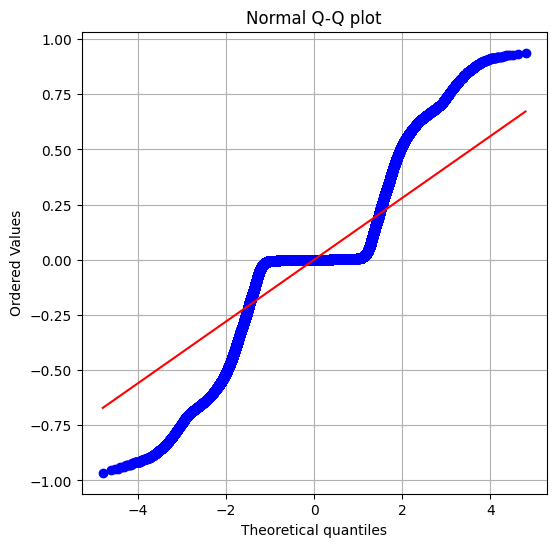

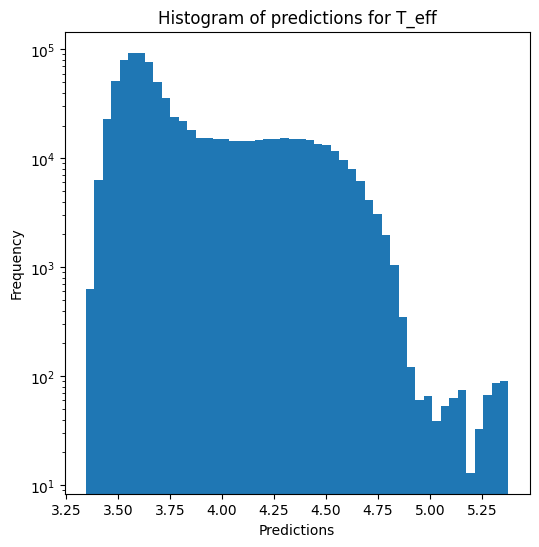

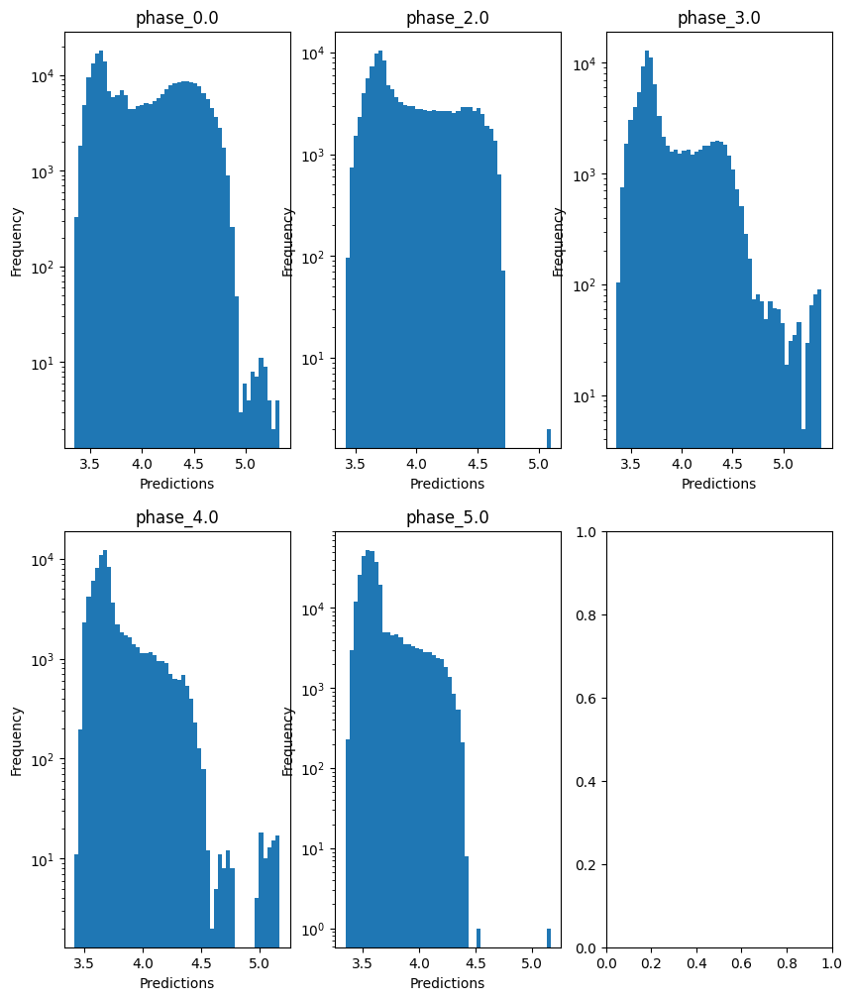


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  -6.90801980396228
  RMSE :  1.9329554758206262
  MAE :  0.8434755600003592
  MedAE :  0.005210642675165467
  CORR :  0.31766649655990514
  MAX_ER :  5.6661149730833635
  Percentiles : 
    75th percentile :  0.022286583771712776
    90th percentile :  4.420607416969649
    95th percentile :  4.8684148095586925
    99th percentile :  5.218705542875121

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.408311770676233
  RVE :  -0.5120711194605154
  RMSE :  1.13081330176168
  MAE :  0.51785137413614
  MedAE :  0.016515165460934123
  CORR :  0.382464196194864
  MAX_ER :  4.637418133429539
  Percentiles : 
    75th percentile :  0.3772053259542447
    90th percentile :  2.291091467690279
    95th percentile :  3.075102900472074
    99th percentile :  3.7973584755445797

log_g results for the phase category with a value of

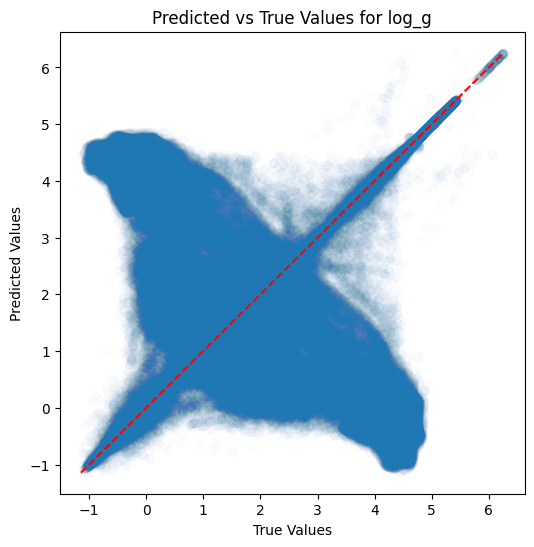

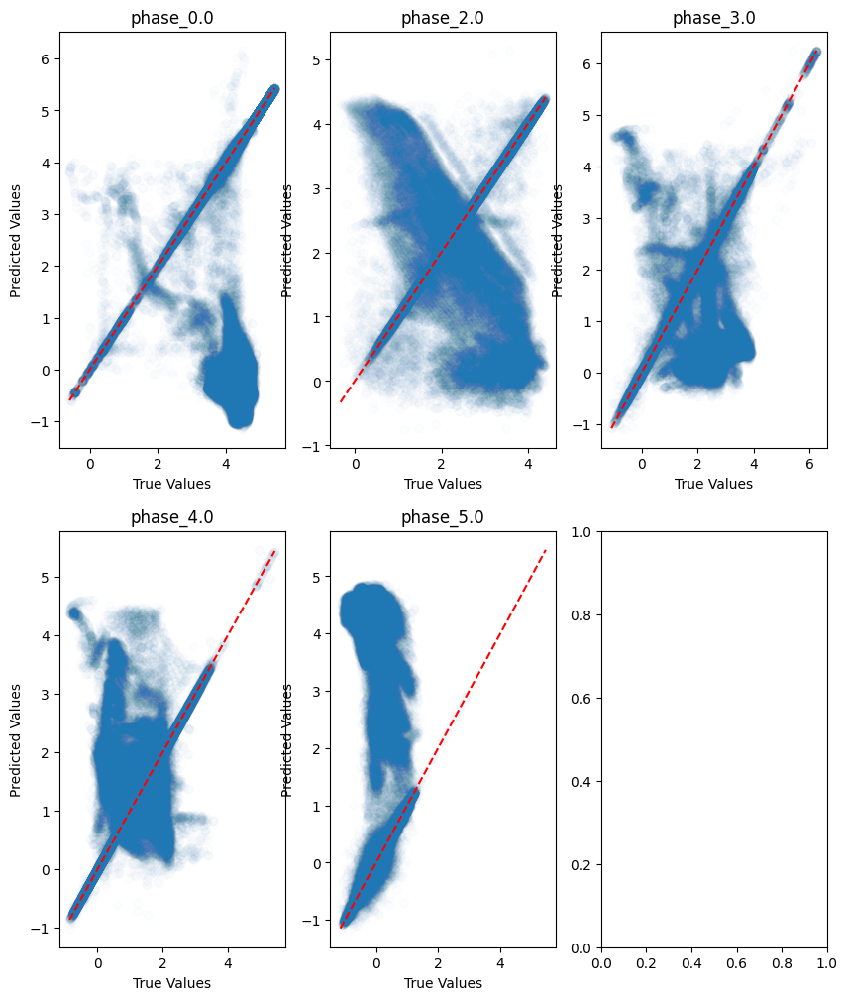

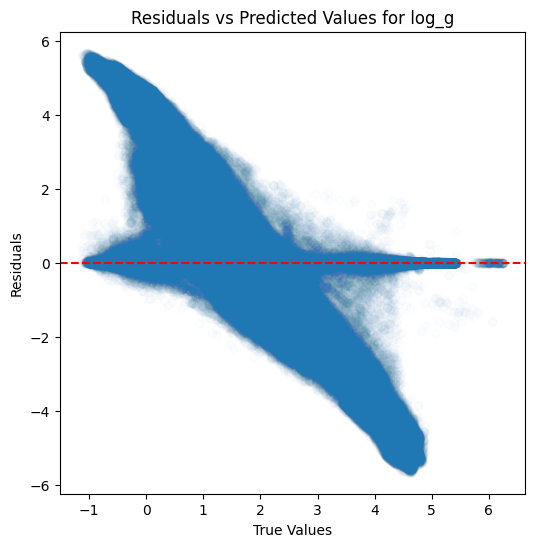

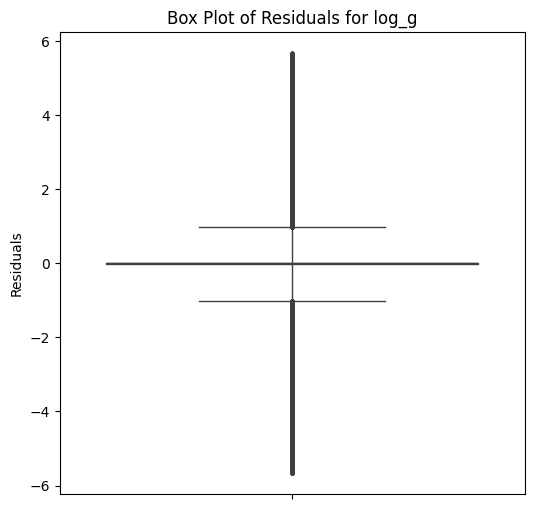

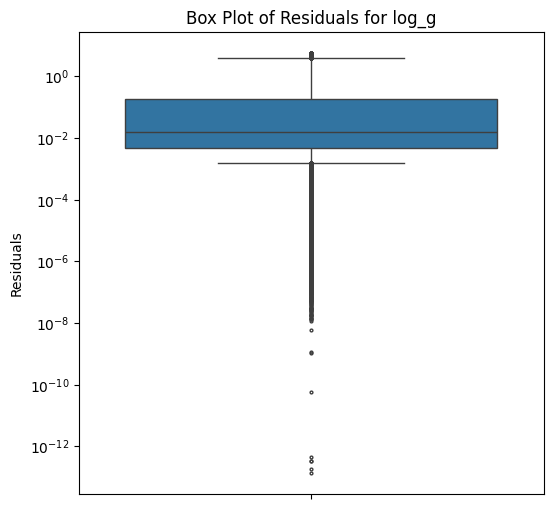

...

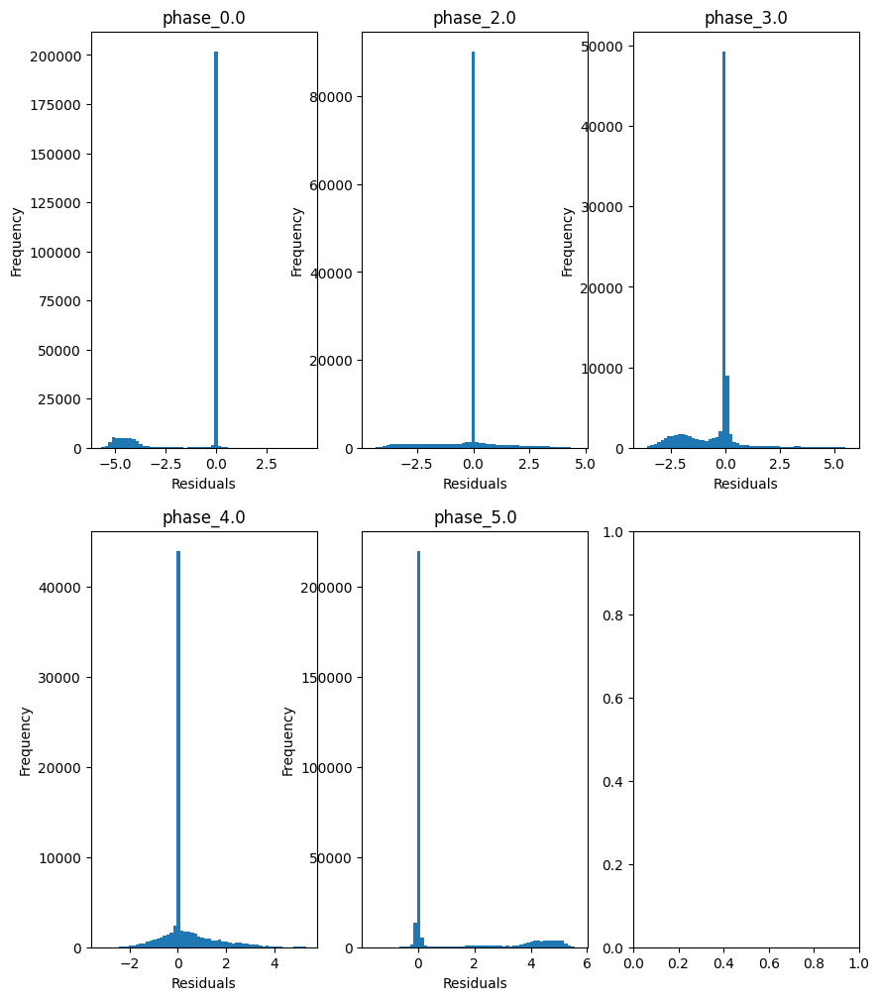

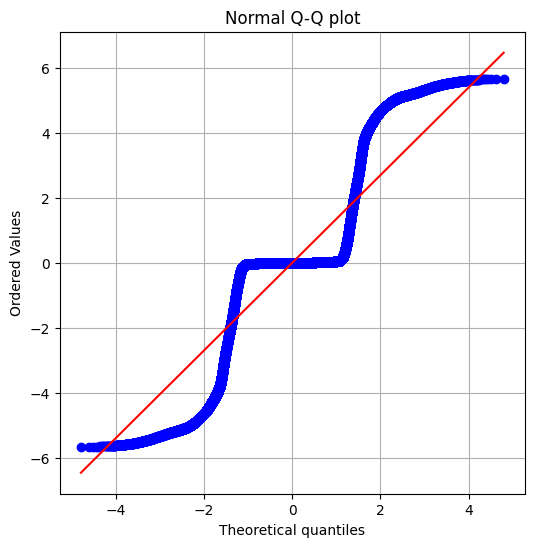

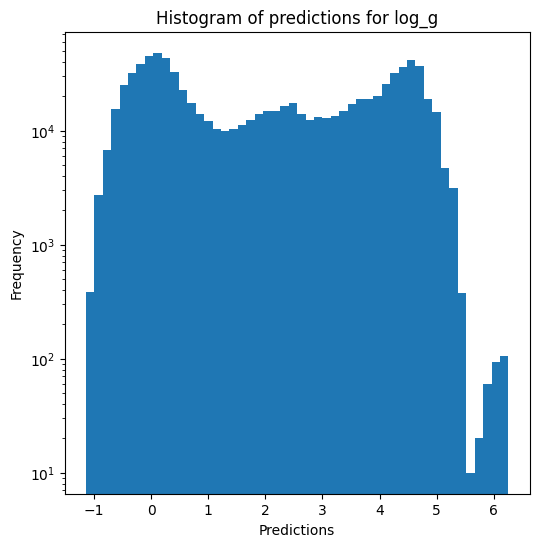

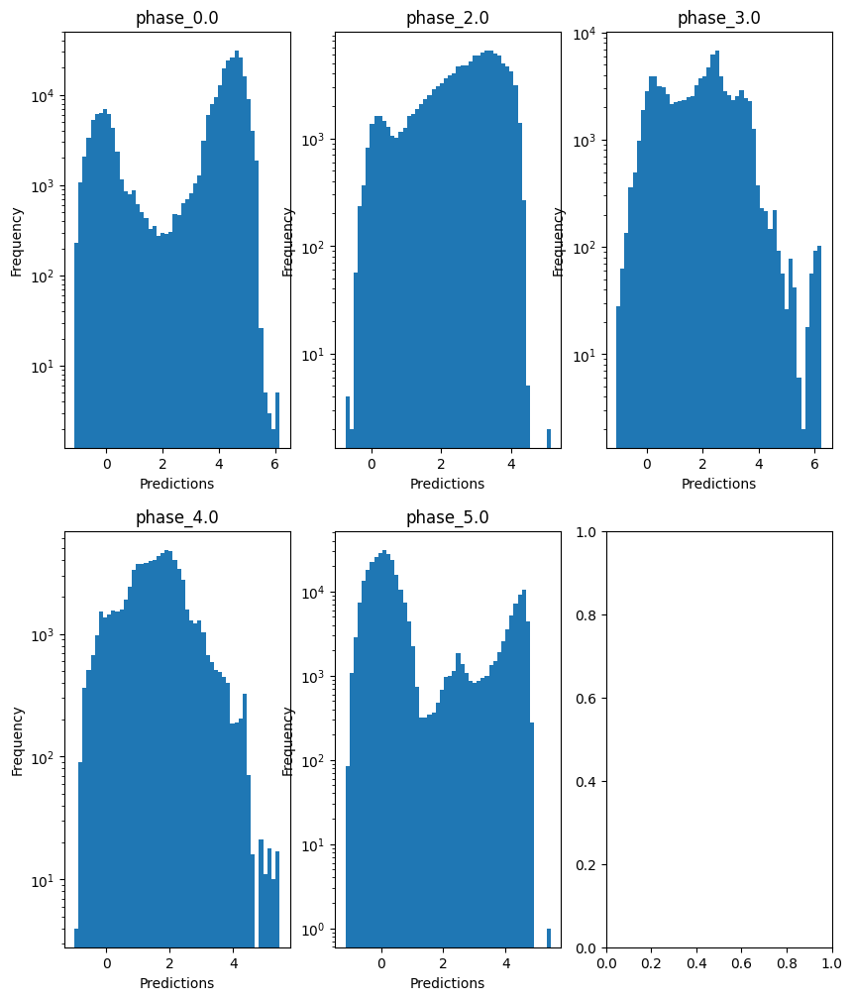

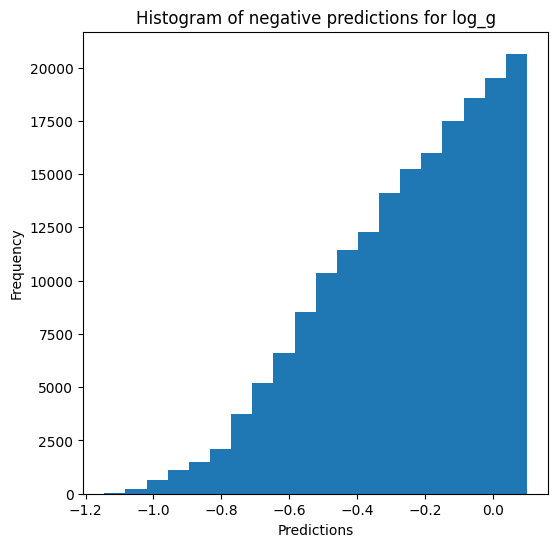


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.0827540579576227
  RVE :  -1.368306199329162
  RMSE :  0.9665546122156351
  MAE :  0.4226083412090723
  MedAE :  0.0038309453080041383
  CORR :  0.4677505161273375
  MAX_ER :  2.834412348699897
  Percentiles : 
    75th percentile :  0.013889915516213158
    90th percentile :  2.210235631664265
    95th percentile :  2.433093638034049
    99th percentile :  2.612453016807953

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.891706235288321
  RVE :  -0.2980615257487369
  RMSE :  0.5654028737038883
  MAE :  0.25893237102063843
  MedAE :  0.00827325767356174
  CORR :  0.43223767683473224
  MAX_ER :  2.3190299467163435
  Percentiles : 
    75th percentile :  0.18858063701998318
    90th percentile :  1.1454228751161328
    95th percentile :  1.5376646764704596
    99th percentile :  1.8984895196227871

radius results for the phase category wit

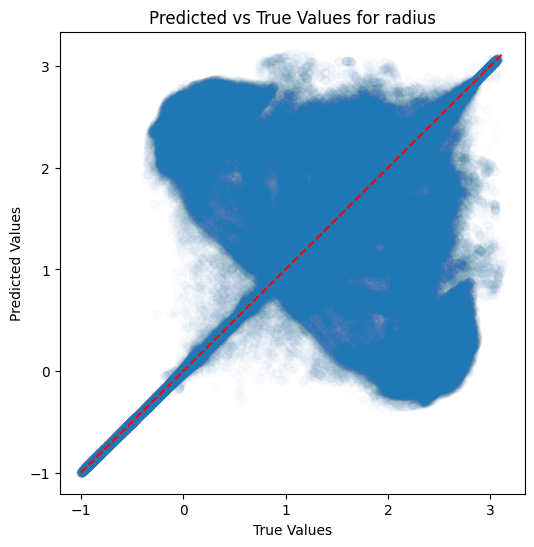

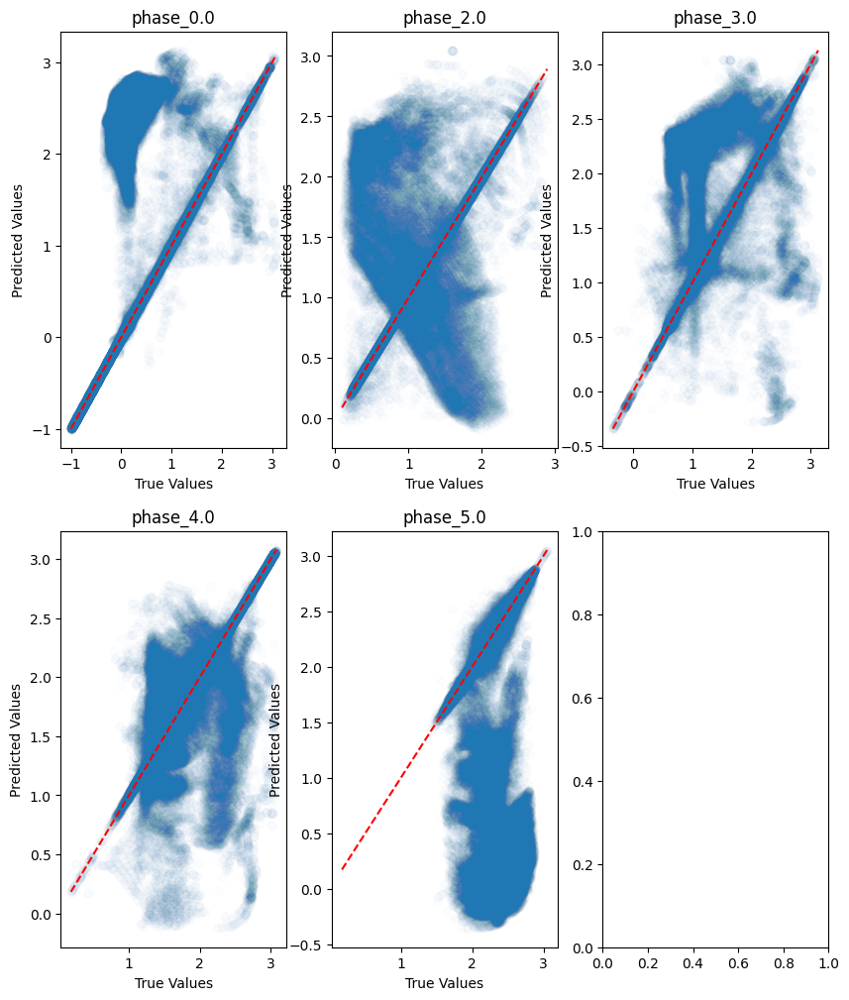

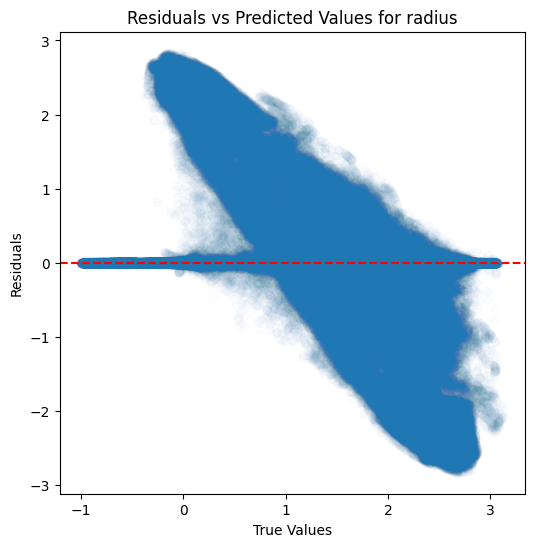

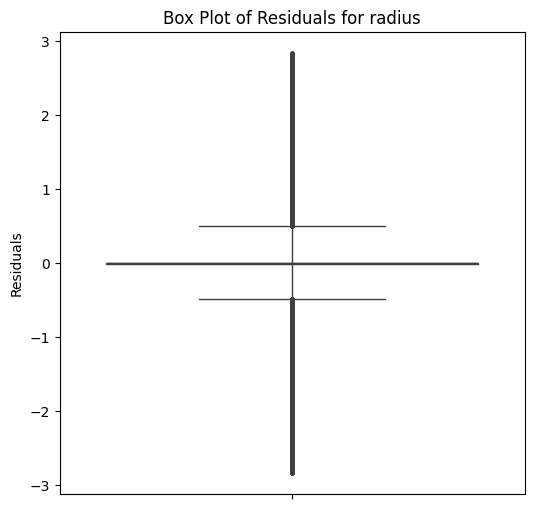

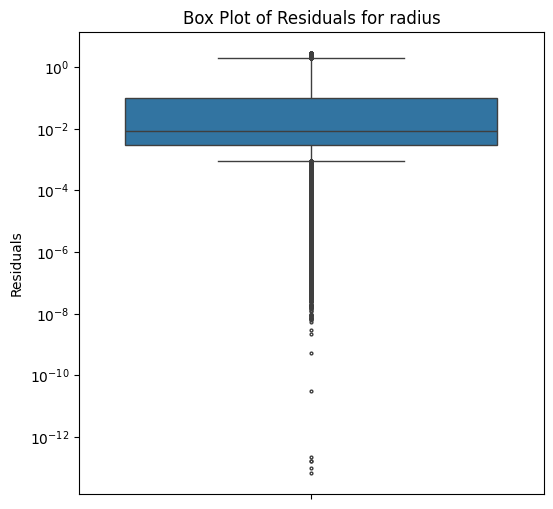

...

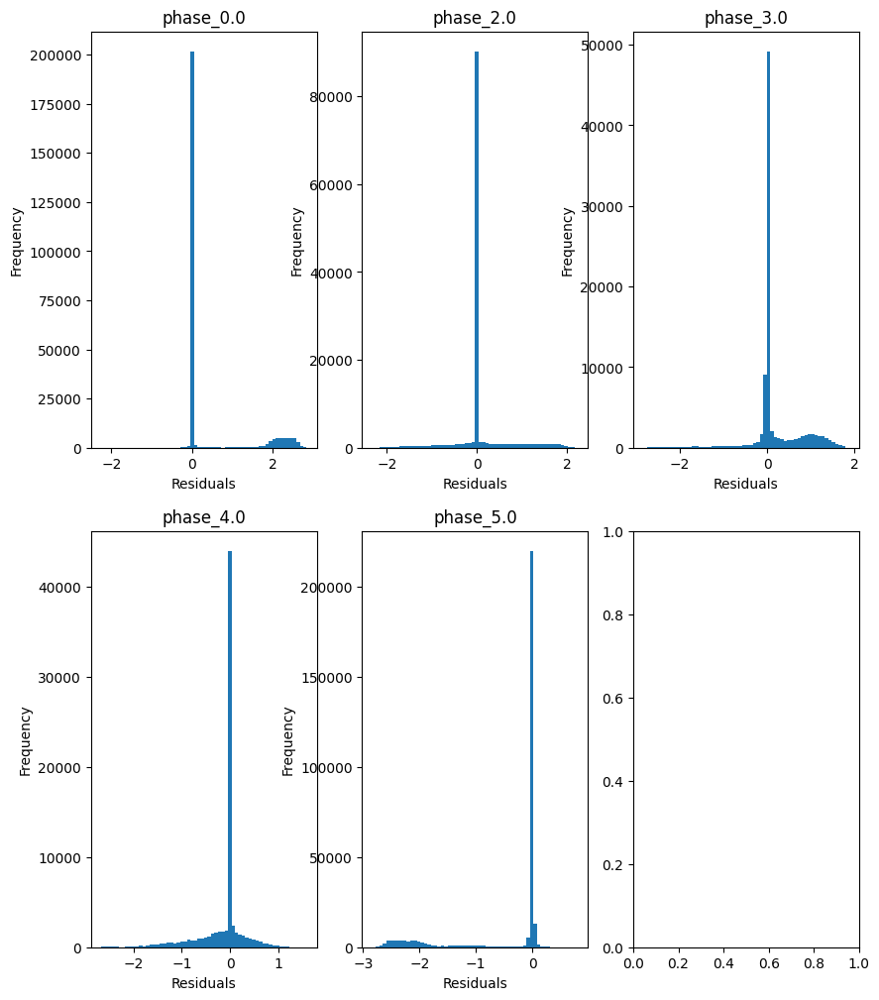

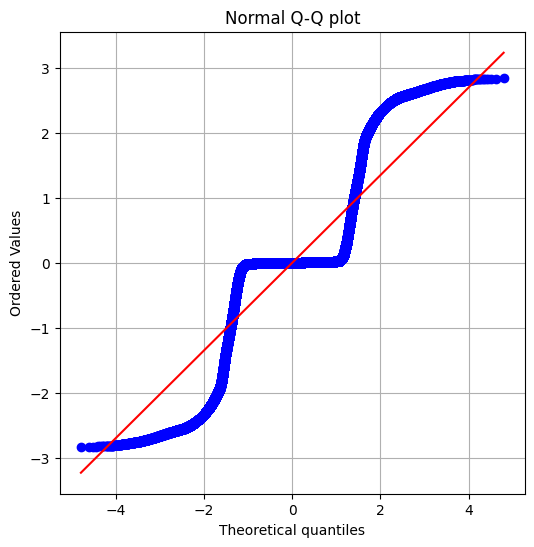

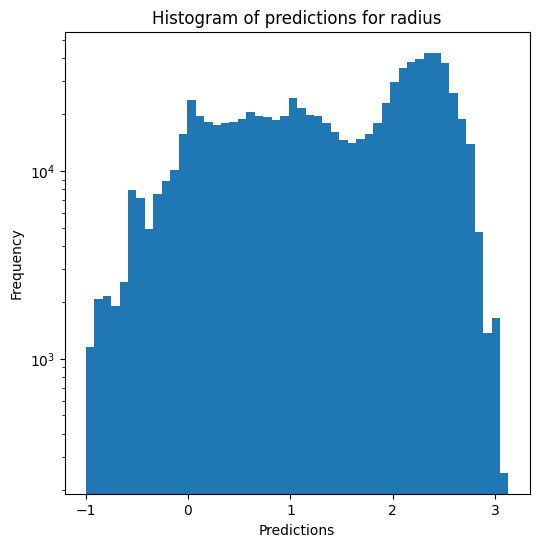

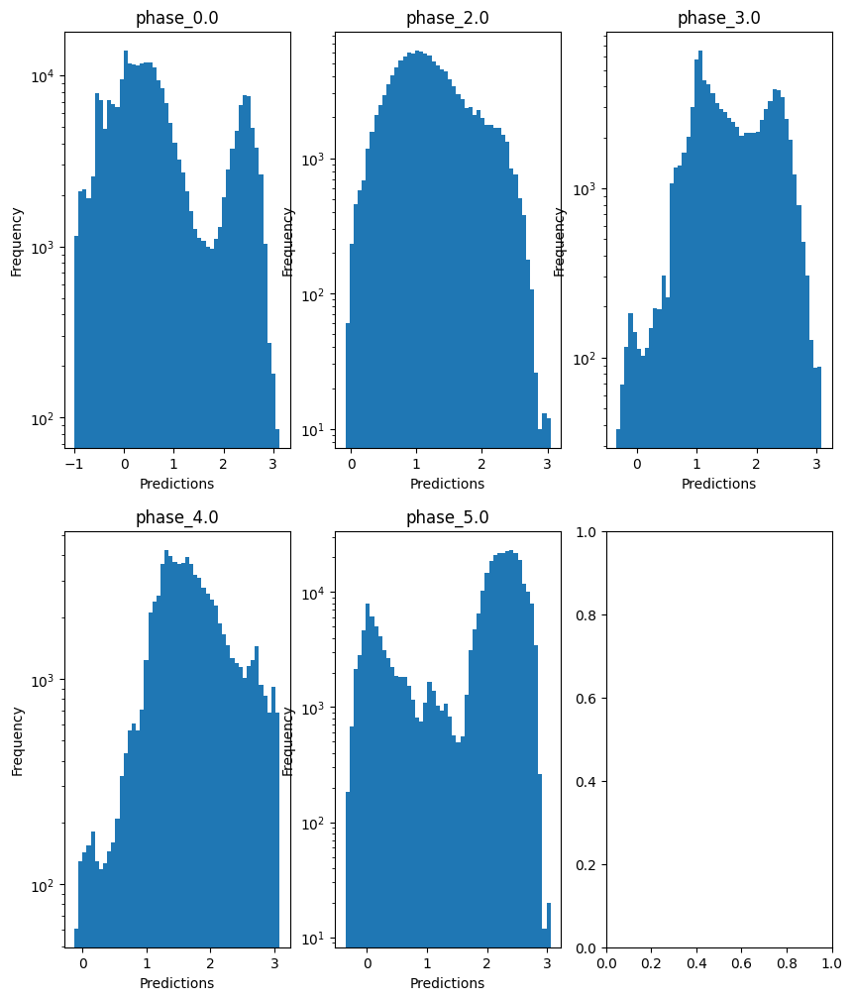

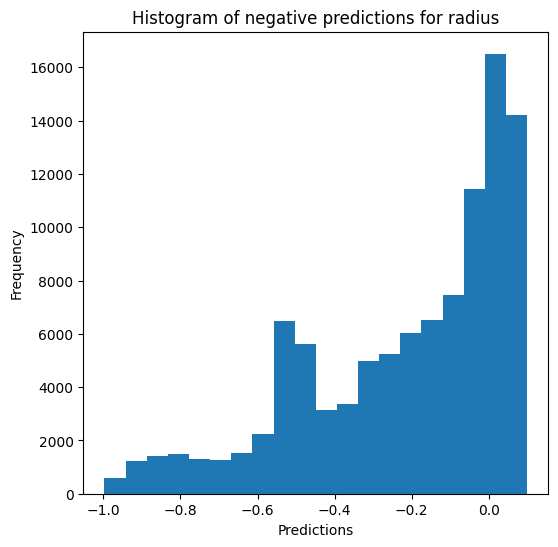

Saving results...


In [13]:
dt_evaluator.evaluate_Kfold_results(DecisionTreeRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show)

### K-nearest neighbours

In [14]:
knn_evaluator = Model_evaluator("KNN", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


Base_old train data :
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.813050528161855
  RMSE :  0.16987250848093588
  MAE :  0.08149554330216252
  MedAE :  0.002583120439206832
  CORR :  0.9188594426258347
  MAX_ER :  0.9388566224146868
  Percentiles : 
    75th percentile :  0.10161407018532098
    90th percentile :  0.2977430581543396
    95th percentile :  0.4443483412479096
    99th percentile :  0.6323973662561121

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.711472733477716
  RVE :  0.9659857476610668
  RMSE :  0.05954762640100076
  MAE :  0.027538665848240513
  MedAE :  0.0029037490856398396
  CORR :  0.9831378507314412
  MAX_ER :  0.7115282609106357
  Percentiles : 
    75th percentile :  0.03198812141552465
    90th percentile :  0.0925758640698361
    95th percentile :  0.1282390174654673
    99th percentil

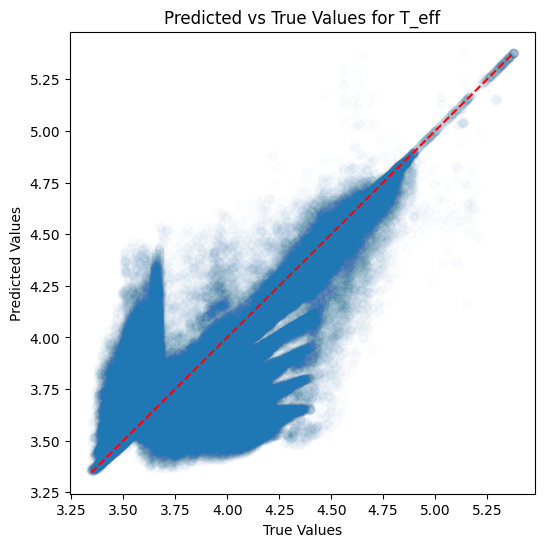

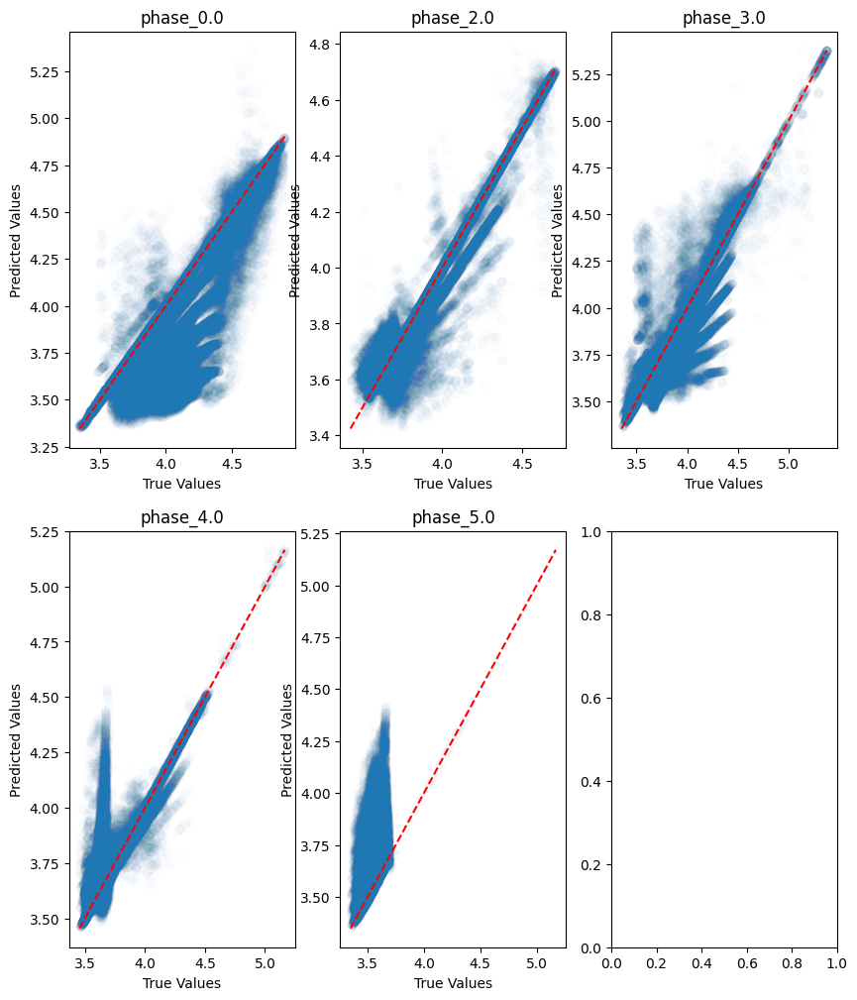

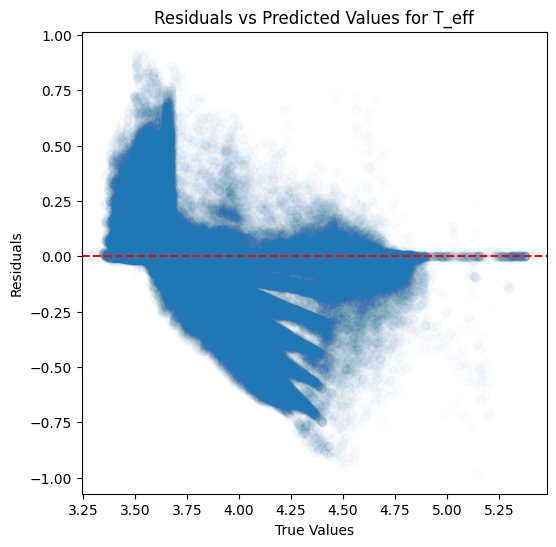

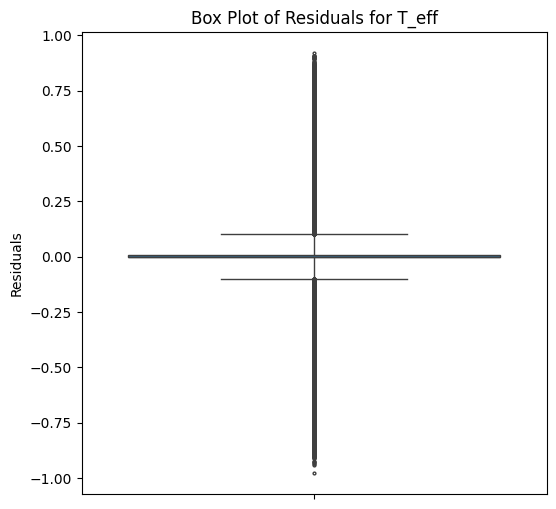

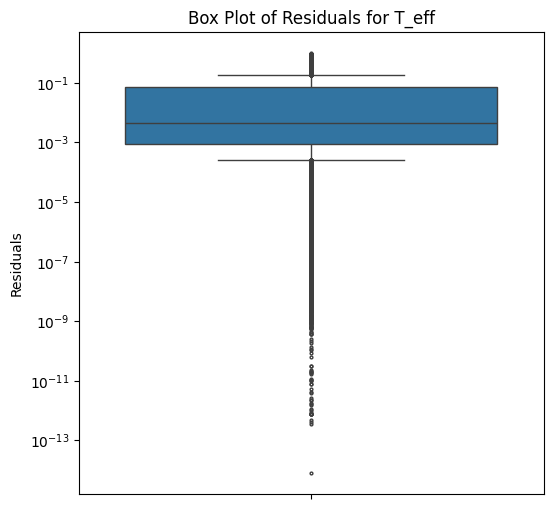

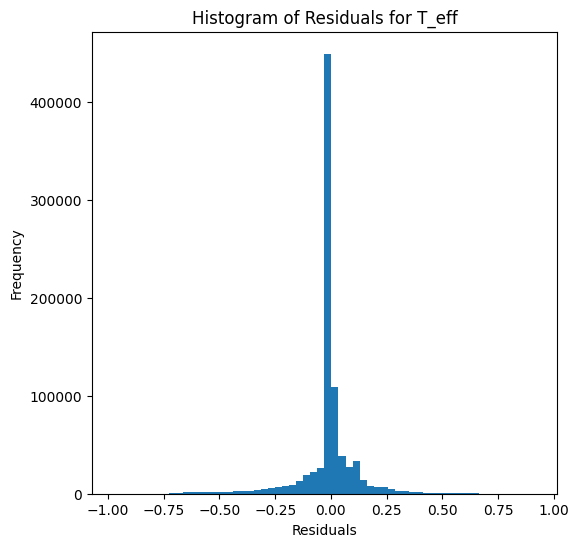

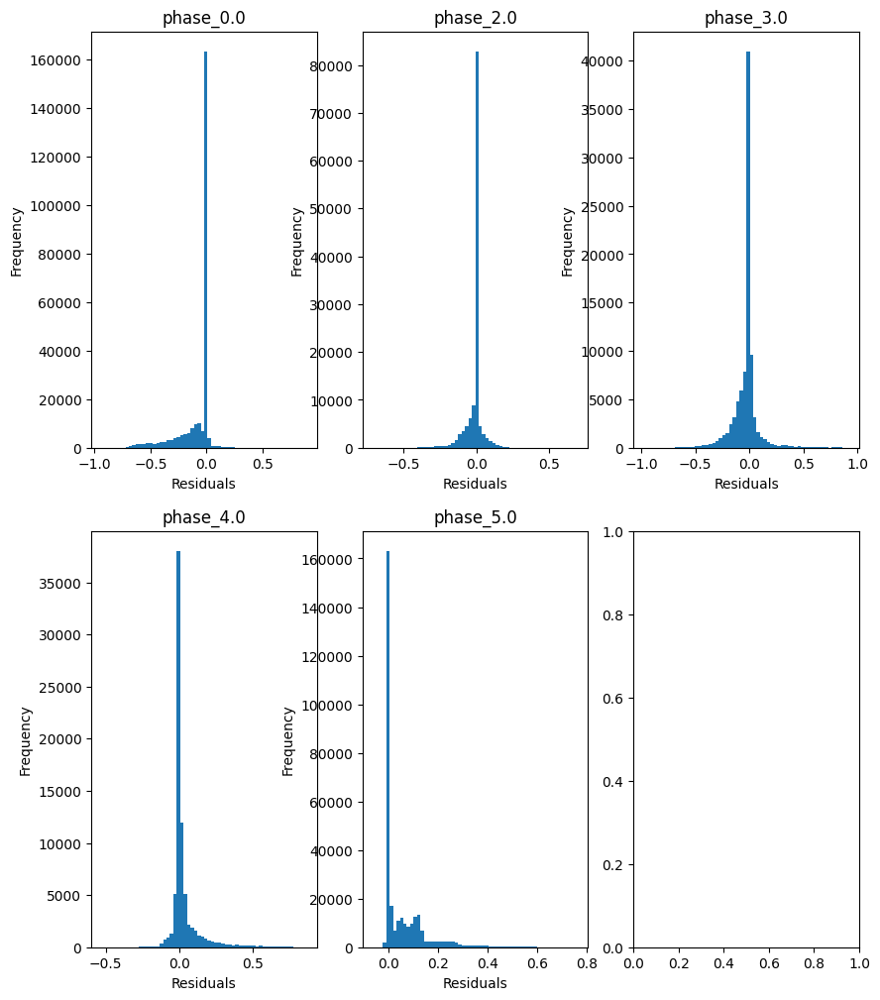

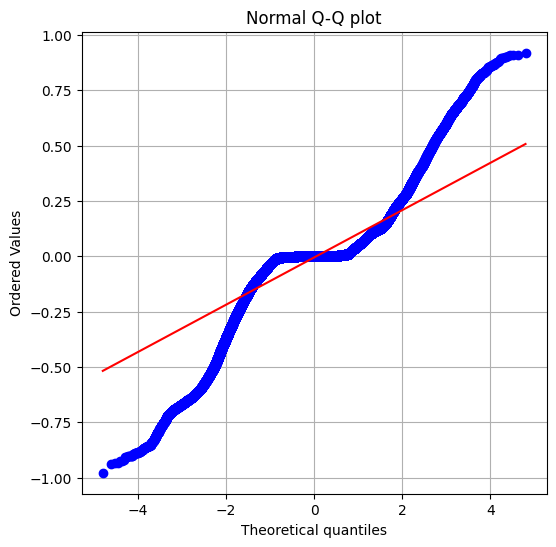

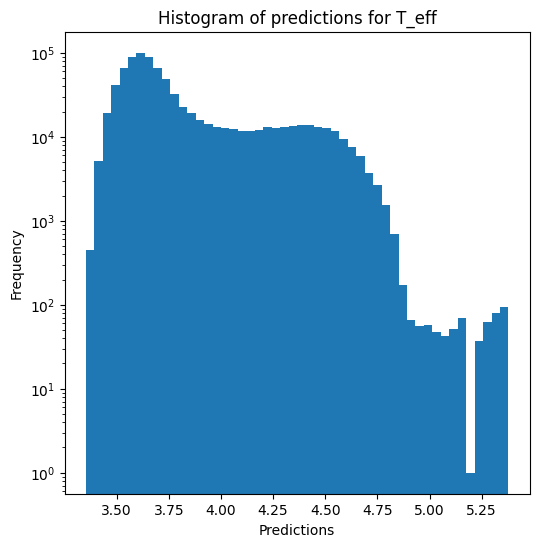

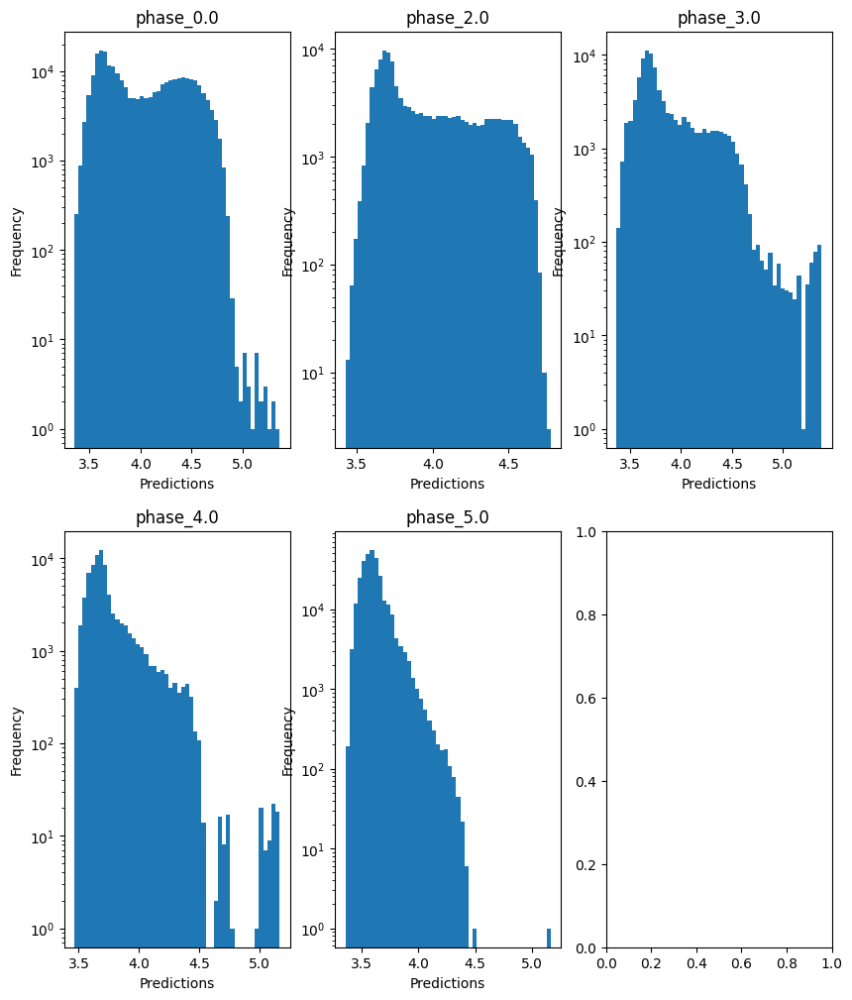


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  -3.993541116659464
  RMSE :  1.5850844055562552
  MAE :  0.7814322539905093
  MedAE :  0.007838884802722212
  CORR :  0.3946518967589391
  MAX_ER :  5.657032422741052
  Percentiles : 
    75th percentile :  0.9487700345513139
    90th percentile :  3.1875314409429563
    95th percentile :  4.204665046661649
    99th percentile :  4.974385481674291

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.408311770676233
  RVE :  0.3181304439605023
  RMSE :  0.7605124712044907
  MAE :  0.3691442716954113
  MedAE :  0.013841450298274216
  CORR :  0.6372517340493061
  MAX_ER :  4.467325614731824
  Percentiles : 
    75th percentile :  0.5334134099705584
    90th percentile :  1.2945409778036696
    95th percentile :  1.854609321011169
    99th percentile :  3.0309022935428835

log_g results for the phase category with a value 

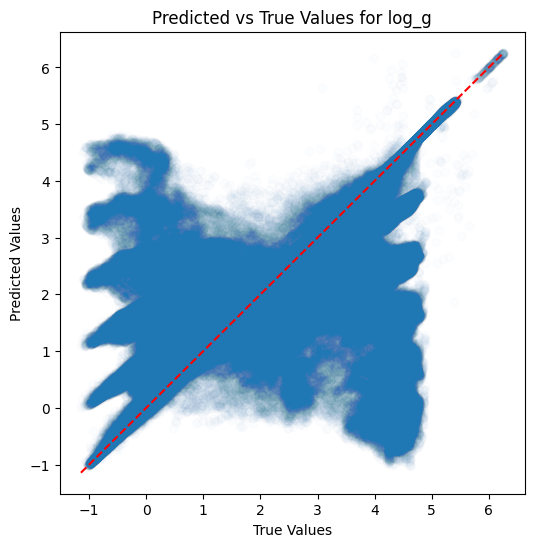

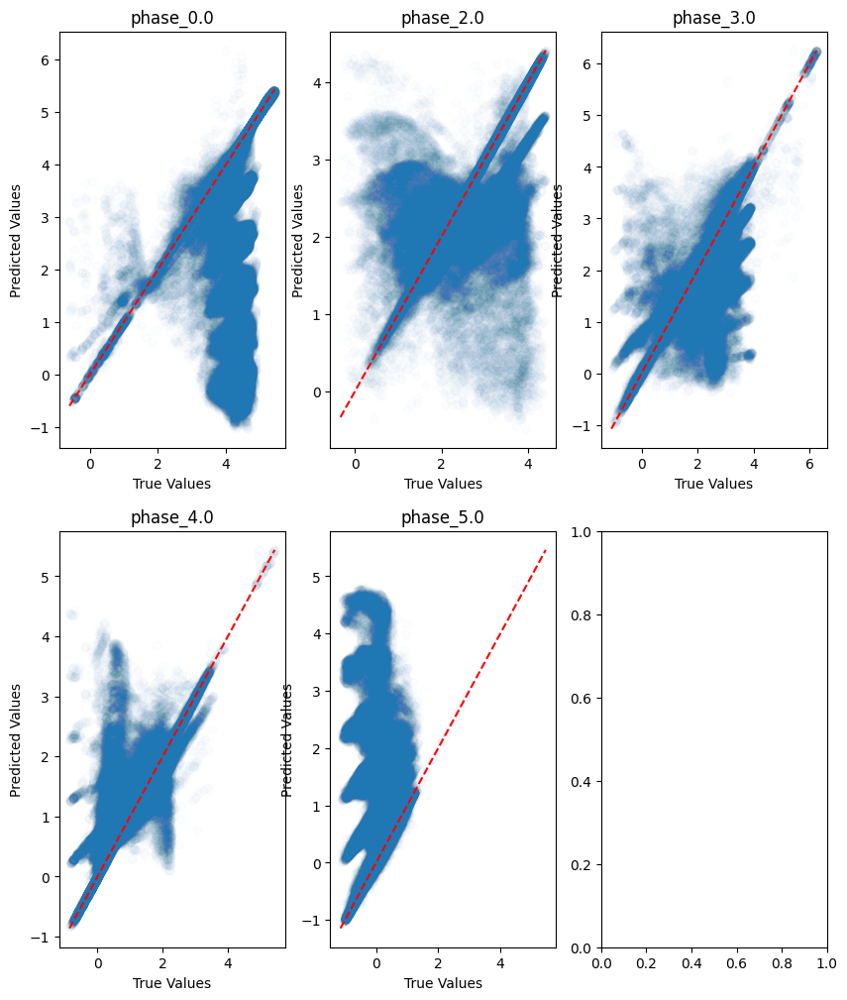

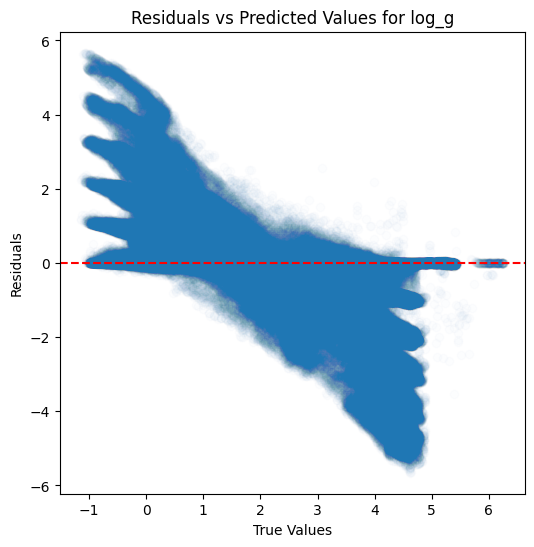

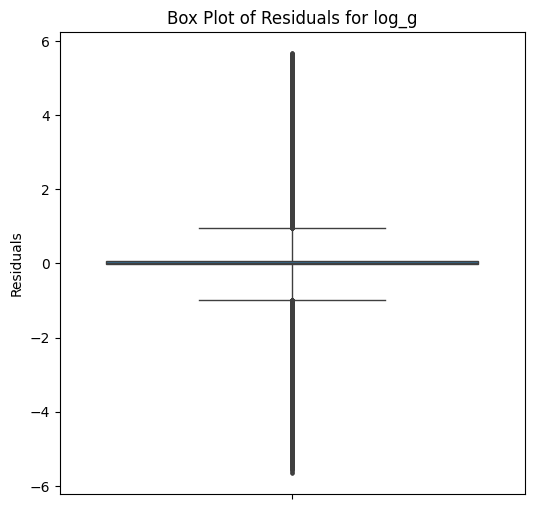

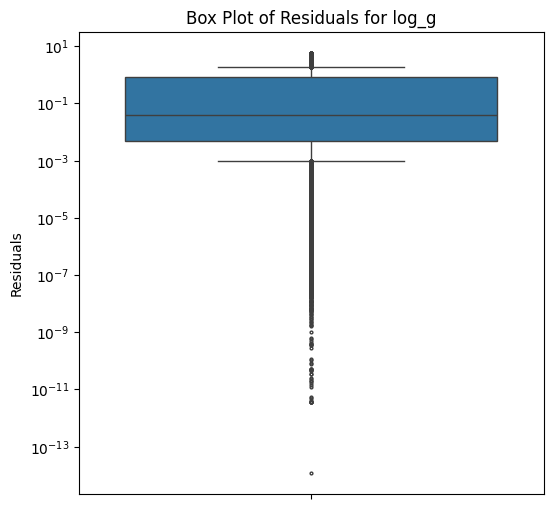

...

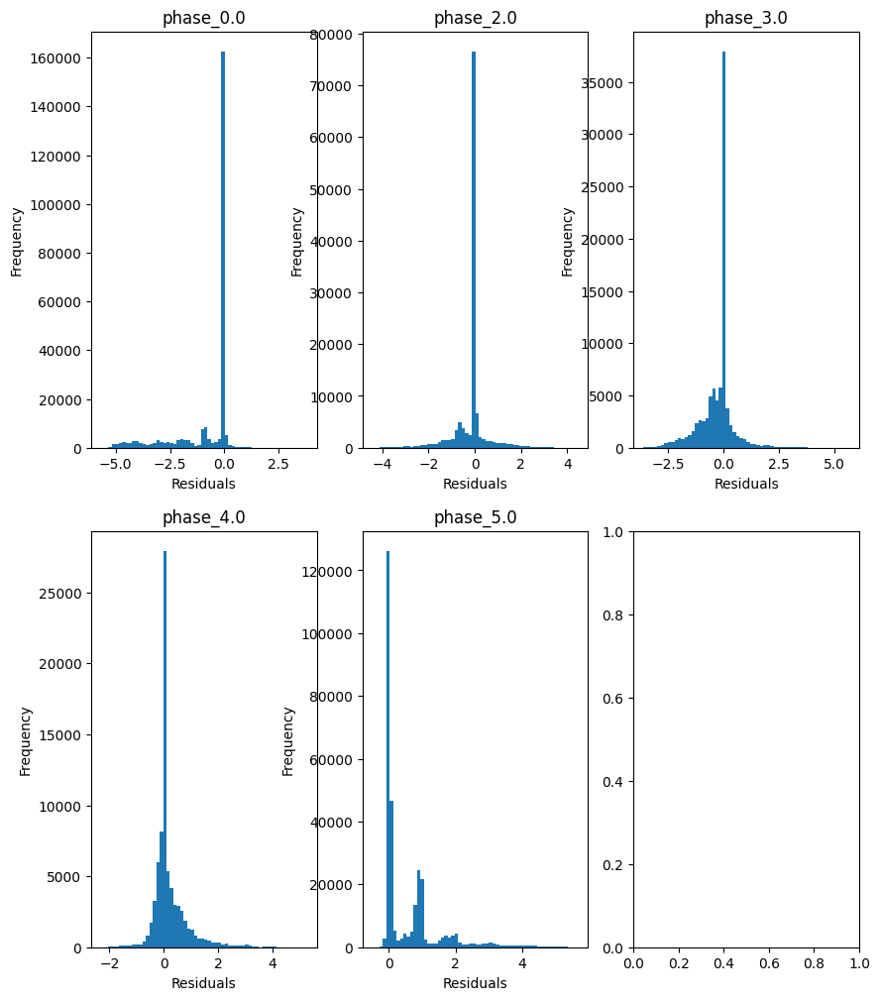

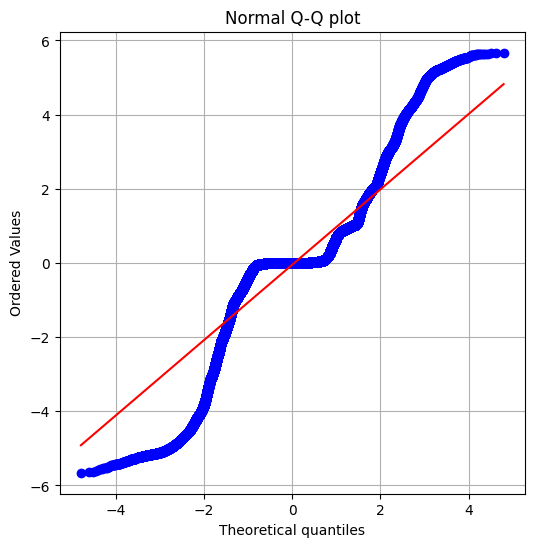

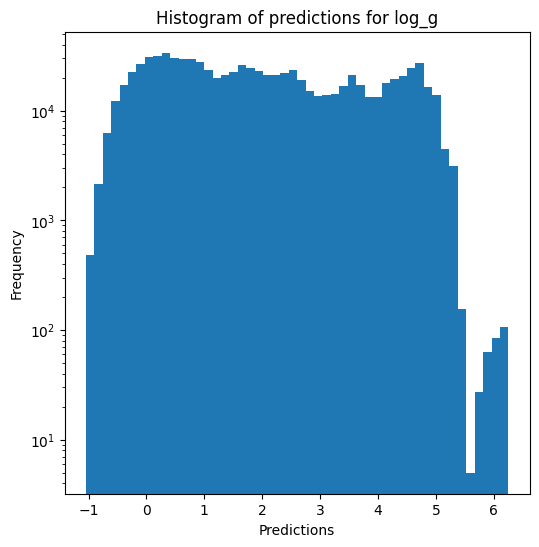

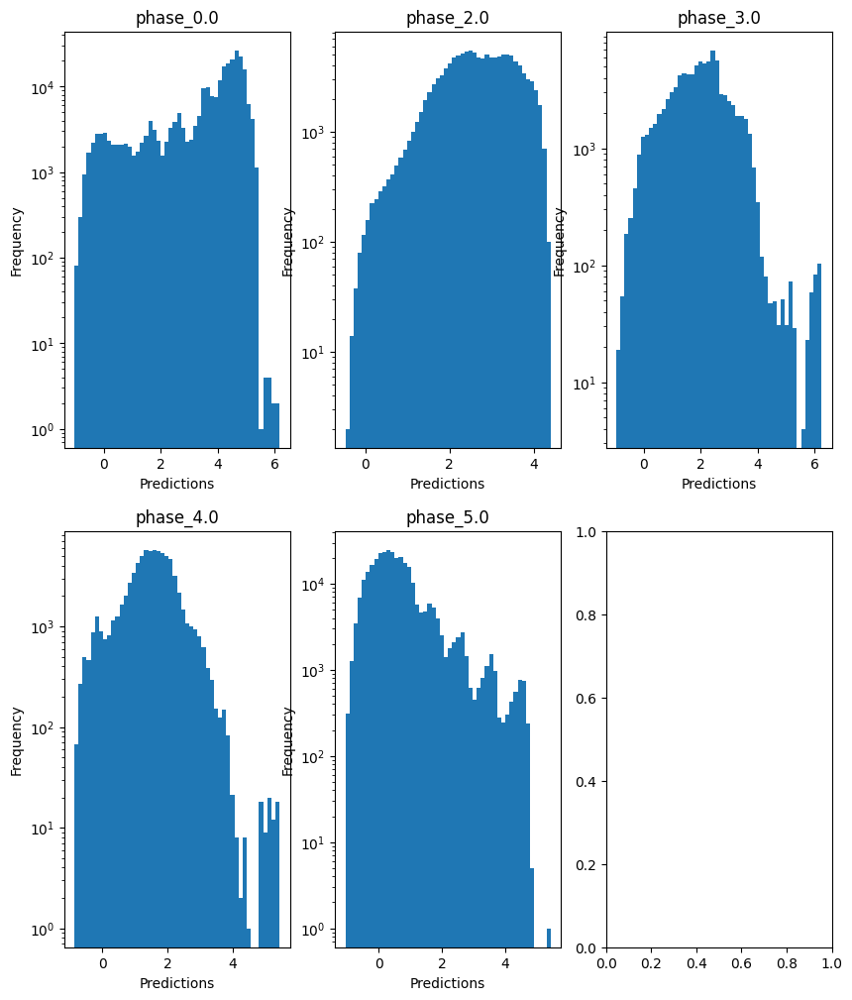

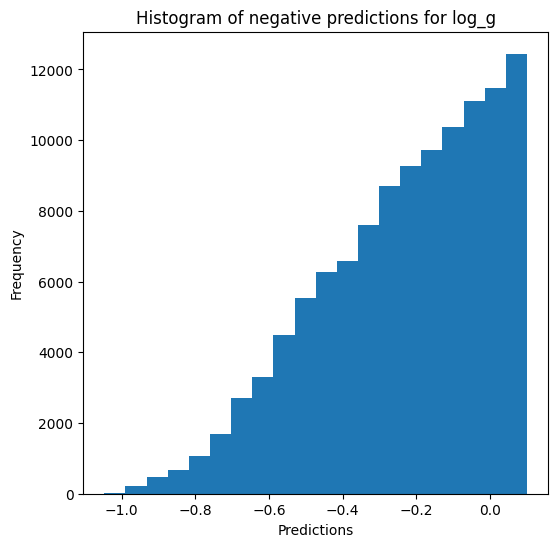


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.0827540579576227
  RVE :  -0.4954431527621159
  RMSE :  0.7925825625782119
  MAE :  0.39172183123740617
  MedAE :  0.006022187652860528
  CORR :  0.5761225494850766
  MAX_ER :  2.8296252237520716
  Percentiles : 
    75th percentile :  0.47468137792678566
    90th percentile :  1.5943667581019165
    95th percentile :  2.103431550924846
    99th percentile :  2.4862964627302984

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.891706235288321
  RVE :  0.414634718295428
  RMSE :  0.38025495248635727
  MAE :  0.184573934526781
  MedAE :  0.006929168454038903
  CORR :  0.6819602724479886
  MAX_ER :  2.233831201838224
  Percentiles : 
    75th percentile :  0.26670754596135515
    90th percentile :  0.6473343358179561
    95th percentile :  0.9273331455503624
    99th percentile :  1.515661590346643

radius results for the phase category with 

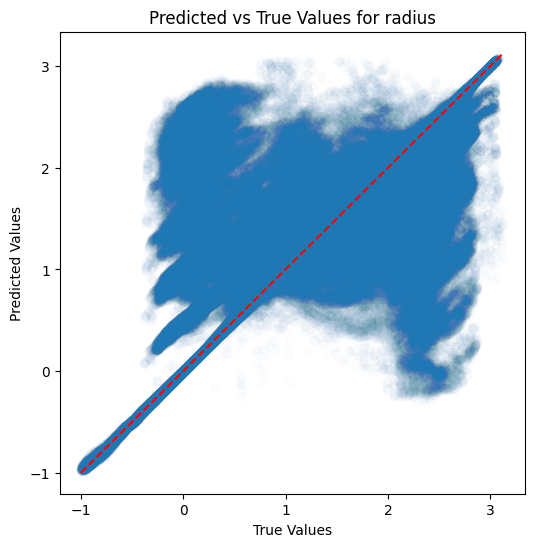

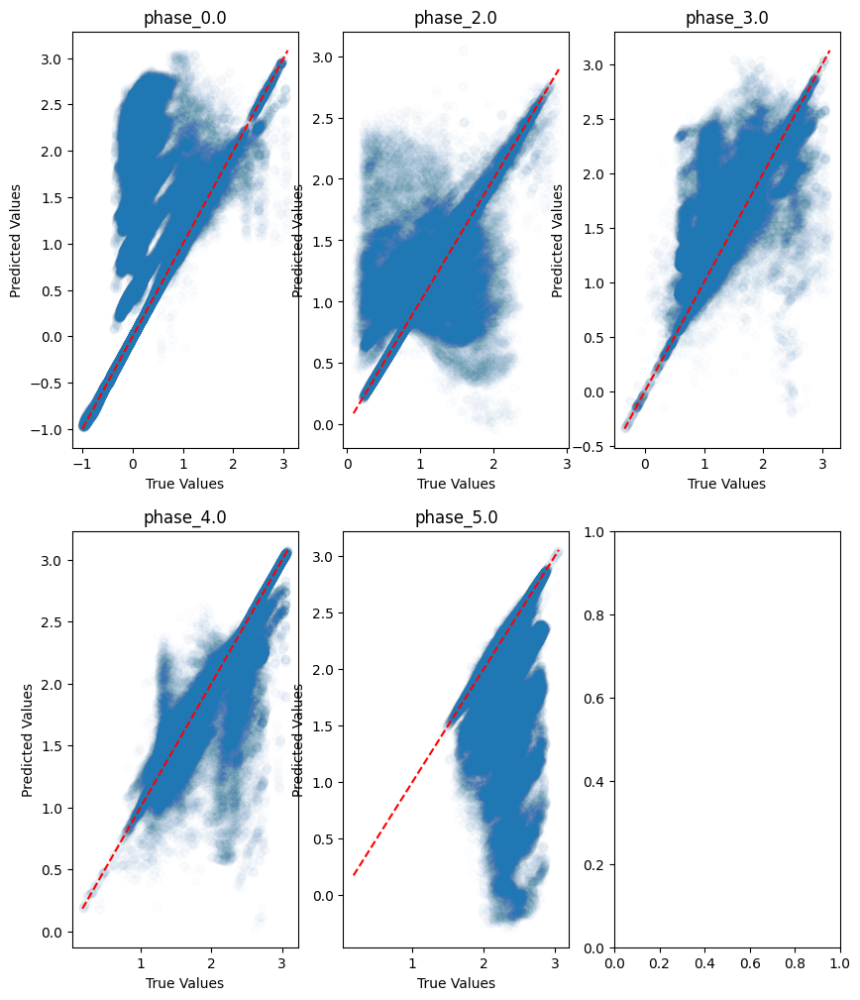

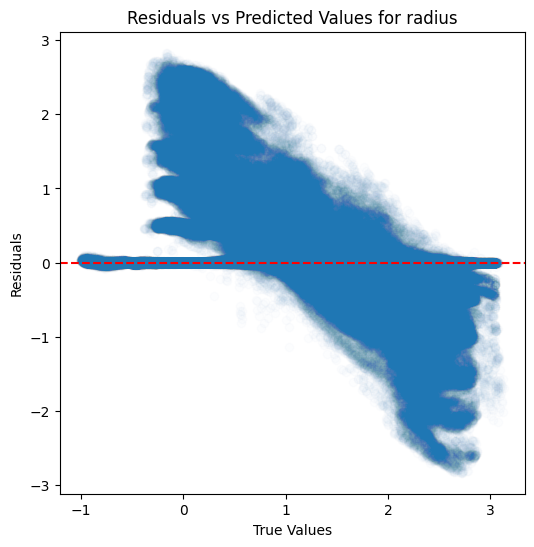

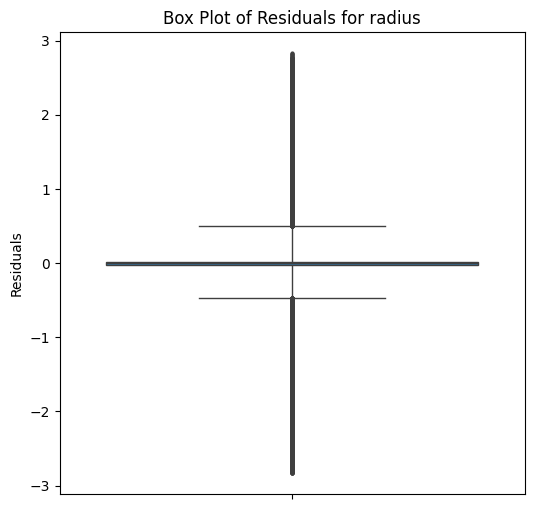

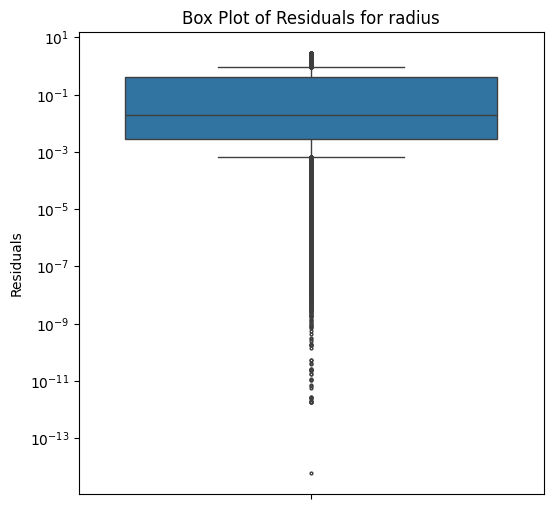

...

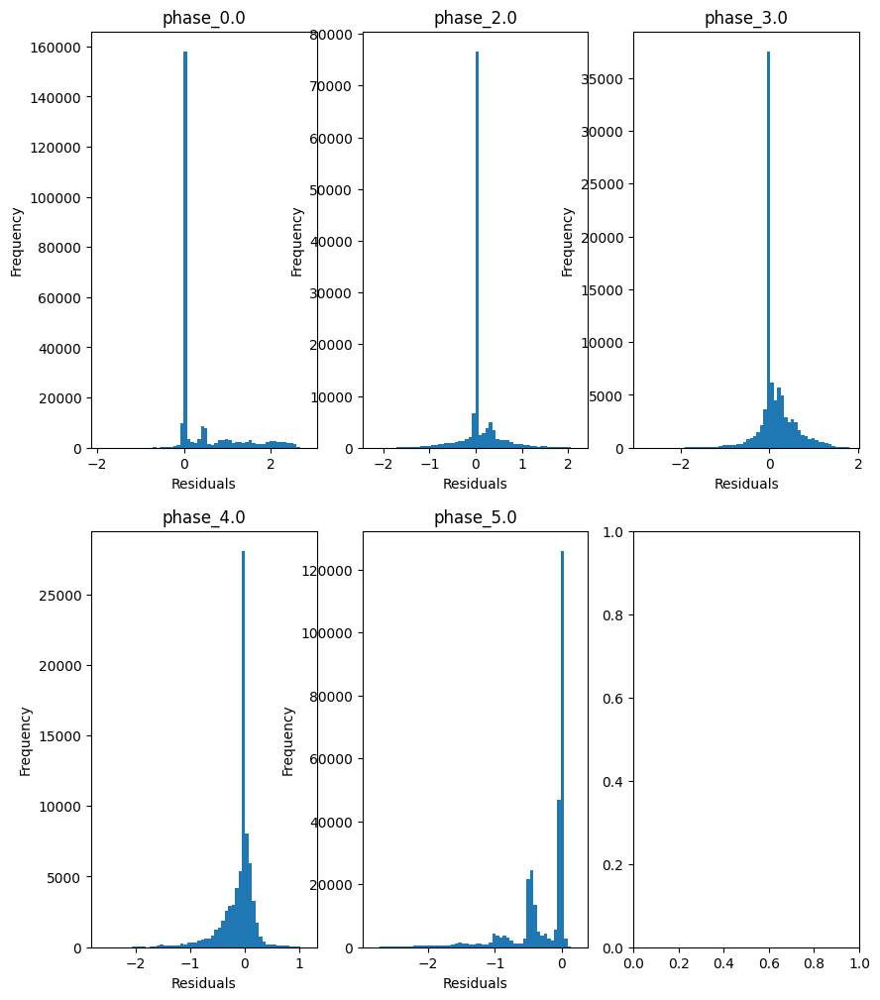

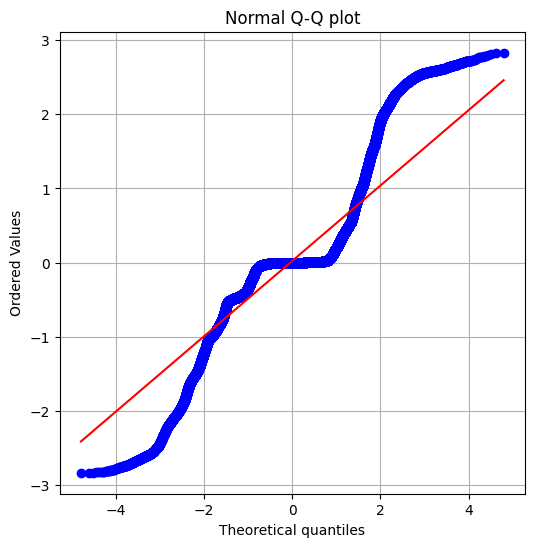

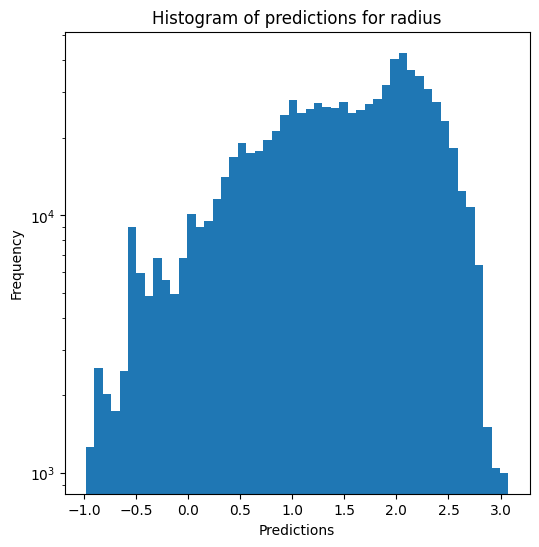

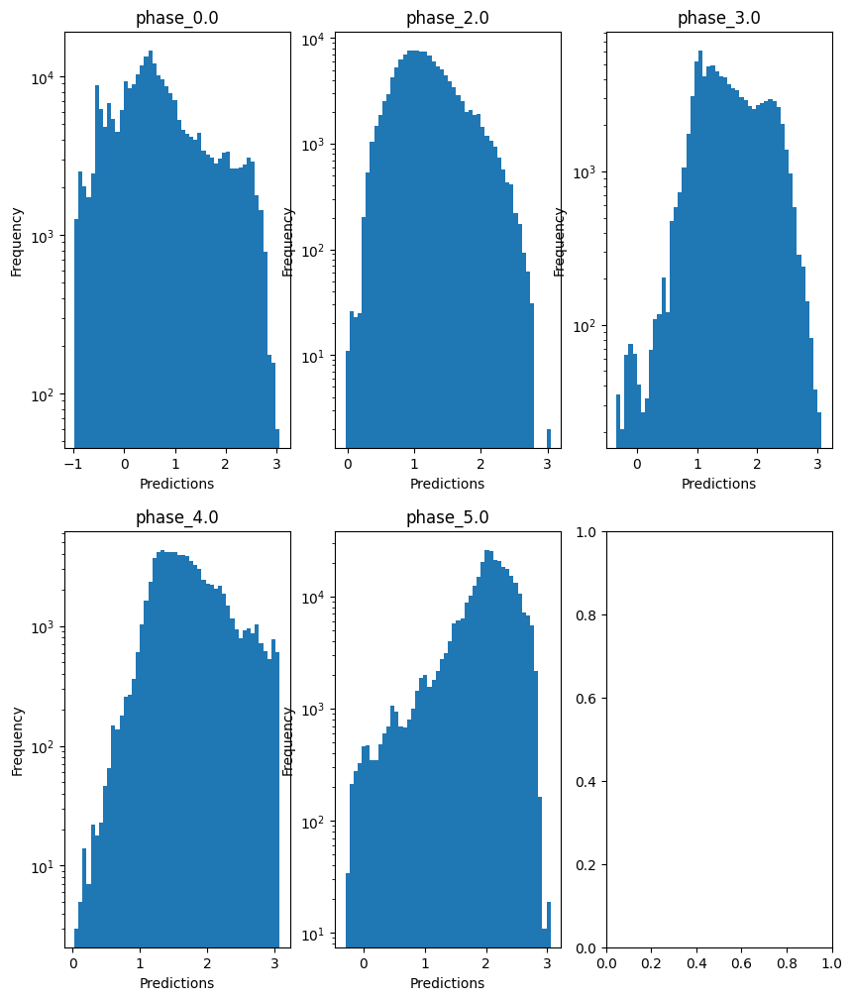

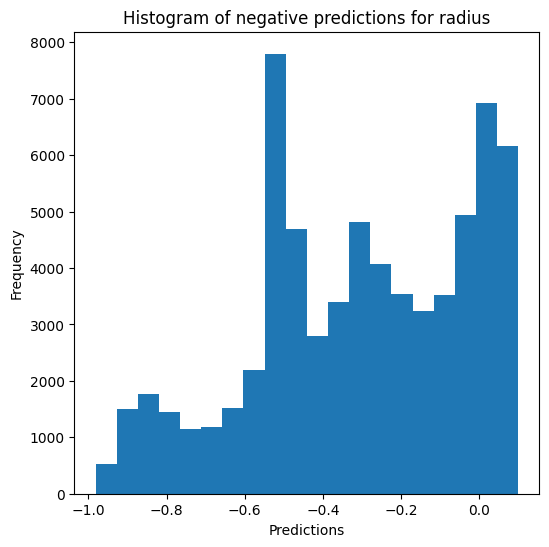

Saving results...


In [15]:
knn_evaluator.evaluate_Kfold_results(KNeighborsRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show)

### Random forests

In [16]:
rf_evaluator = Model_evaluator("random_forest", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


Base_old train data :
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.8075611489100274
  RMSE :  0.17156761414250202
  MAE :  0.07949919769577382
  MedAE :  0.0010260924929323956
  CORR :  0.9209118656585242
  MAX_ER :  0.8990113466750298
  Percentiles : 
    75th percentile :  0.08556535227031459
    90th percentile :  0.31563271539485277
    95th percentile :  0.45696882914423487
    99th percentile :  0.6130789106674959

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.711472733477716
  RVE :  0.9463609440149476
  RMSE :  0.07472533345043936
  MAE :  0.03289056013958343
  MedAE :  0.003131324885464526
  CORR :  0.9736585453129091
  MAX_ER :  0.7226239736901898
  Percentiles : 
    75th percentile :  0.03253179204579282
    90th percentile :  0.10745756294332114
    95th percentile :  0.16428842387718462
    99th perce

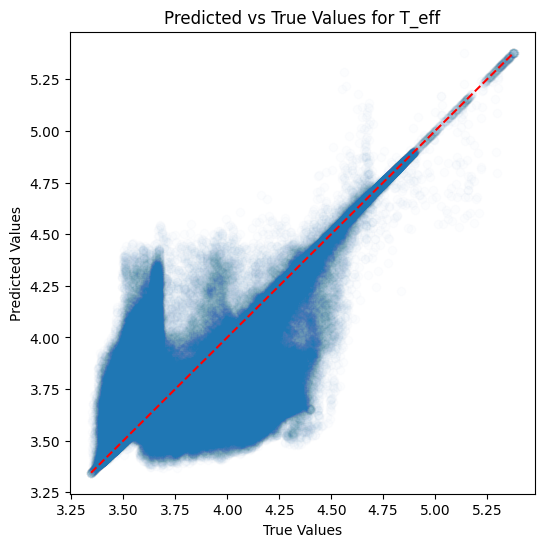

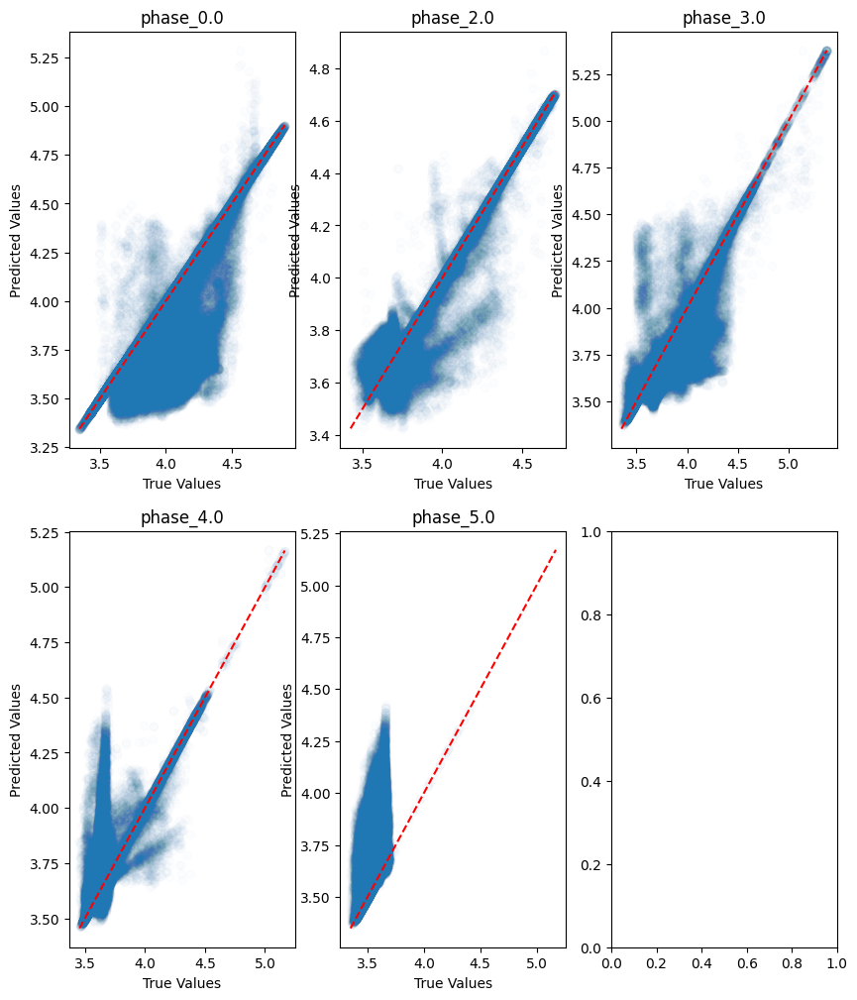

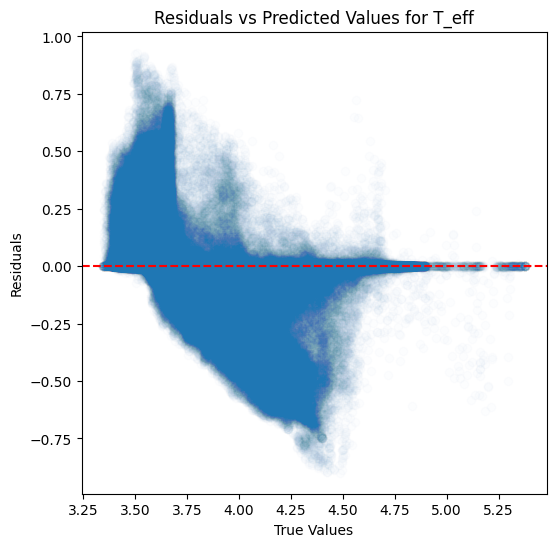

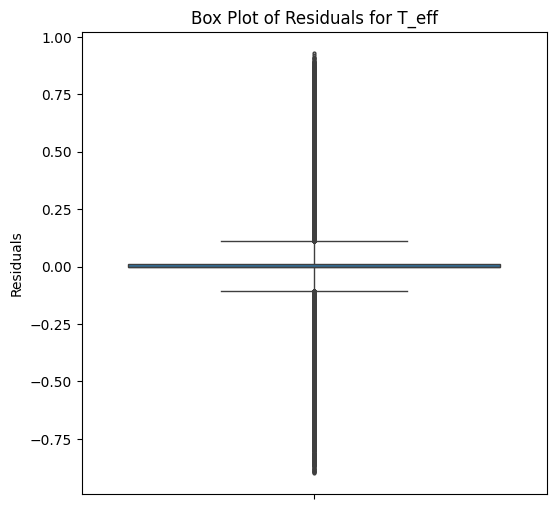

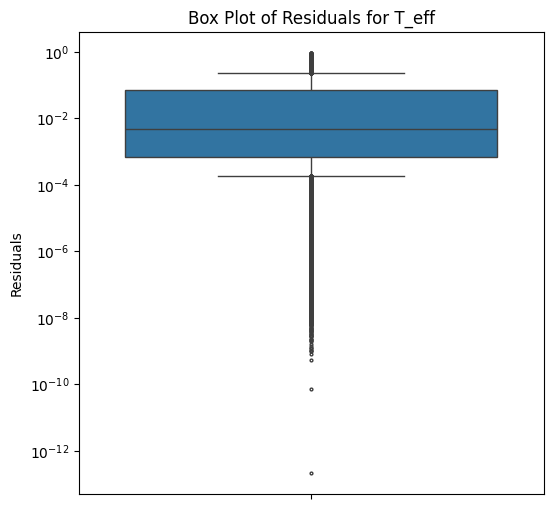

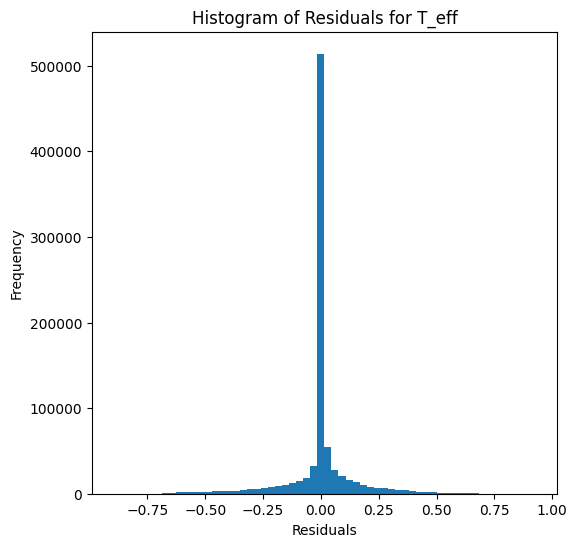

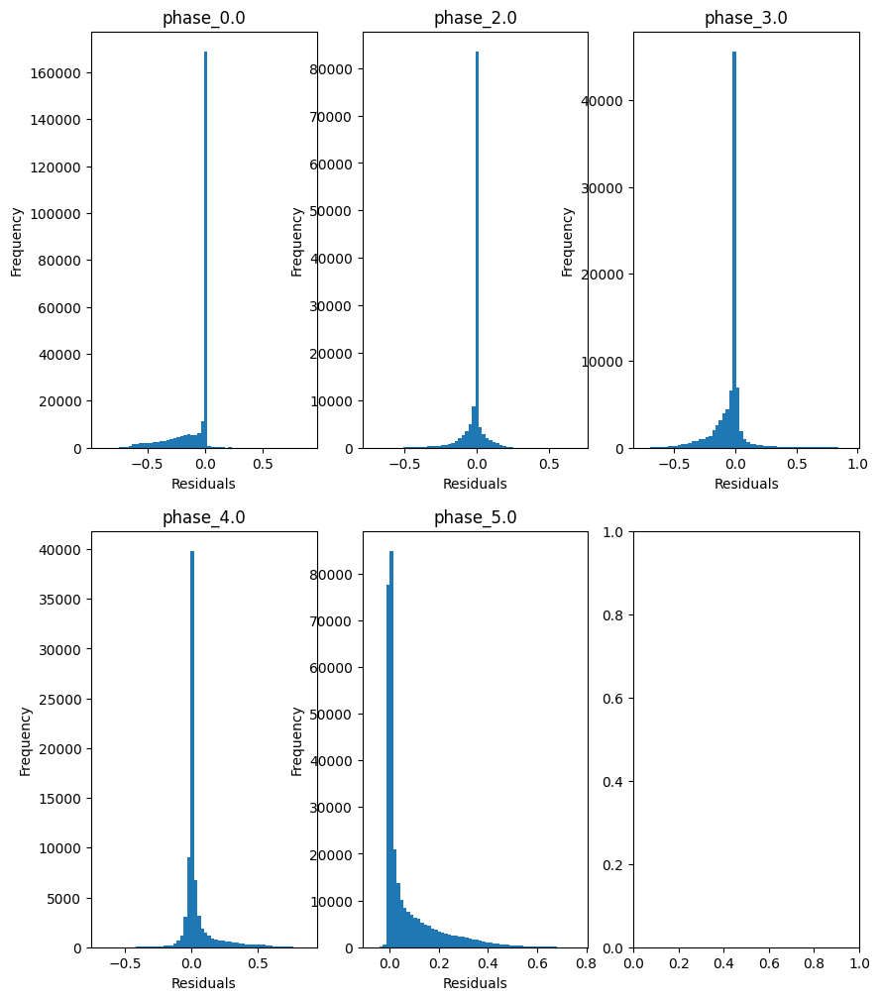

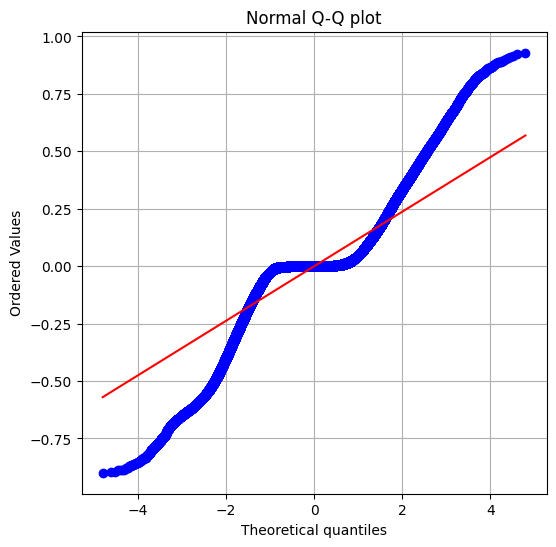

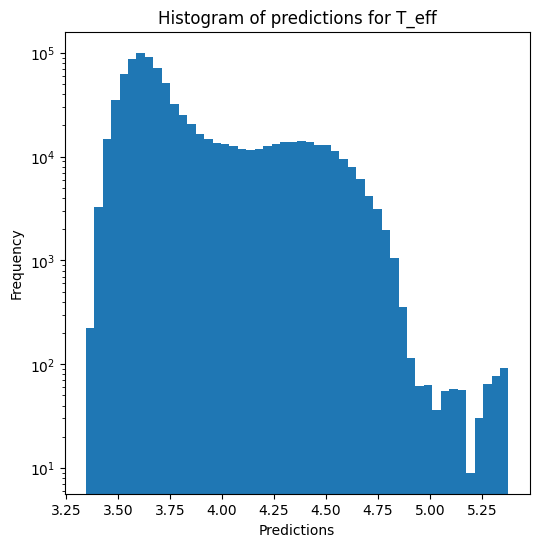

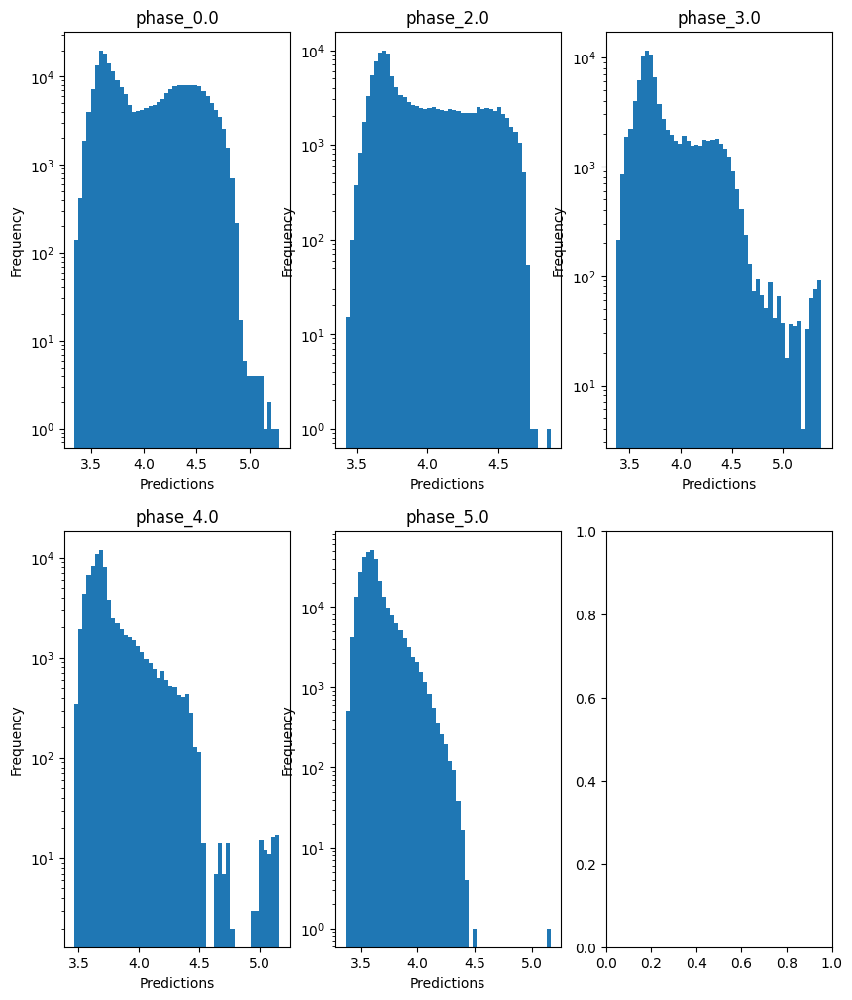


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  -4.35760028643572
  RMSE :  1.6429645352148186
  MAE :  0.8068219011383831
  MedAE :  0.0036252684529374246
  CORR :  0.3765108921511524
  MAX_ER :  5.531316924694927
  Percentiles : 
    75th percentile :  0.9983277874233811
    90th percentile :  3.5115664902927914
    95th percentile :  4.171420395765621
    99th percentile :  4.811845231907124

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.408311770676233
  RVE :  0.013557431677446496
  RMSE :  0.9149679988897893
  MAE :  0.4456017072003217
  MedAE :  0.016337214633499908
  CORR :  0.5103084799376272
  MAX_ER :  4.425118822925782
  Percentiles : 
    75th percentile :  0.5211223119595995
    90th percentile :  1.7489937333669205
    95th percentile :  2.3297126911535897
    99th percentile :  3.2973919052247997

log_g results for the phase category with a val

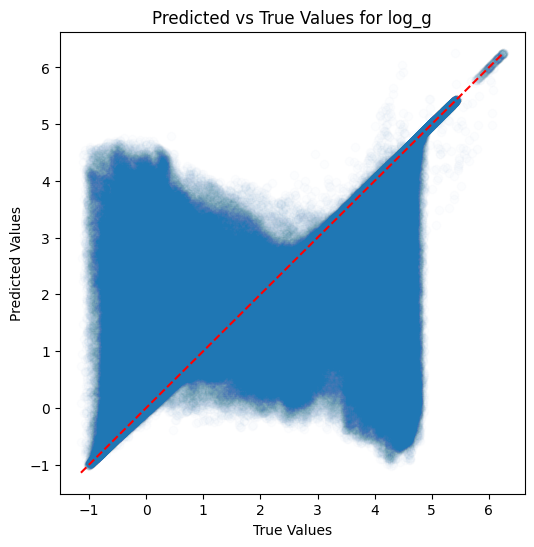

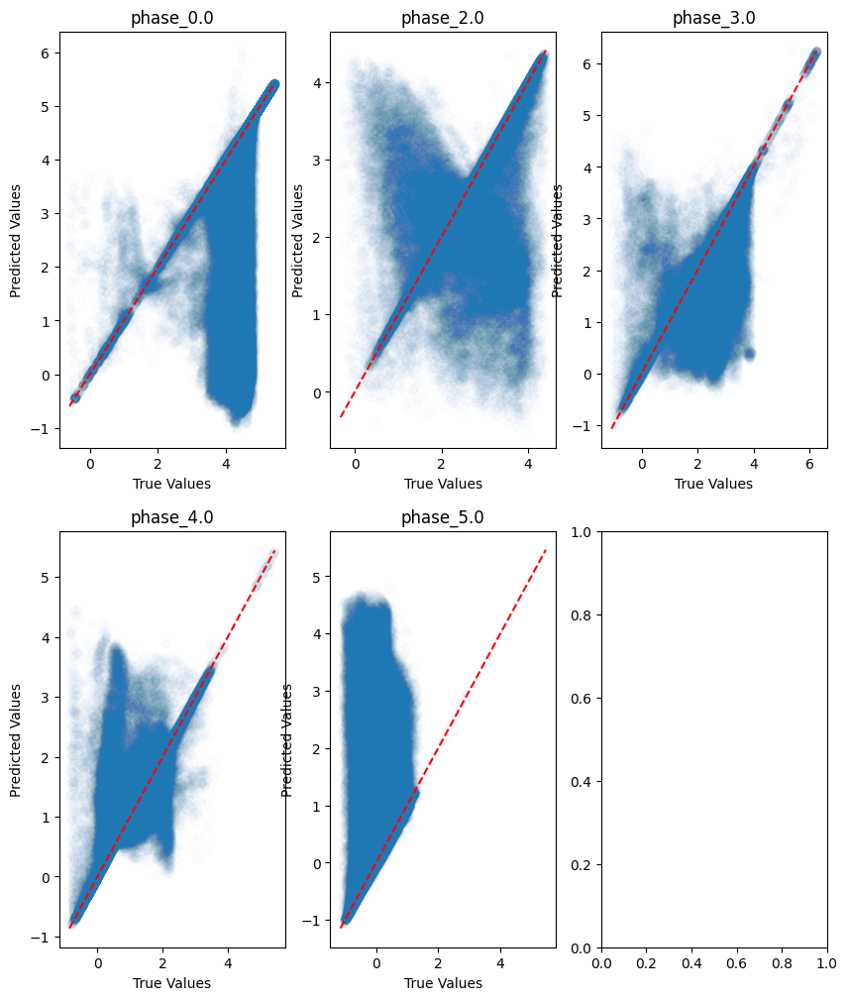

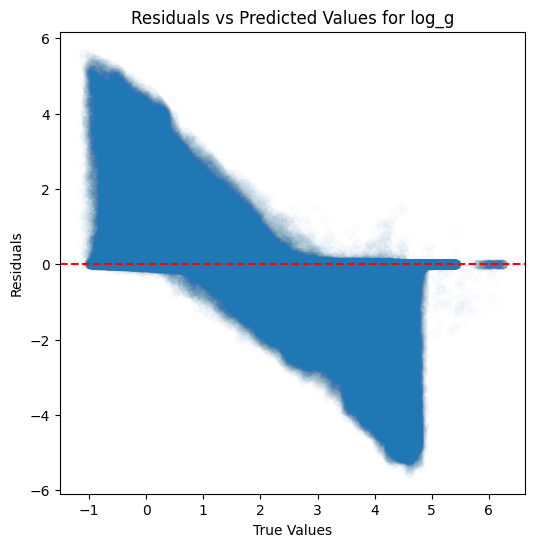

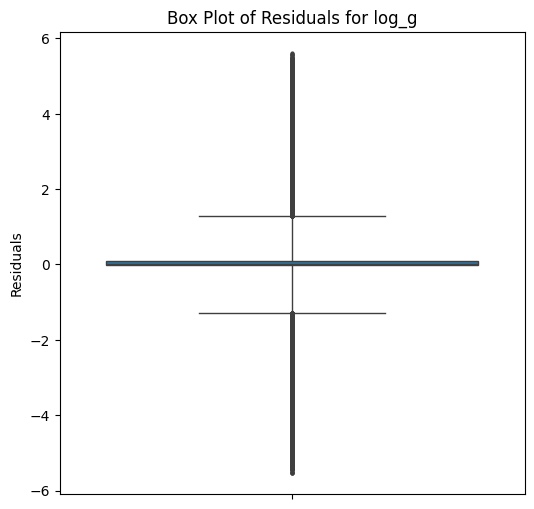

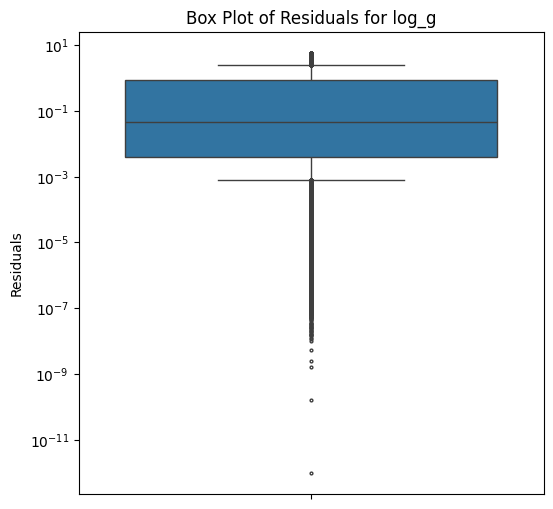

...

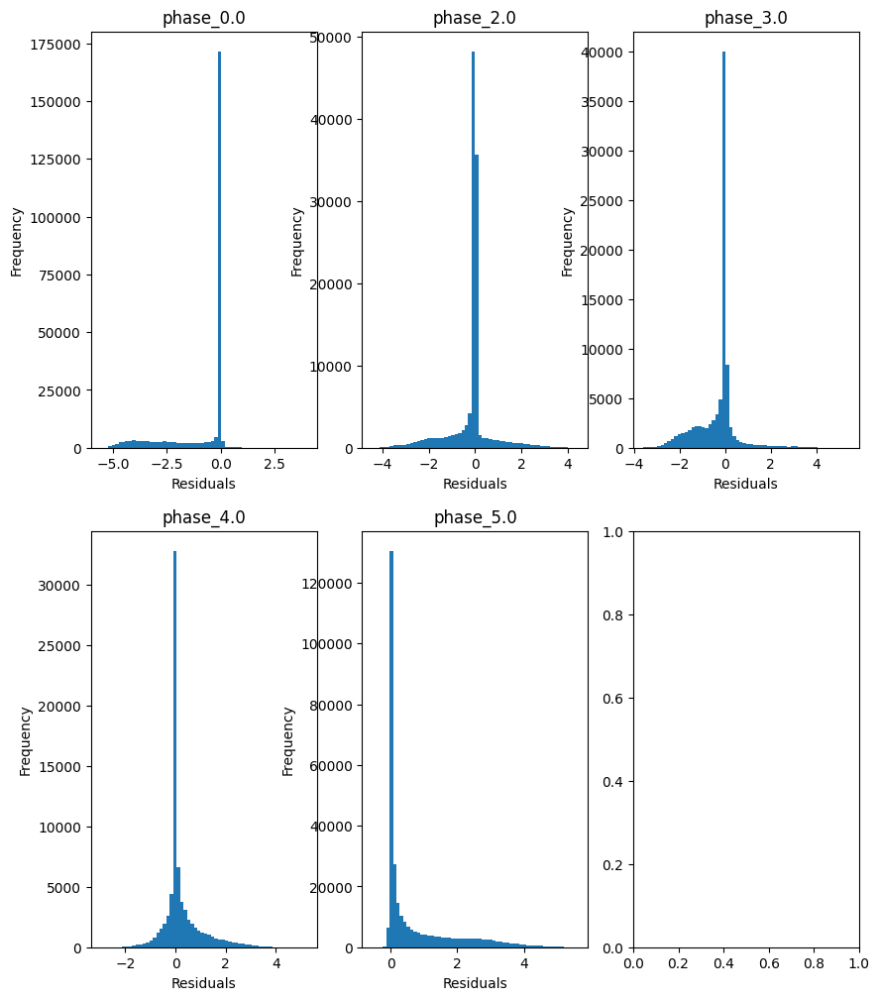

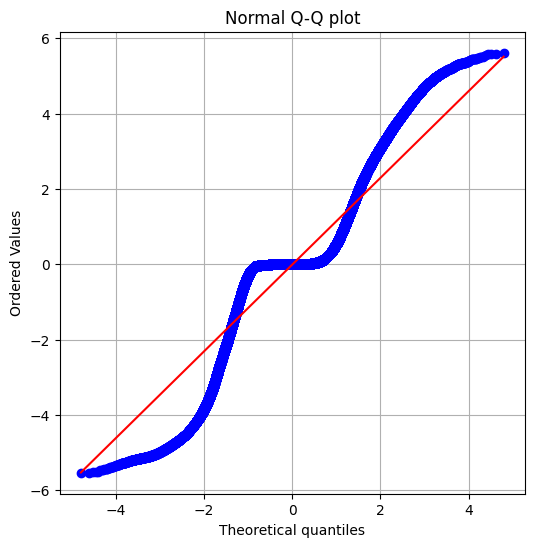

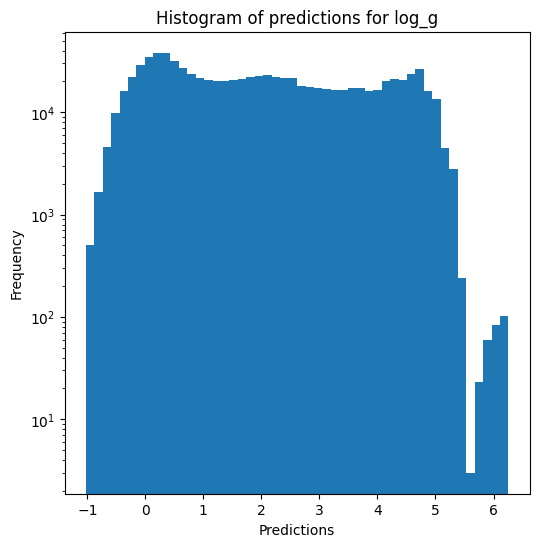

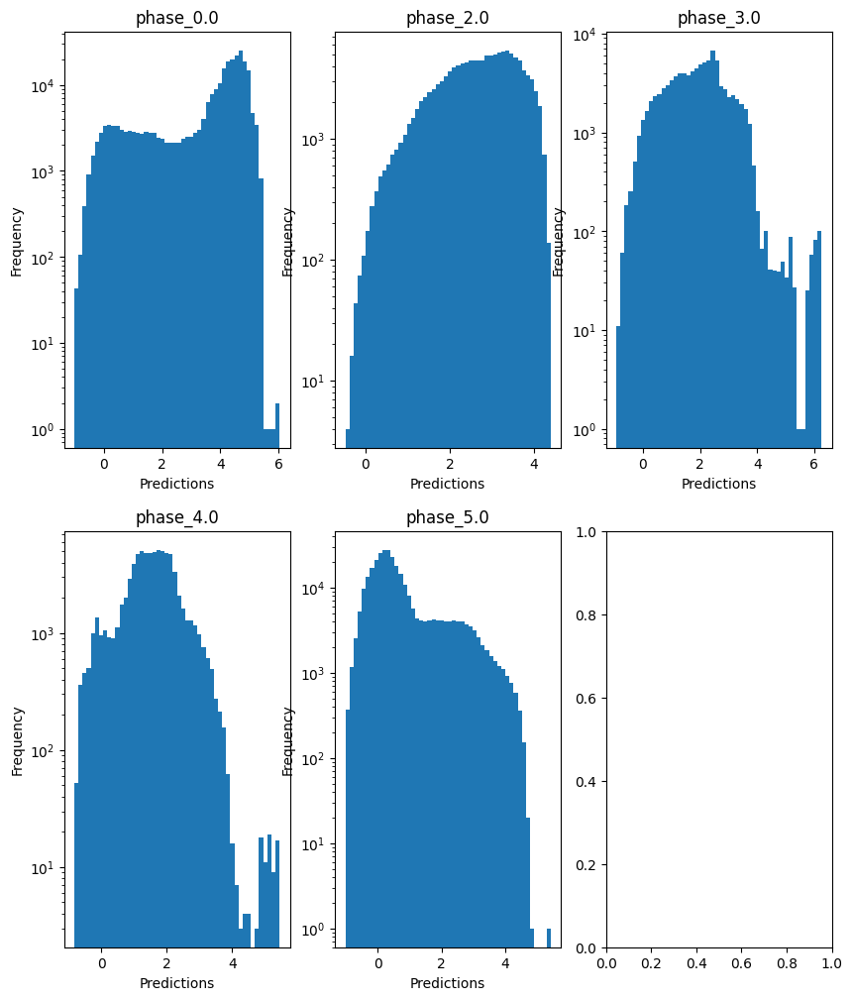

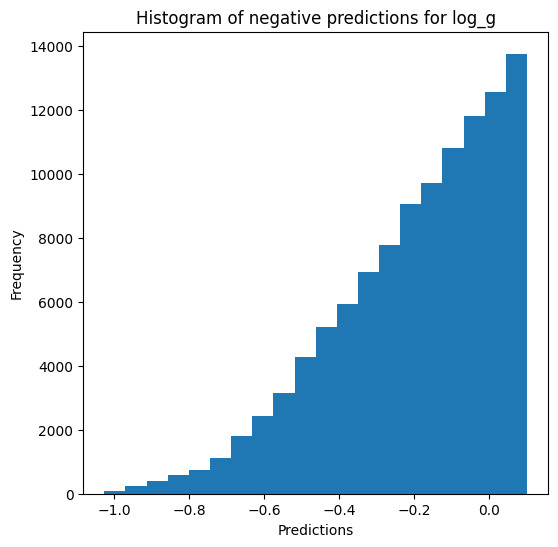


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.0827540579576227
  RVE :  -0.6043004559884961
  RMSE :  0.8215114340107615
  MAE :  0.4037033312247088
  MedAE :  0.002355994853139892
  CORR :  0.5446576008706236
  MAX_ER :  2.76739871616836
  Percentiles : 
    75th percentile :  0.499707692439431
    90th percentile :  1.755634112111684
    95th percentile :  2.085792553853317
    99th percentile :  2.4055623741869865

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.891706235288321
  RVE :  0.15317328940586838
  RMSE :  0.45748075217006007
  MAE :  0.22280200958974286
  MedAE :  0.008177797830293543
  CORR :  0.5622317588684937
  MAX_ER :  2.212524837971109
  Percentiles : 
    75th percentile :  0.2605402992150545
    90th percentile :  0.8745093061447272
    95th percentile :  1.1647899515282292
    99th percentile :  1.6486100729171123

radius results for the phase category with a 

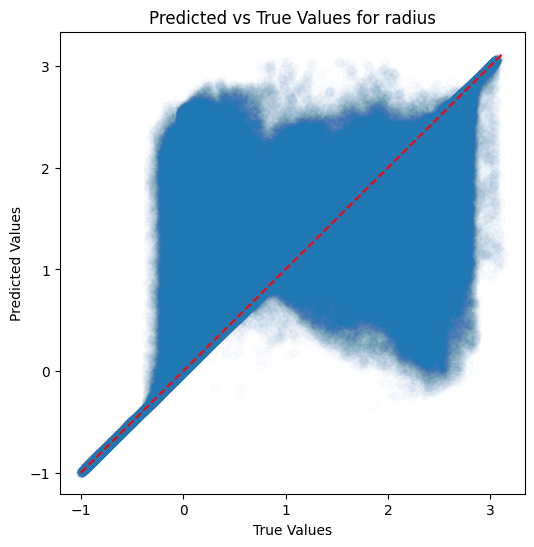

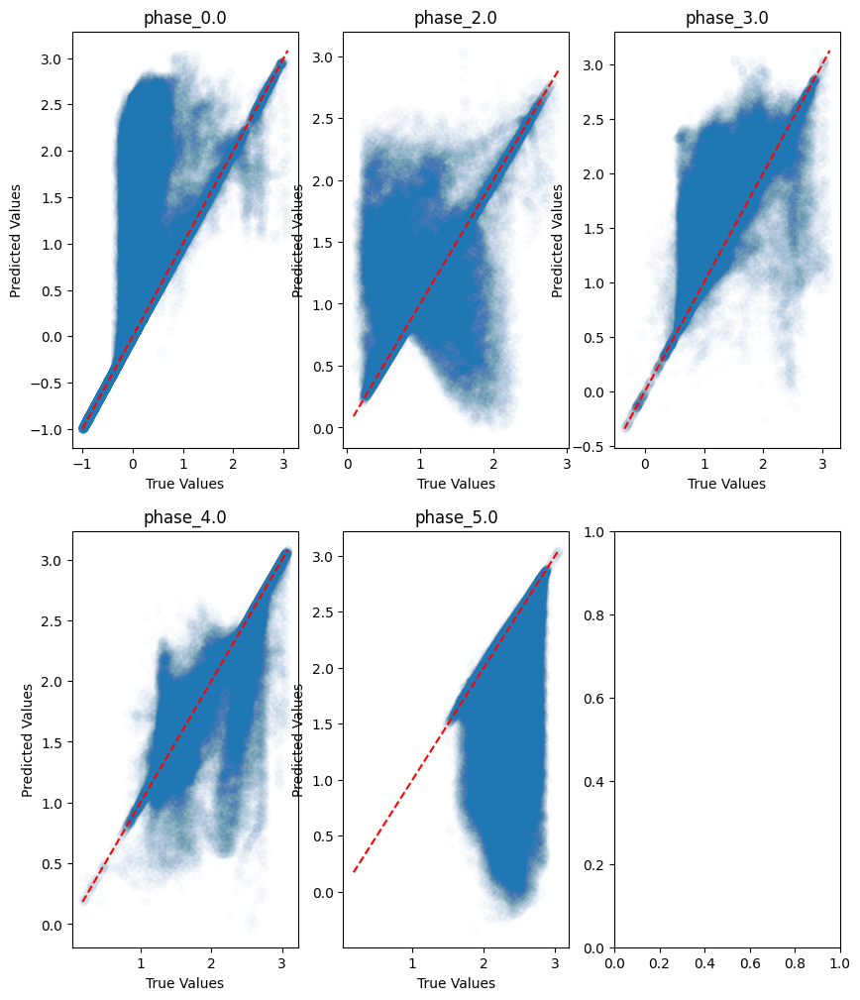

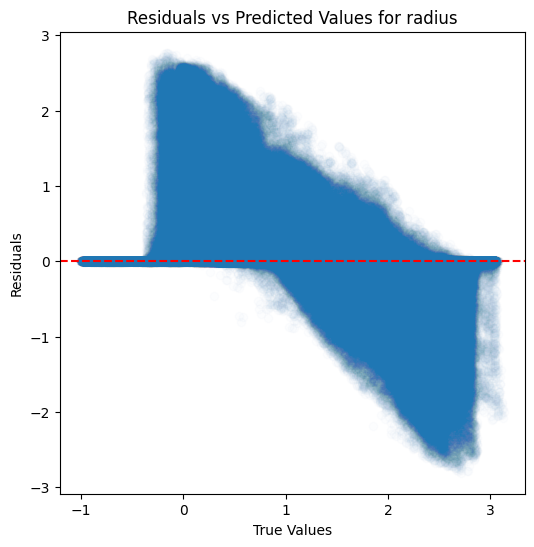

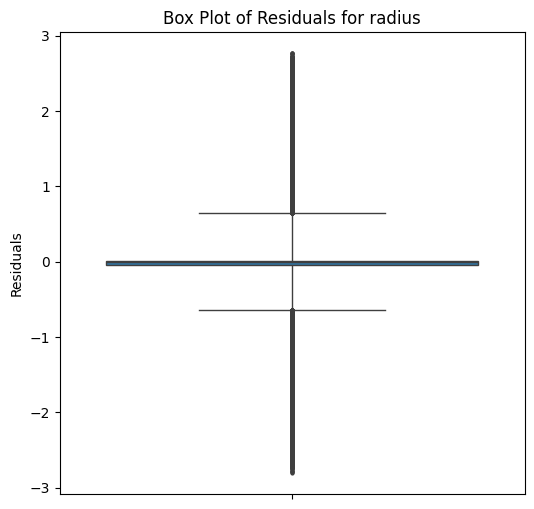

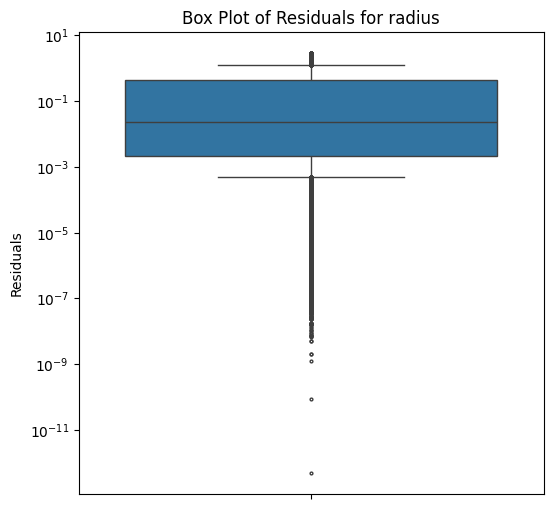

...

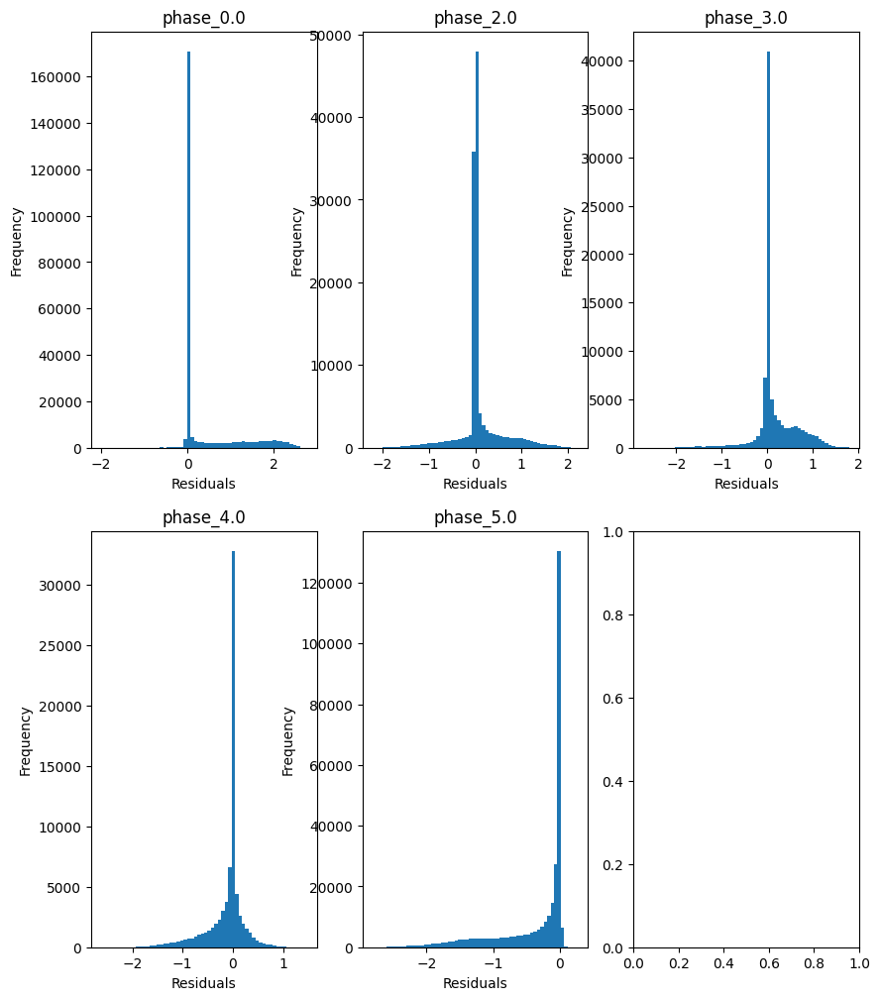

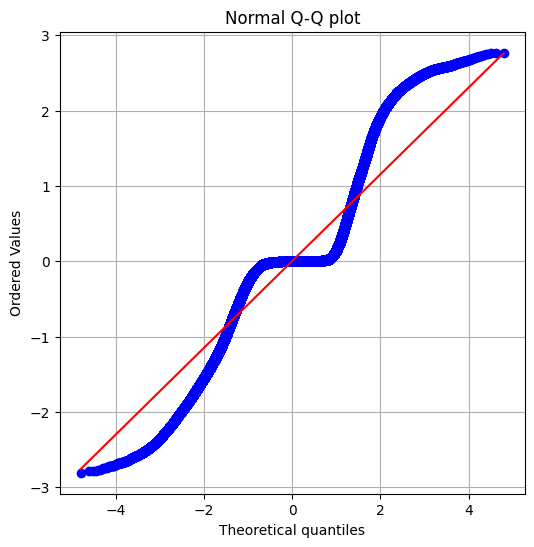

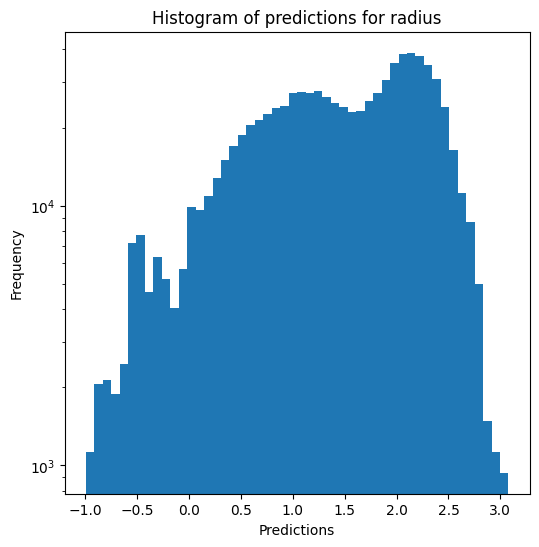

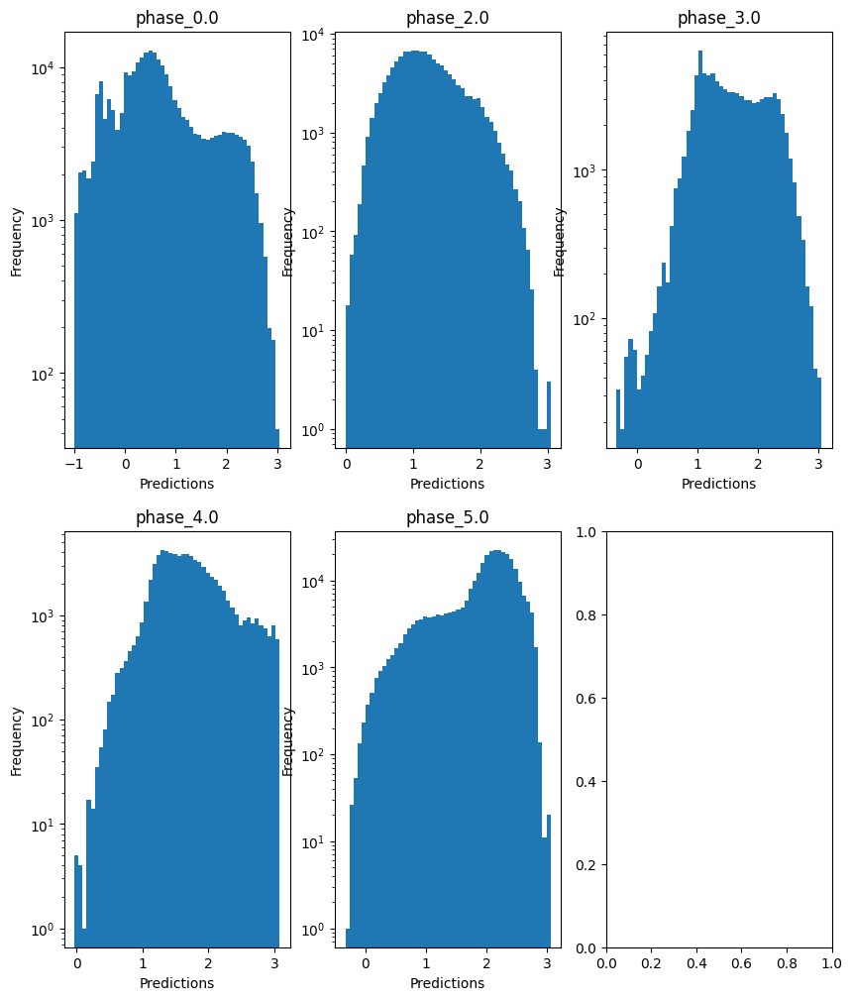

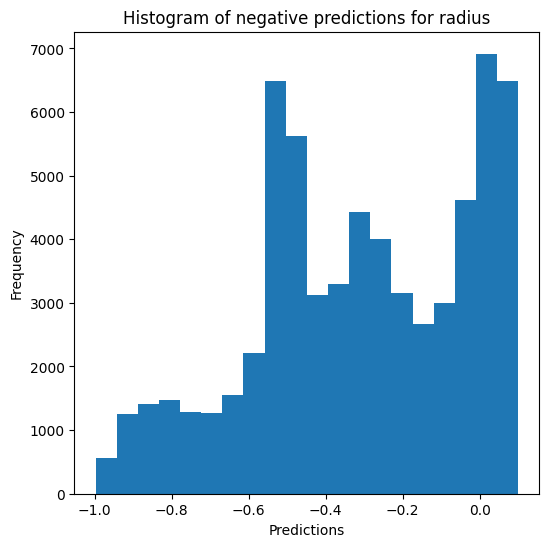

Saving results...


In [17]:
rf_evaluator.evaluate_Kfold_results(RandomForestRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, n_jobs=5)

### XGBoost

In [18]:
xgb_evaluator = Model_evaluator("xgboost", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


Base_old train data :
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.7971491123723797
  RMSE :  0.19355464314741663
  MAE :  0.12668711190784657
  MedAE :  0.04375608741629655
  CORR :  0.9128188472467321
  MAX_ER :  0.8230129660359036
  Percentiles : 
    75th percentile :  0.22808125350951436
    90th percentile :  0.35765631423219535
    95th percentile :  0.4137833243173537
    99th percentile :  0.5292027723507585

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.711472733477716
  RVE :  0.8407832103368339
  RMSE :  0.13742747021778082
  MAE :  0.10203189473607632
  MedAE :  0.06994102586662865
  CORR :  0.9177377345205135
  MAX_ER :  0.607789110480355
  Percentiles : 
    75th percentile :  0.15393995831461937
    90th percentile :  0.24553566927337653
    95th percentile :  0.29181826099132185
    99th percentile

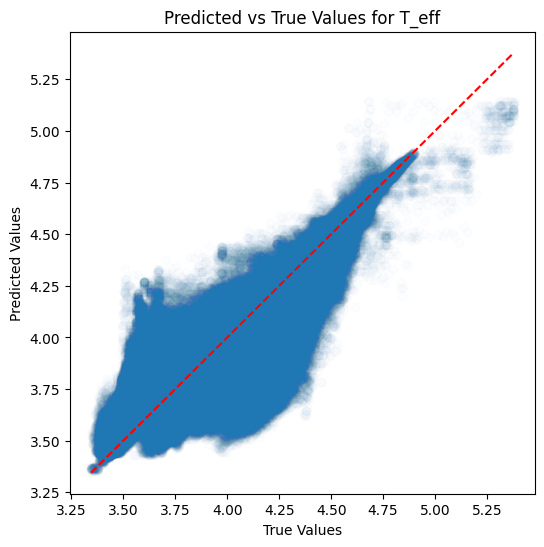

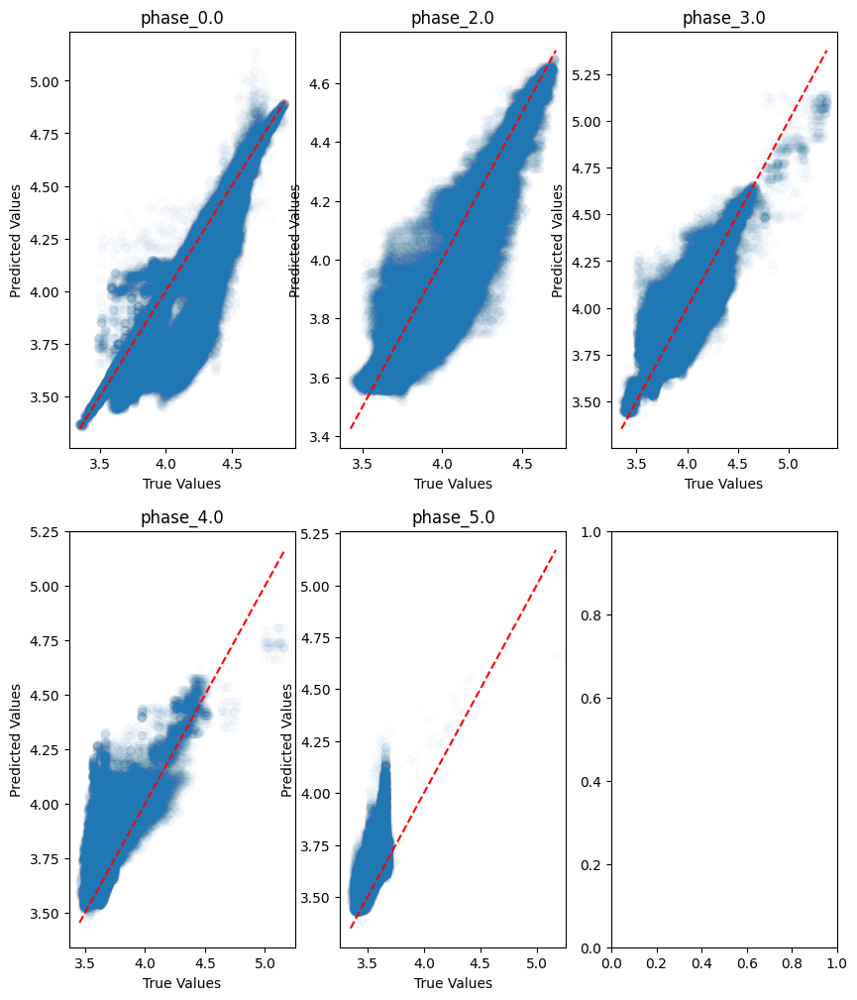

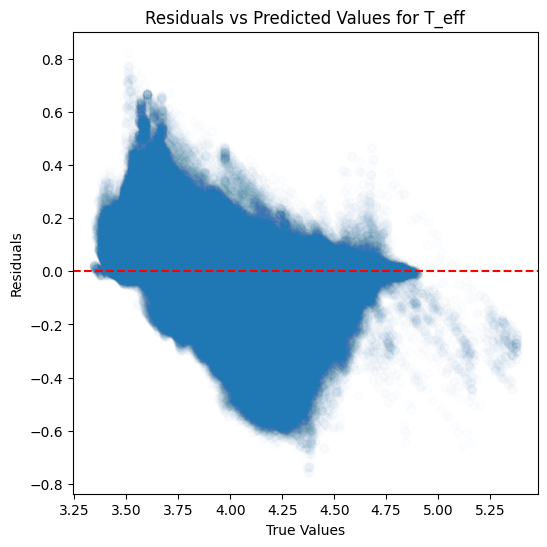

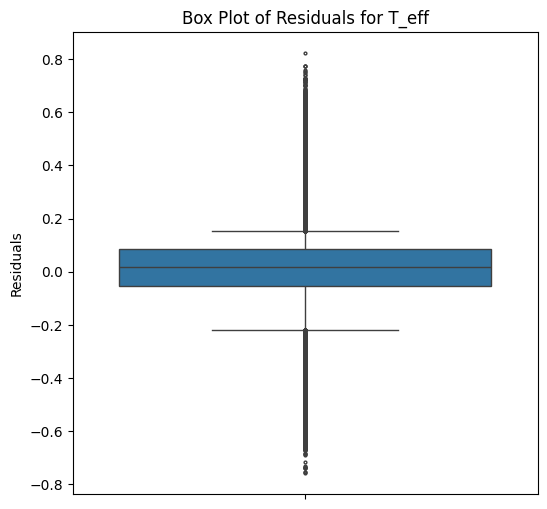

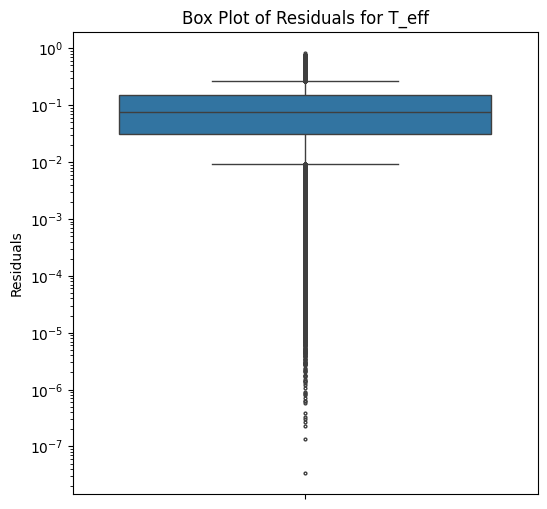

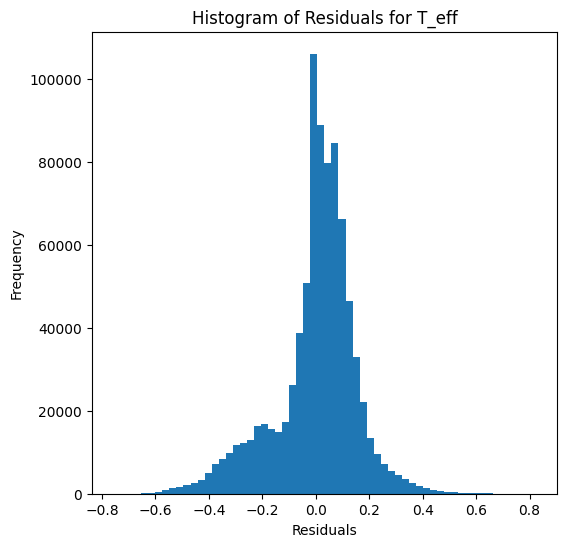

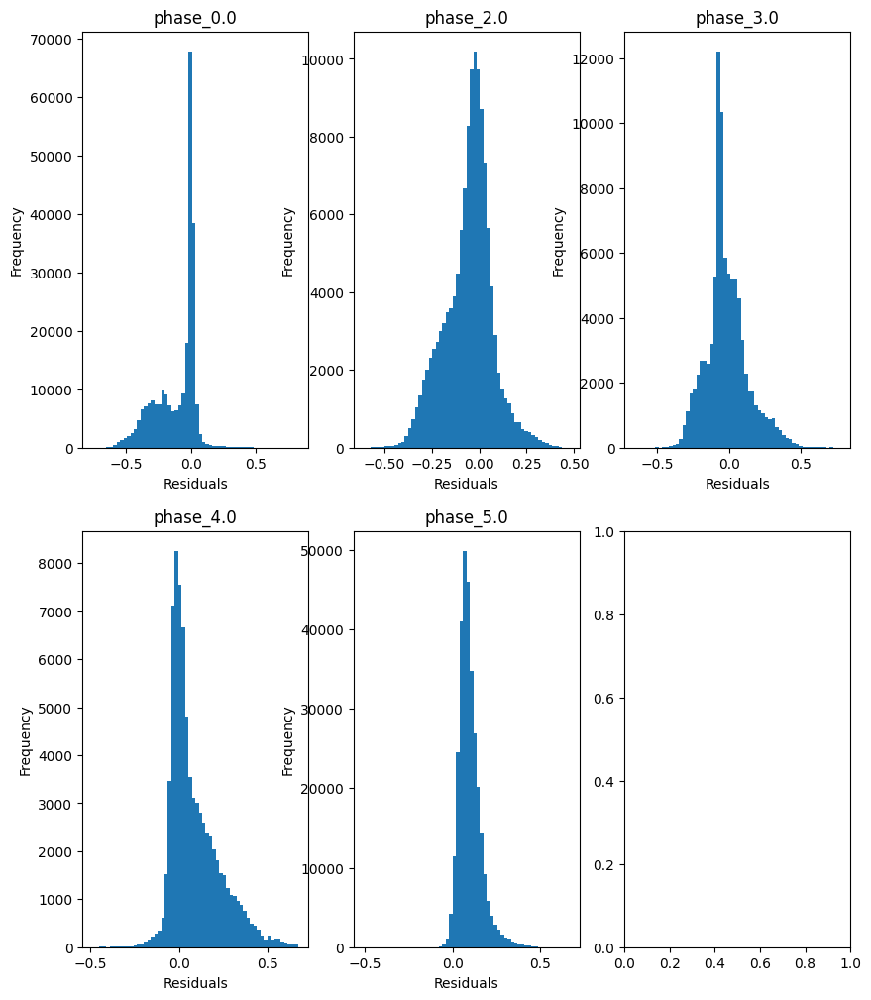

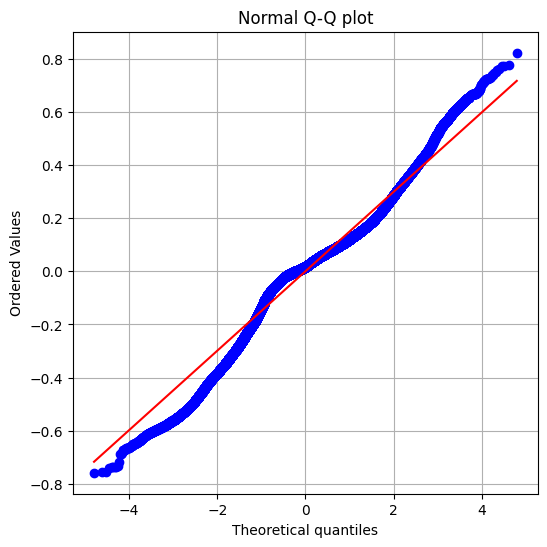

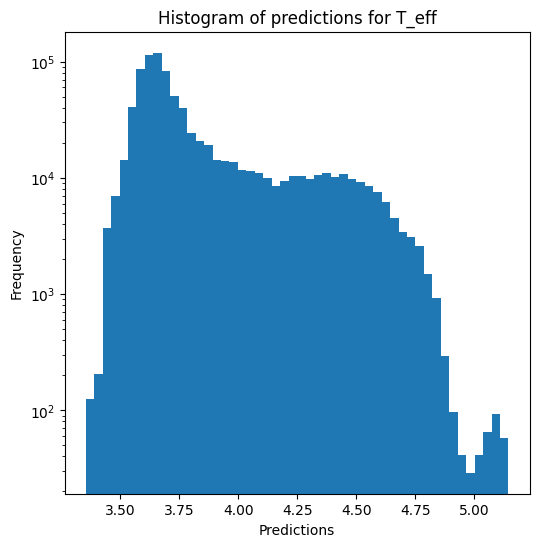

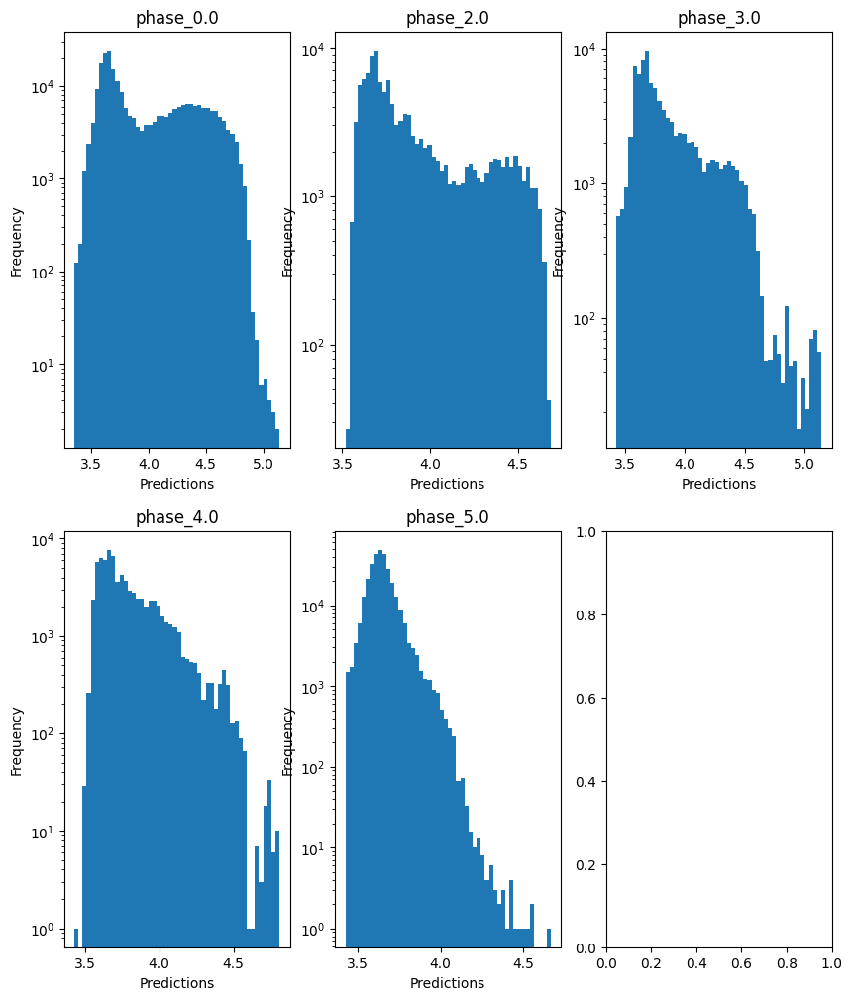


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  -3.8635004118277143
  RMSE :  1.719129288760467
  MAE :  1.1128057229683783
  MedAE :  0.3127089482469958
  CORR :  0.4368520928314058
  MAX_ER :  5.317418804893241
  Percentiles : 
    75th percentile :  2.1681871599876876
    90th percentile :  3.2338132025571102
    95th percentile :  3.6952085530748344
    99th percentile :  4.217762913430874

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.408311770676233
  RVE :  0.095305553283215
  RMSE :  1.0222388572918444
  MAE :  0.8099699538365074
  MedAE :  0.6775191957259723
  CORR :  0.4480653458936331
  MAX_ER :  3.3670155904553765
  Percentiles : 
    75th percentile :  1.2470604167310662
    90th percentile :  1.7177184514469446
    95th percentile :  1.9946127790807073
    99th percentile :  2.4187558360697894

log_g results for the phase category with a value of

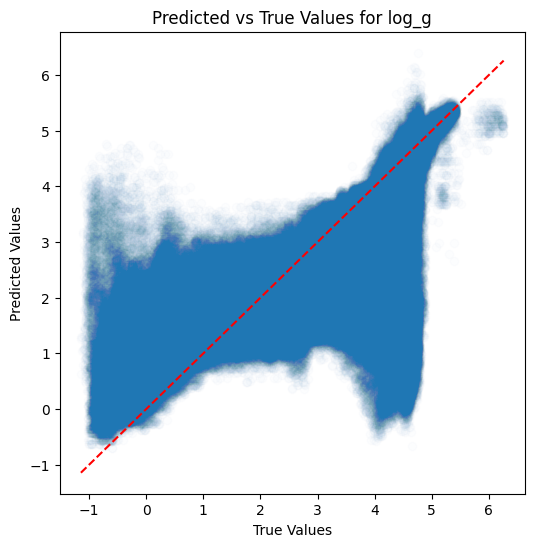

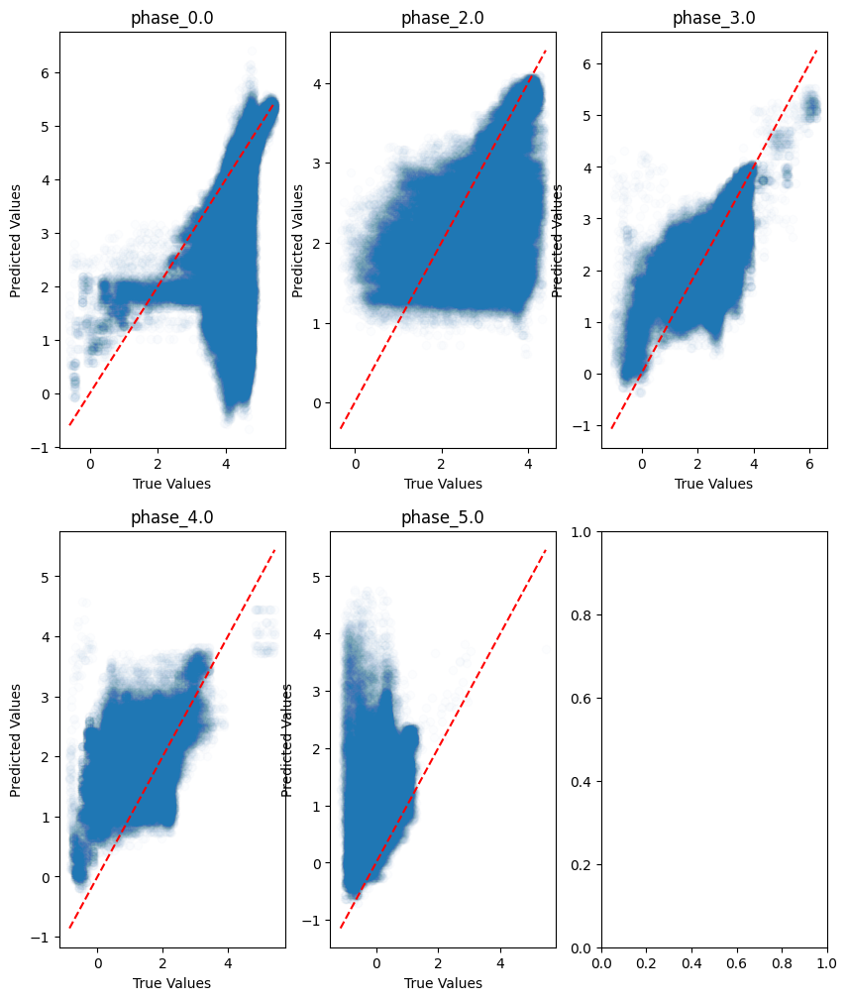

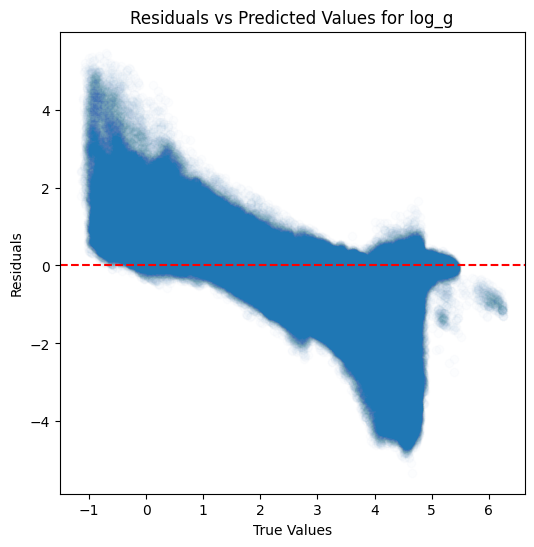

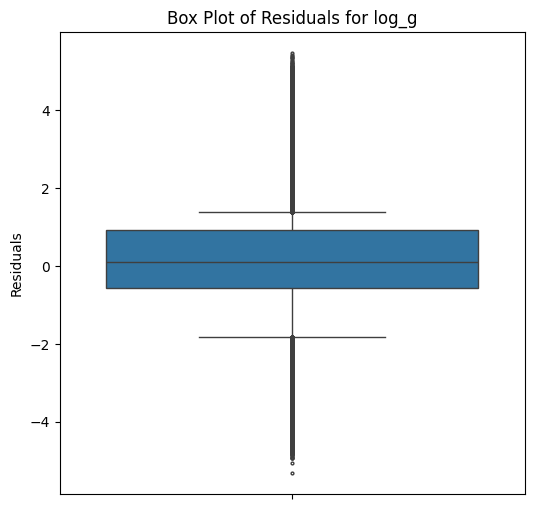

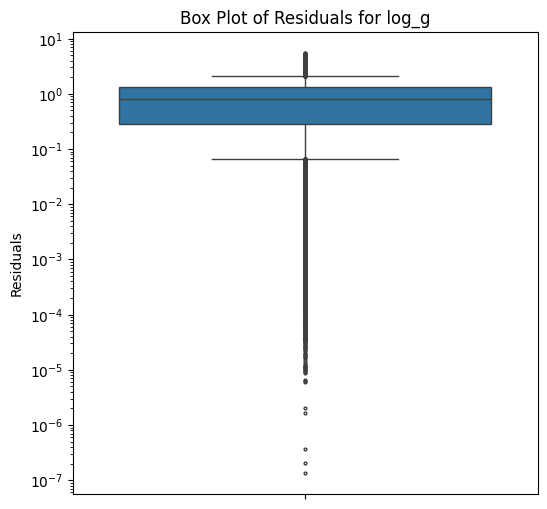

...

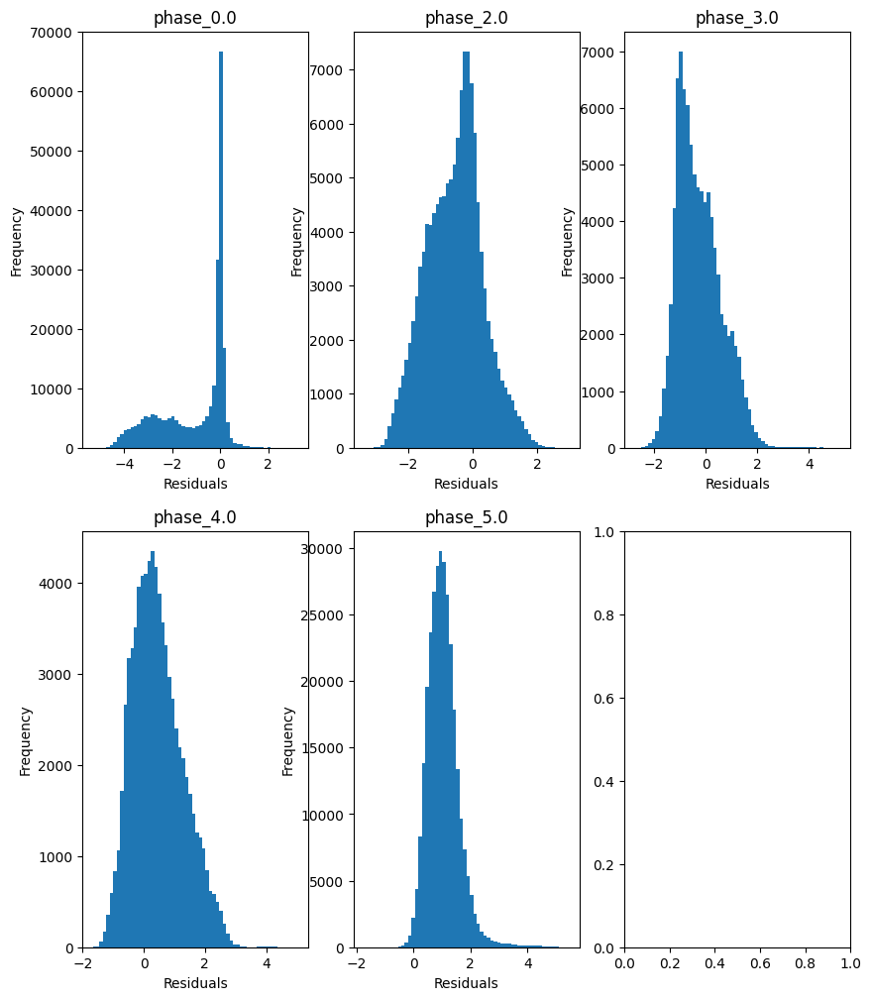

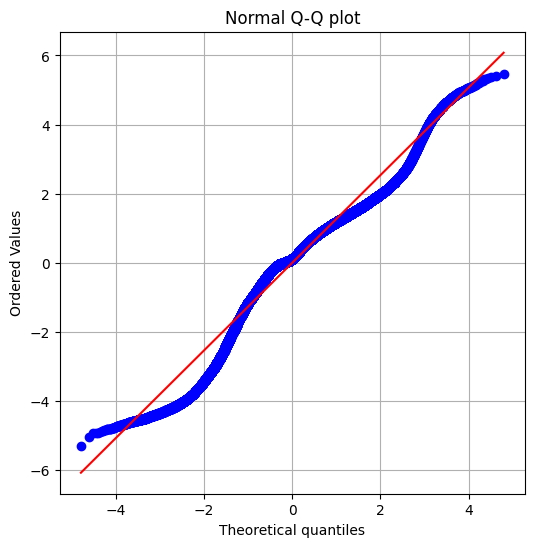

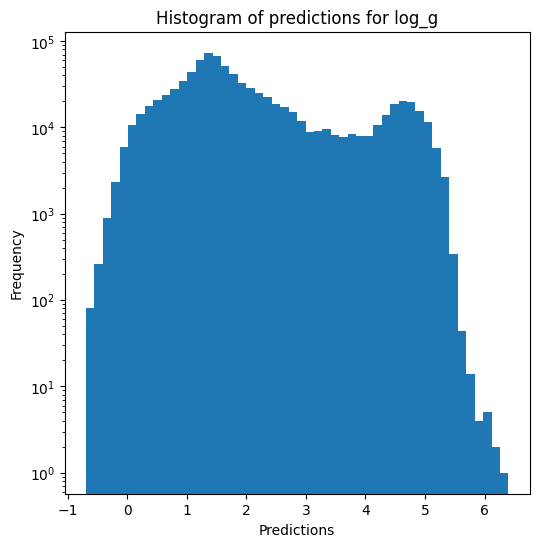

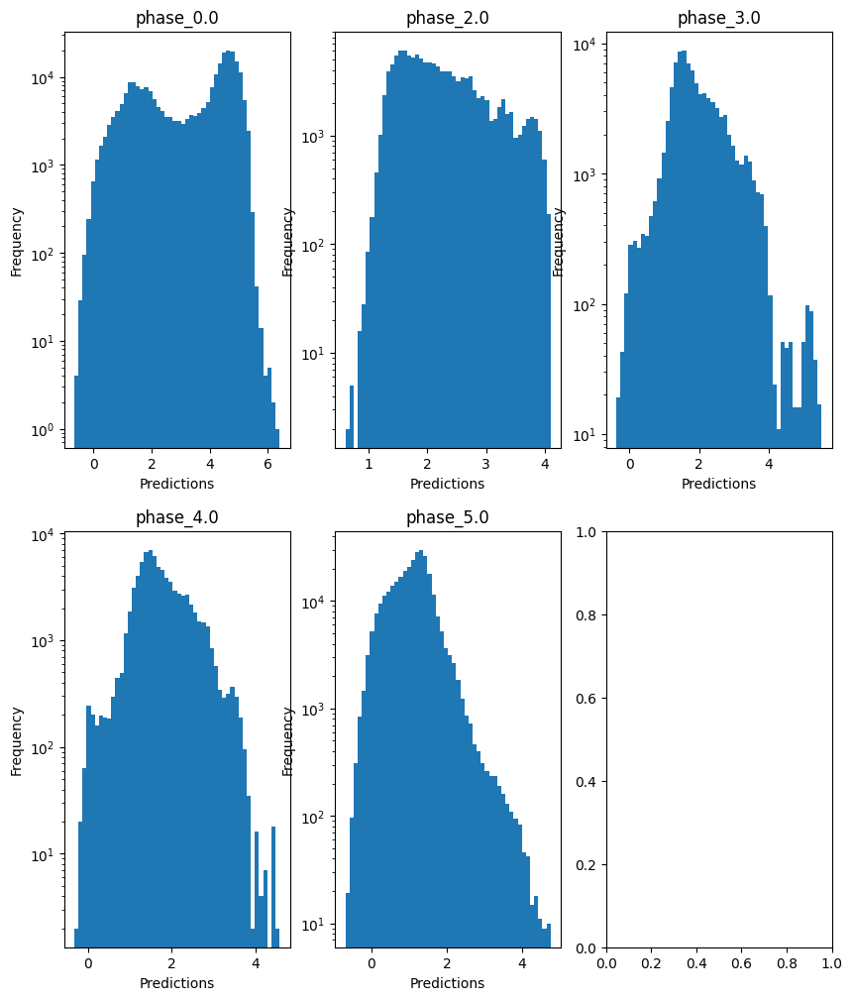

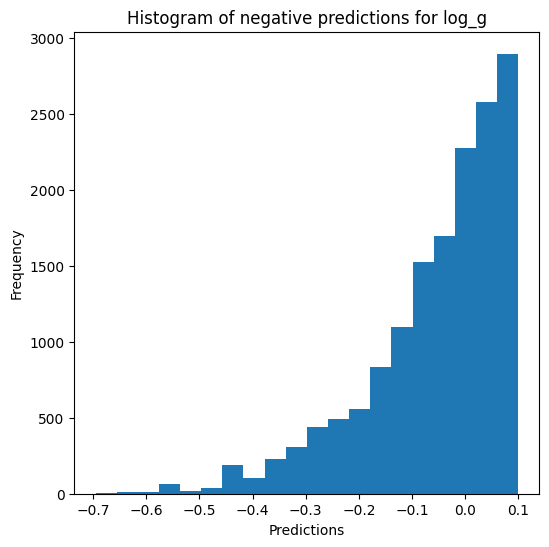


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.0827540579576227
  RVE :  -0.4559277722956936
  RMSE :  0.8609135095448175
  MAE :  0.559193464501375
  MedAE :  0.15560121031058566
  CORR :  0.5813227853344817
  MAX_ER :  2.5608458727384518
  Percentiles : 
    75th percentile :  1.0883564237278849
    90th percentile :  1.6189167995074167
    95th percentile :  1.8465863419158366
    99th percentile :  2.110246468394843

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.891706235288321
  RVE :  0.21821049401520987
  RMSE :  0.5146844335986518
  MAE :  0.4091745205626815
  MedAE :  0.34325093780382043
  CORR :  0.4969790138560307
  MAX_ER :  1.7352461962935308
  Percentiles : 
    75th percentile :  0.6298584124856669
    90th percentile :  0.8645510411005263
    95th percentile :  0.9981567696470326
    99th percentile :  1.2121838740432795

radius results for the phase category with a 

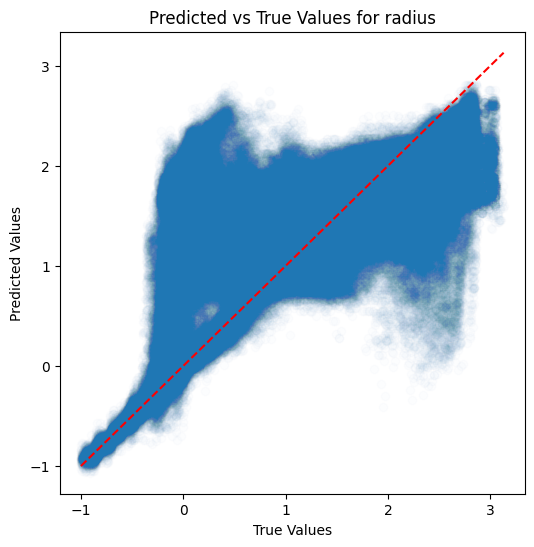

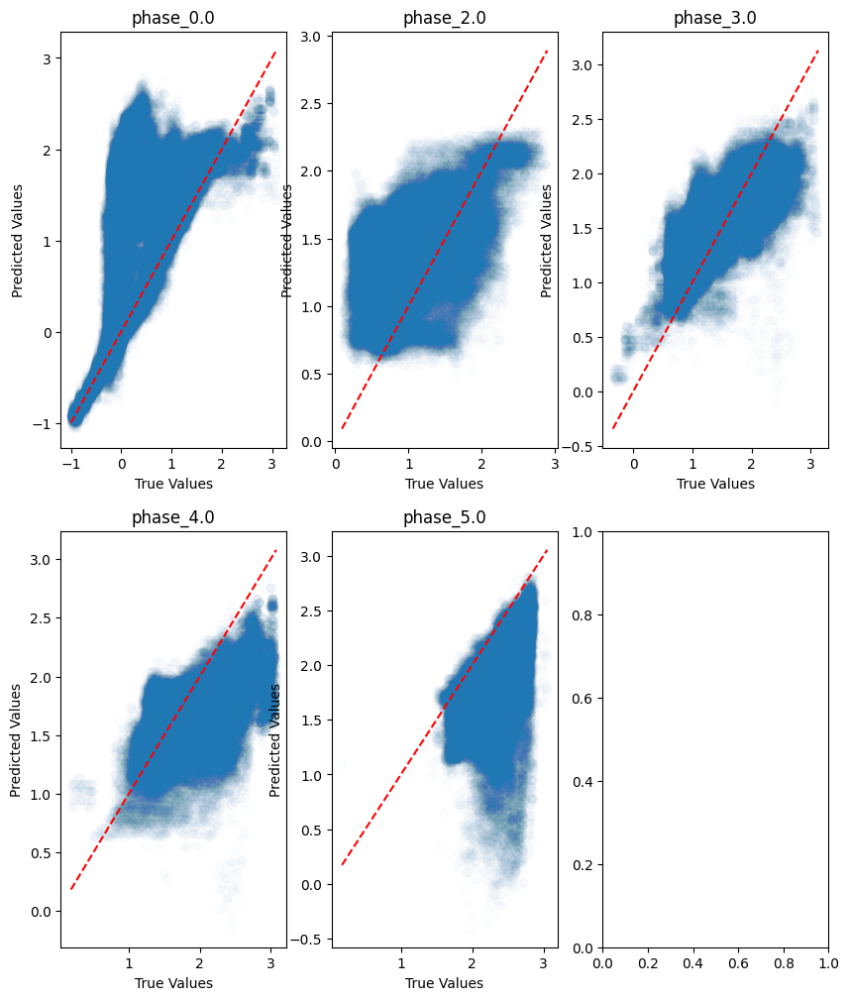

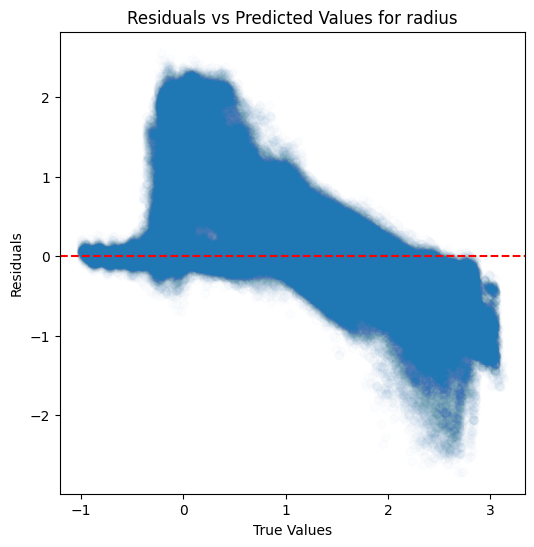

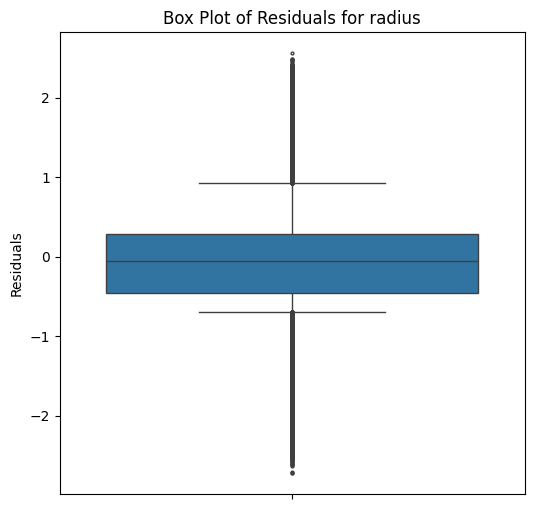

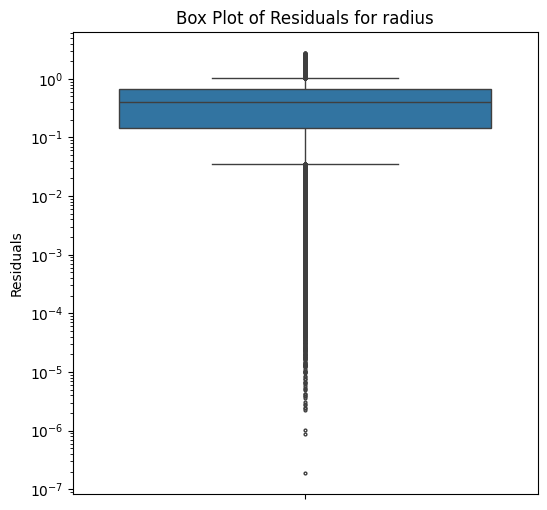

...

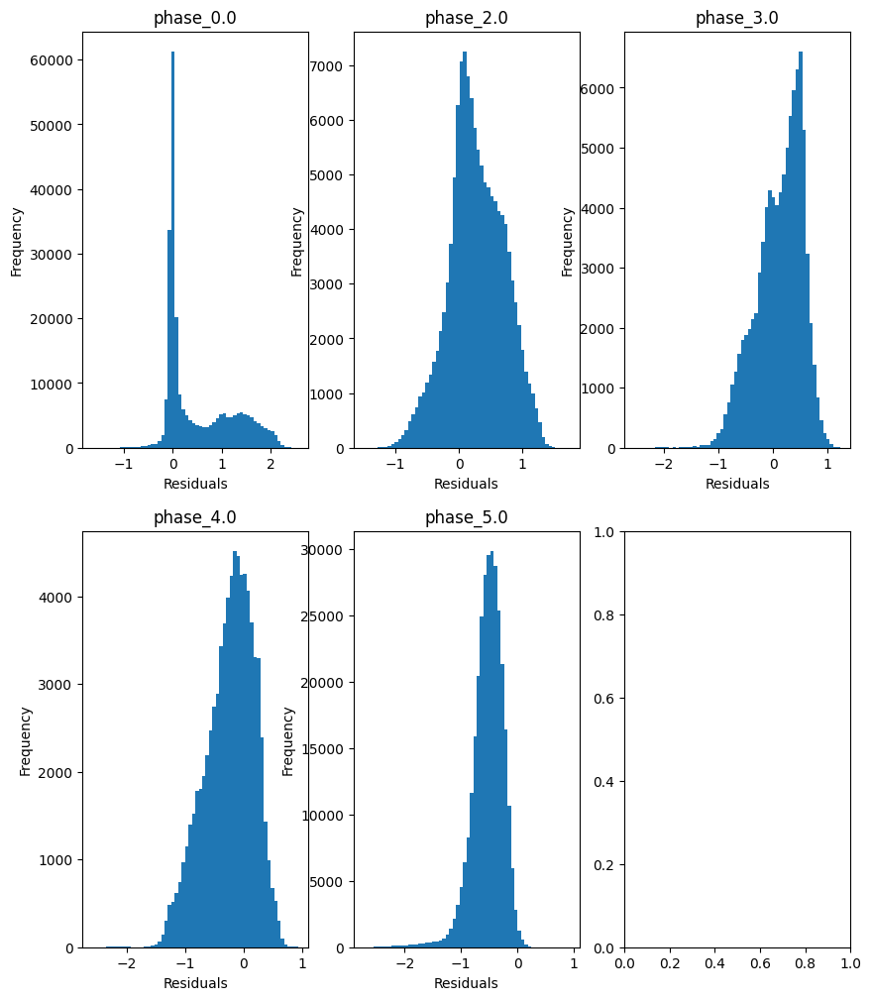

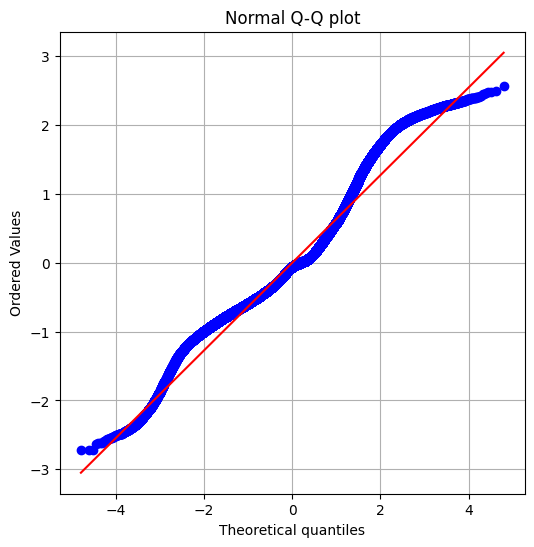

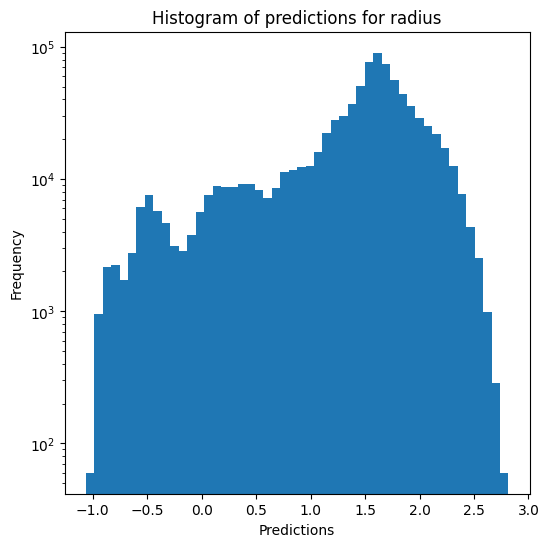

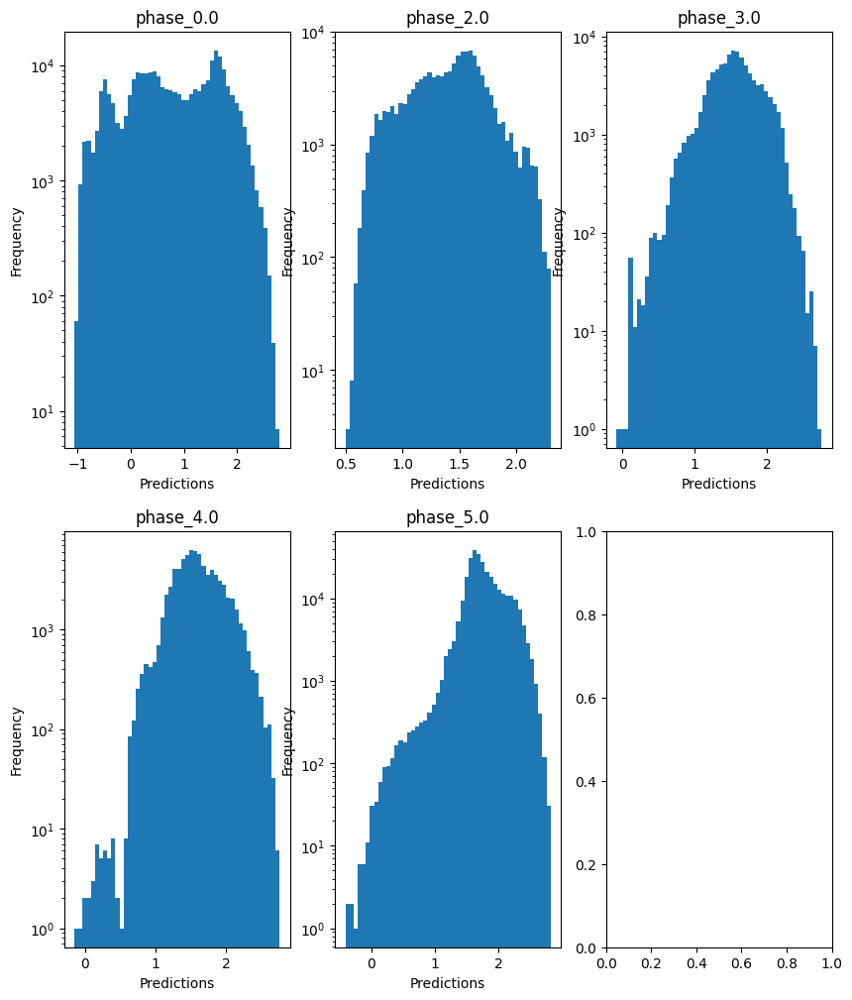

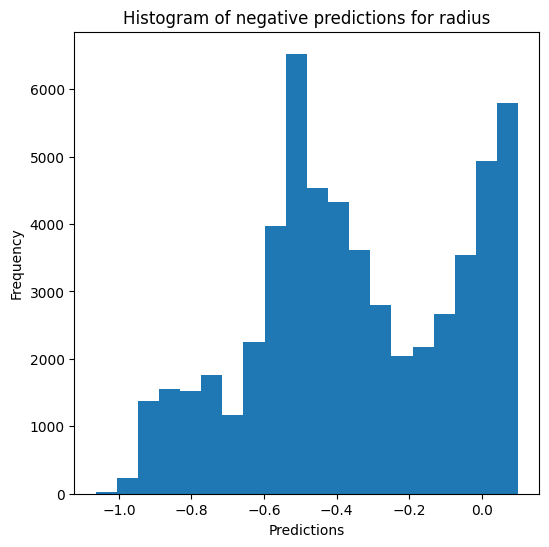

Saving results...


In [19]:
xgb_evaluator.evaluate_Kfold_results(XGBRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, n_jobs=5)

### Multi-layer perceptron

In [20]:
mlp_evaluator = Model_evaluator("mlp", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


Base_old train data :
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.90340707004253
  RVE :  0.7782557694821927
  RMSE :  0.20203801349071157
  MAE :  0.1411017809663224
  MedAE :  0.07009813682955057
  CORR :  0.9054175661418006
  MAX_ER :  0.8628534226944957
  Percentiles : 
    75th percentile :  0.2412123072002953
    90th percentile :  0.3601633969673958
    95th percentile :  0.4389185911805905
    99th percentile :  0.5459471155624515

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.711472733477716
  RVE :  0.7903564249125972
  RMSE :  0.15013977045031135
  MAE :  0.11548177944675524
  MedAE :  0.08935286829064237
  CORR :  0.8910804140786023
  MAX_ER :  0.7236235214060942
  Percentiles : 
    75th percentile :  0.1695248160751256
    90th percentile :  0.2551180877395242
    95th percentile :  0.3054702690567579
    99th percentile :  0

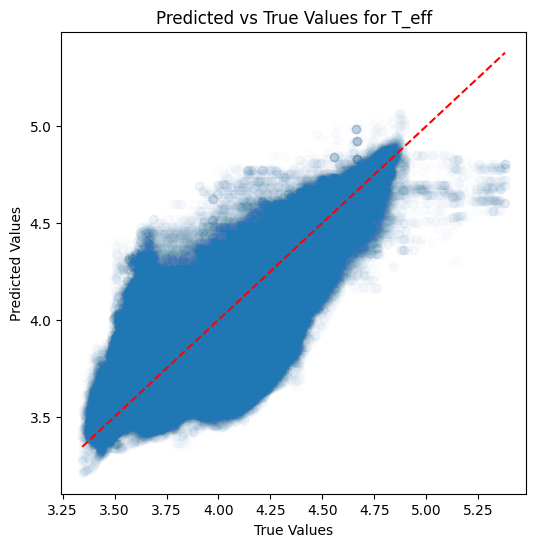

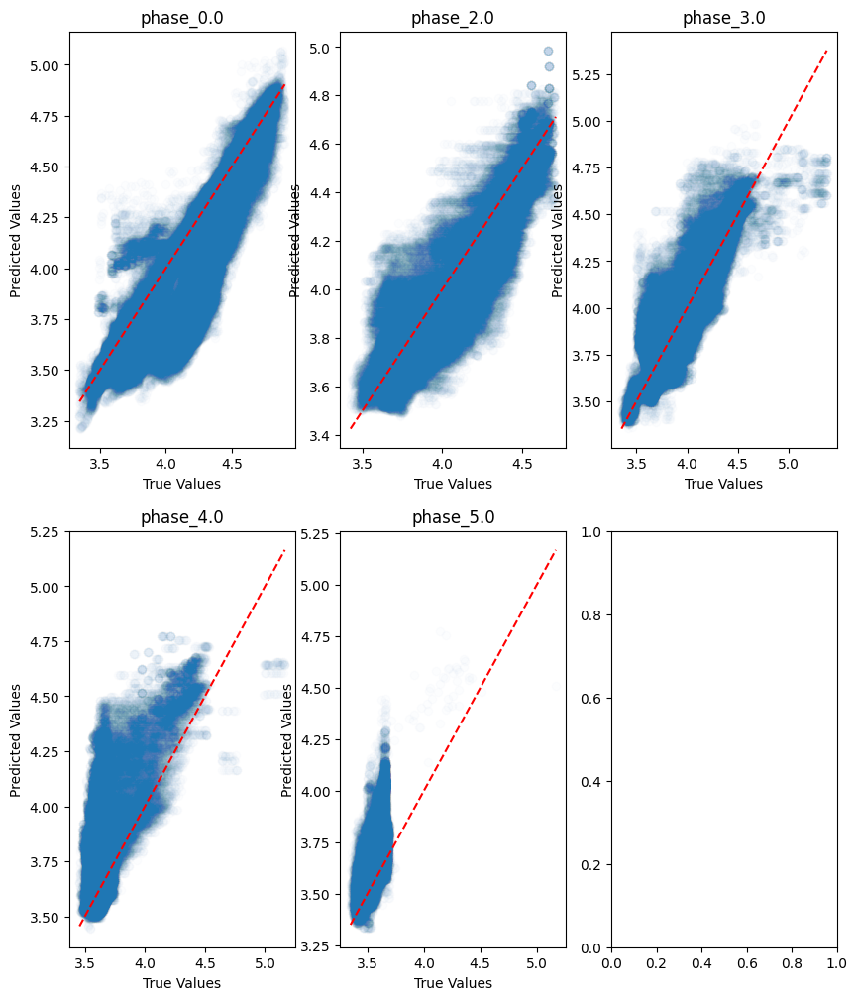

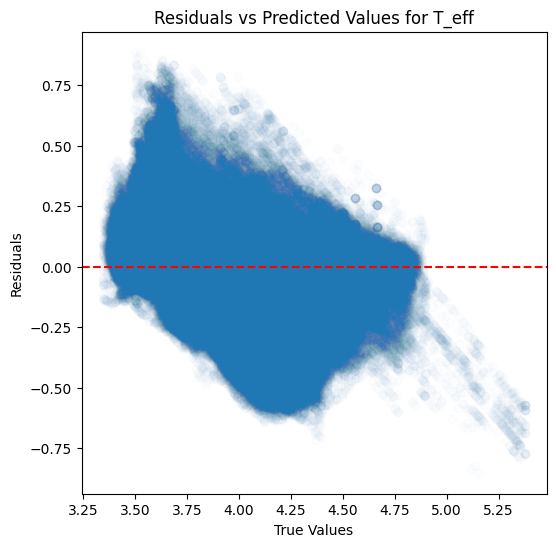

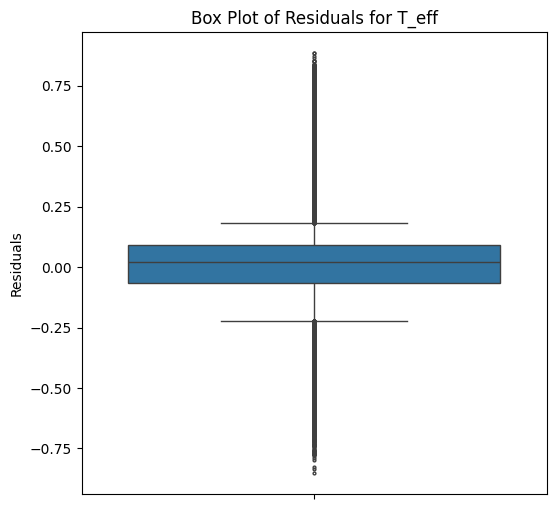

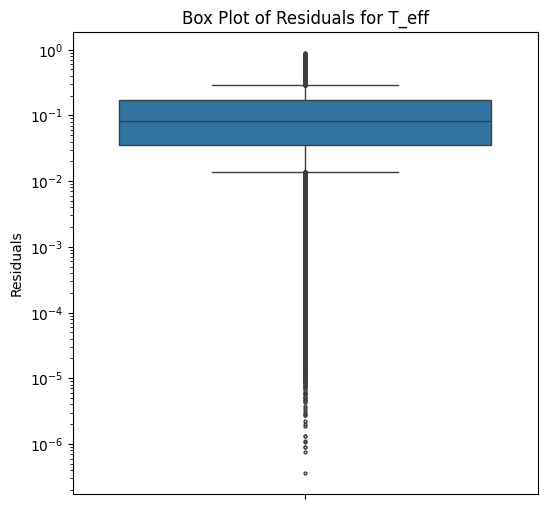

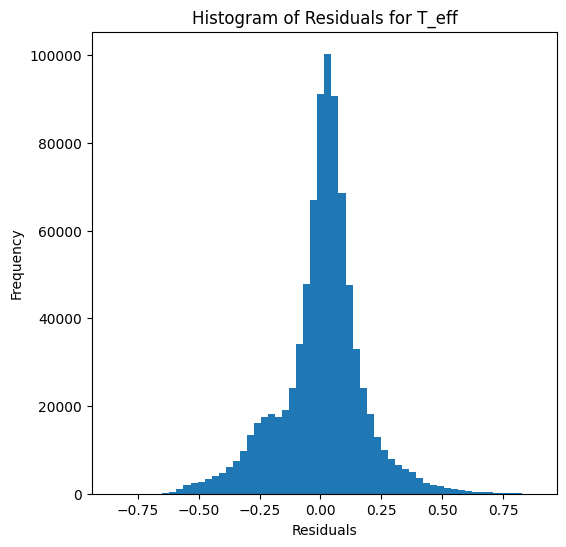

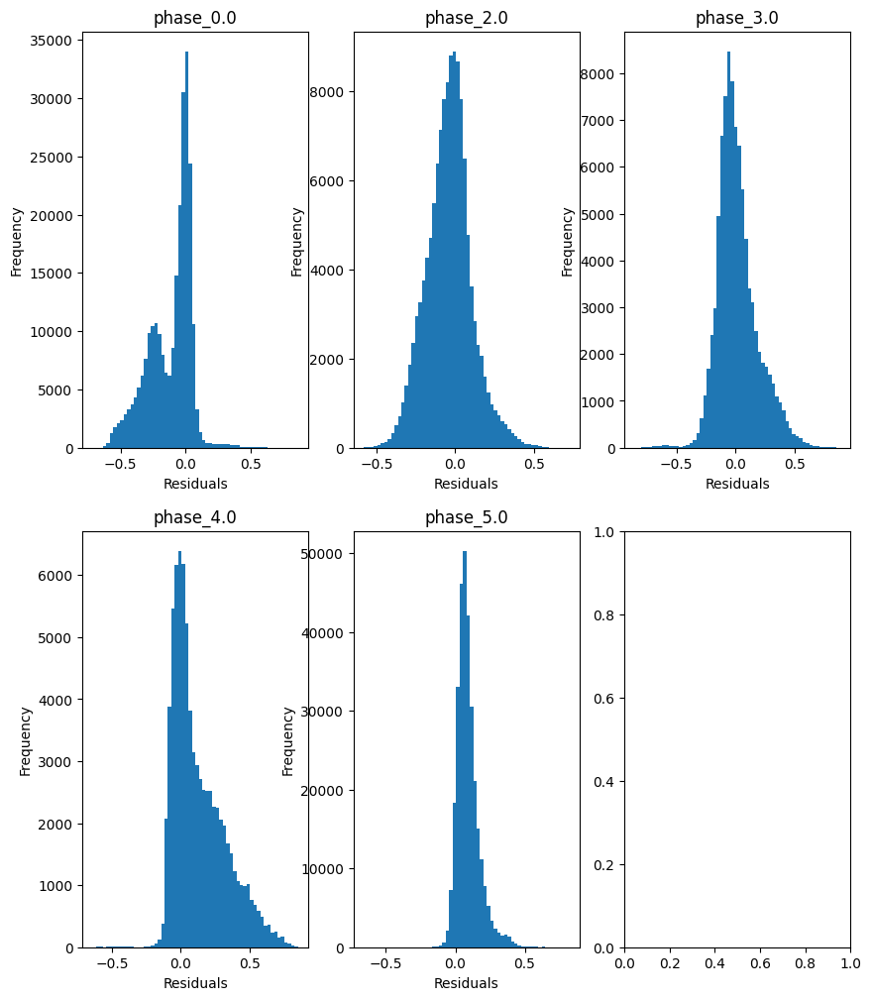

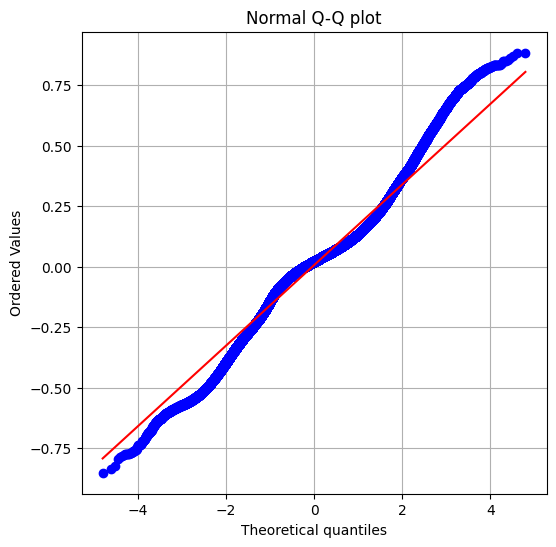

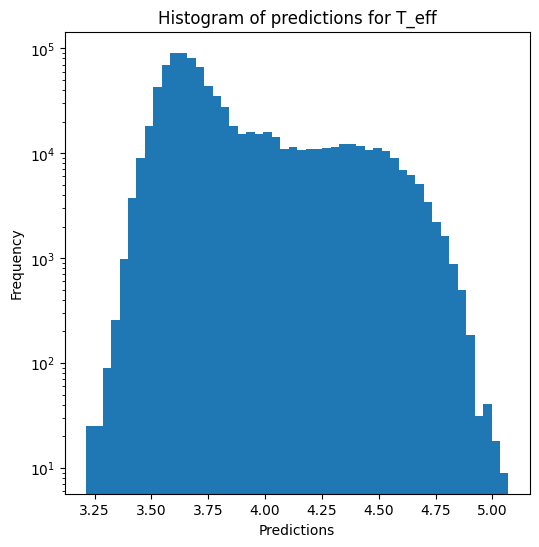

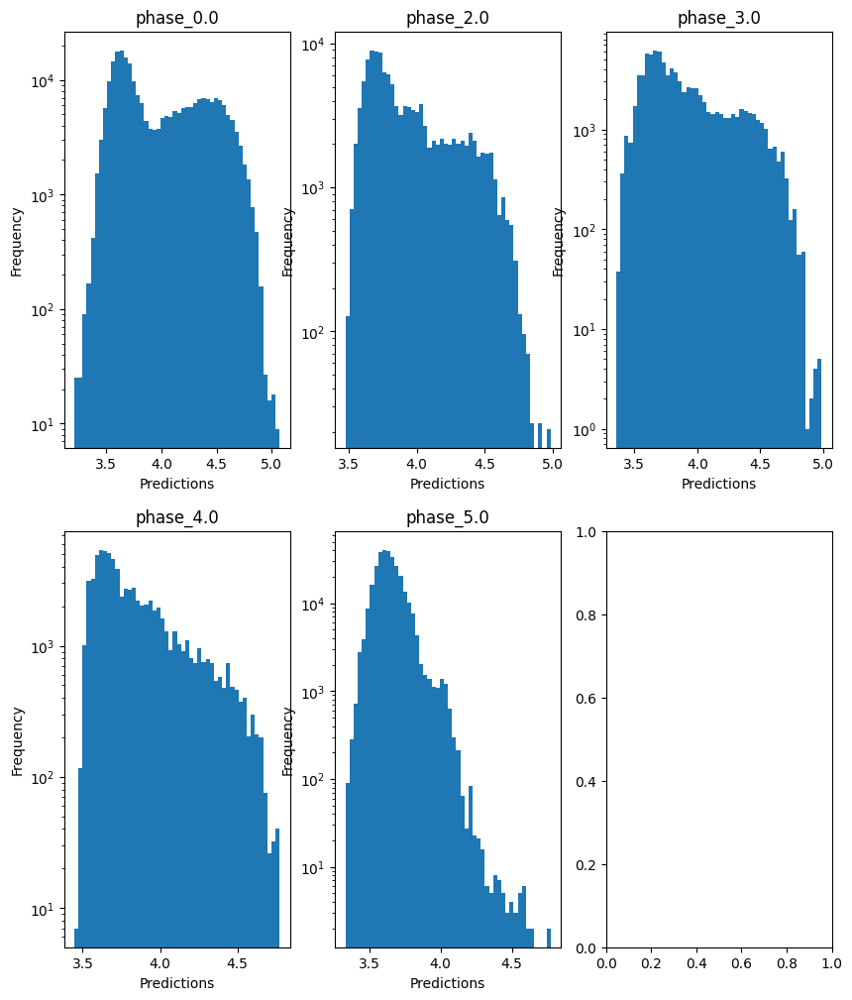


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  -4.120359573737314
  RMSE :  1.7528109030586476
  MAE :  1.1187407323280125
  MedAE :  0.24898316792399933
  CORR :  0.41331302246795376
  MAX_ER :  5.230096619764069
  Percentiles : 
    75th percentile :  2.1275313245510463
    90th percentile :  3.3879791733789726
    95th percentile :  3.7905070598860604
    99th percentile :  4.226926247369236

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.408311770676233
  RVE :  -0.02415964759226208
  RMSE :  1.042423347840051
  MAE :  0.8331136782828501
  MedAE :  0.690827245017237
  CORR :  0.4004075248714839
  MAX_ER :  3.4560225342714057
  Percentiles : 
    75th percentile :  1.2157814344987612
    90th percentile :  1.75054444493148
    95th percentile :  2.0735751302643504
    99th percentile :  2.5658918443848955

log_g results for the phase category with a value o

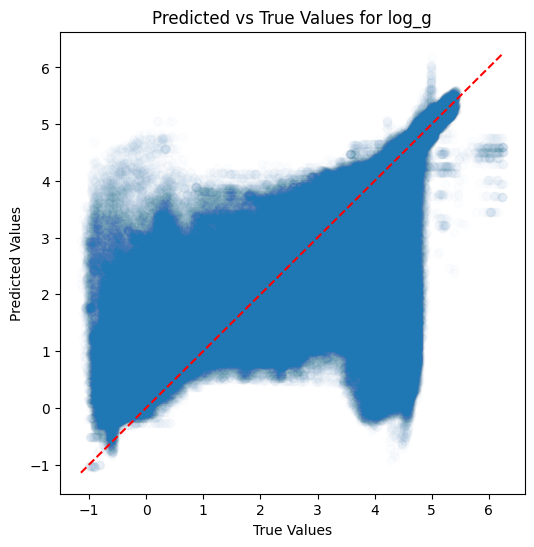

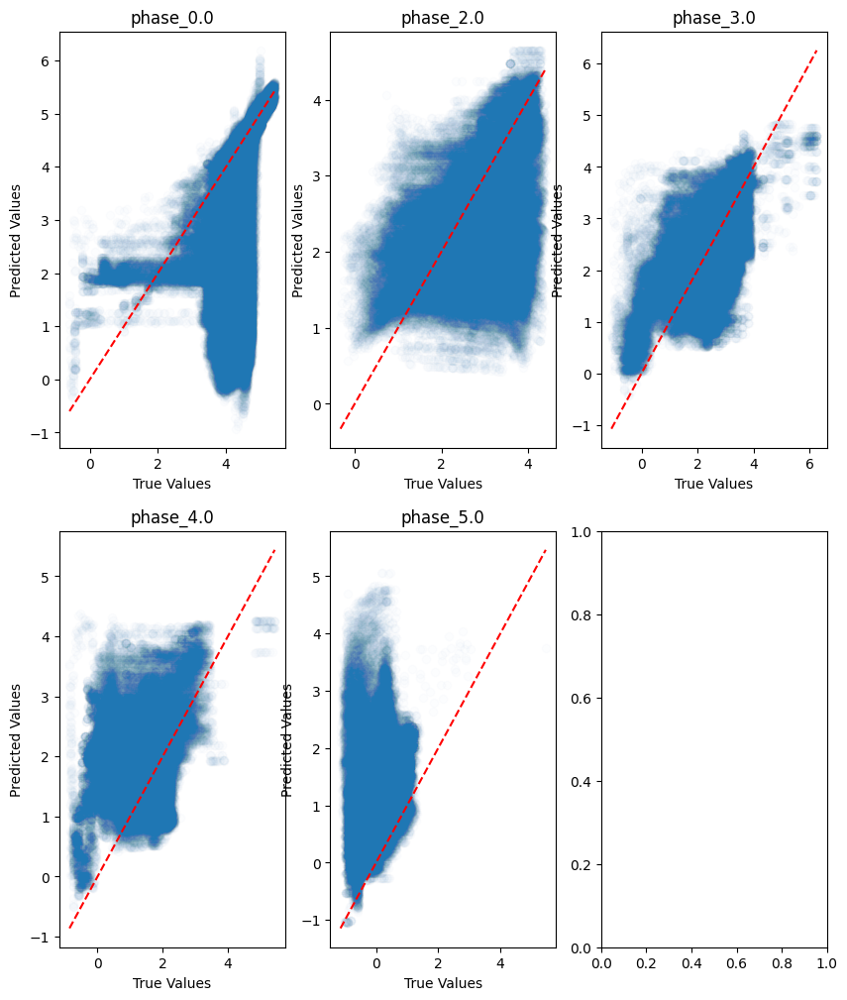

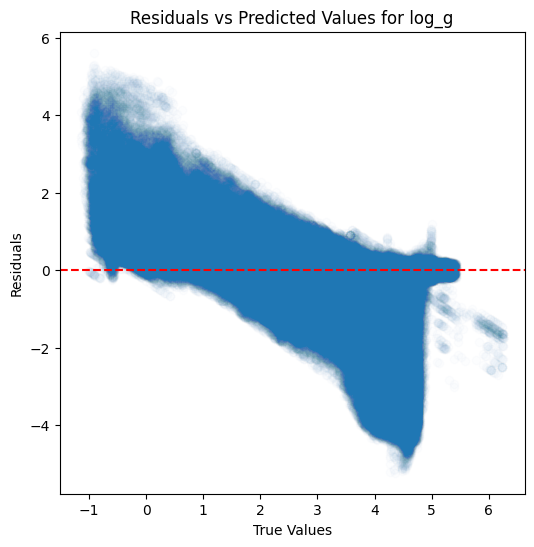

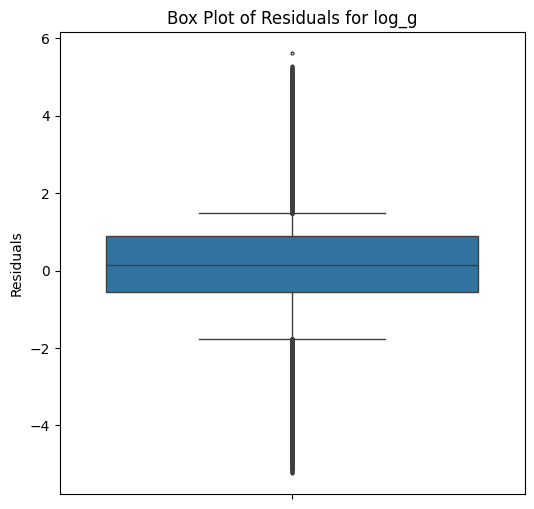

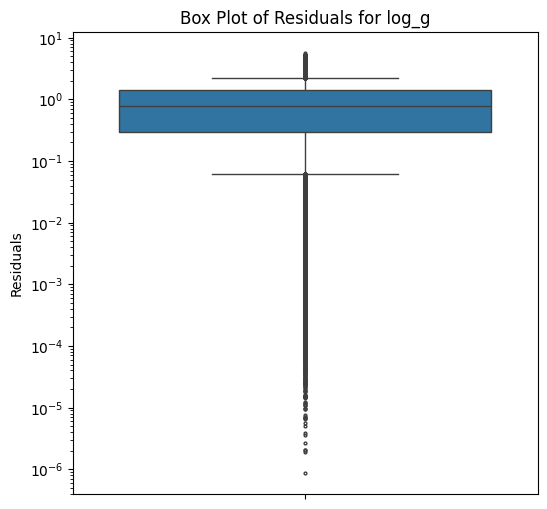

...

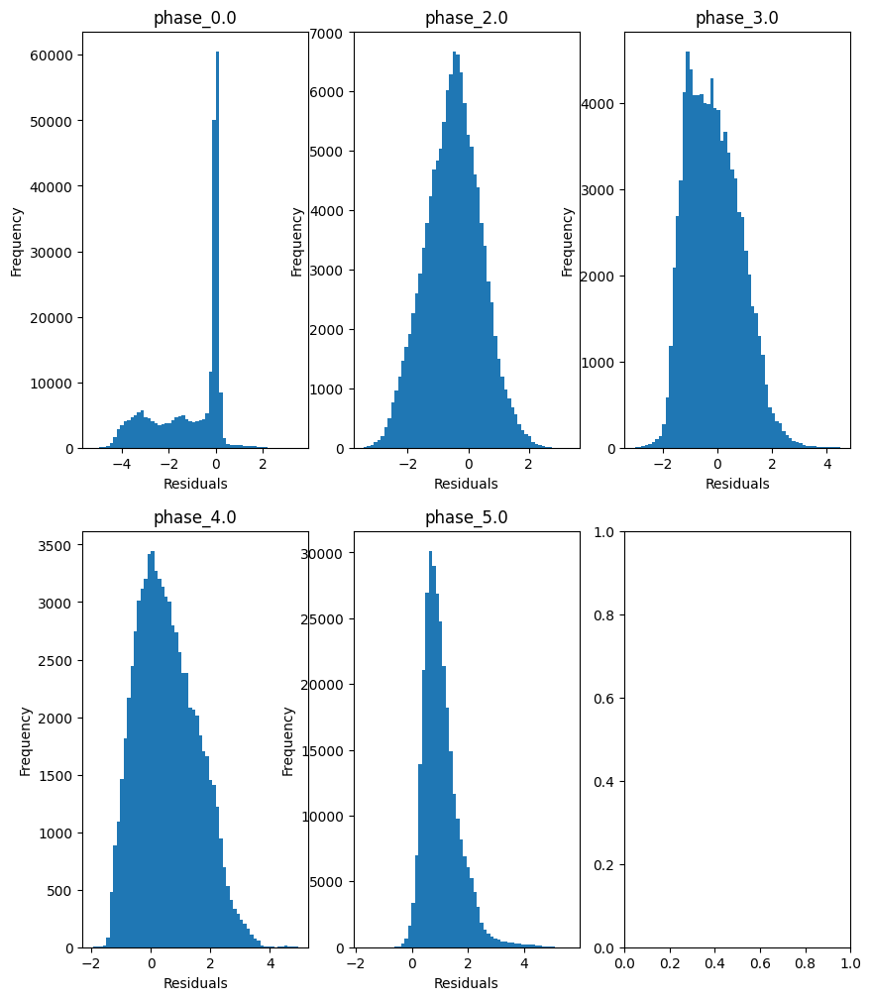

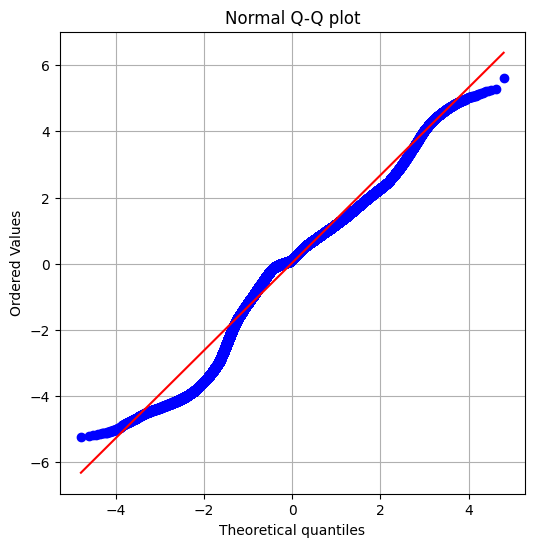

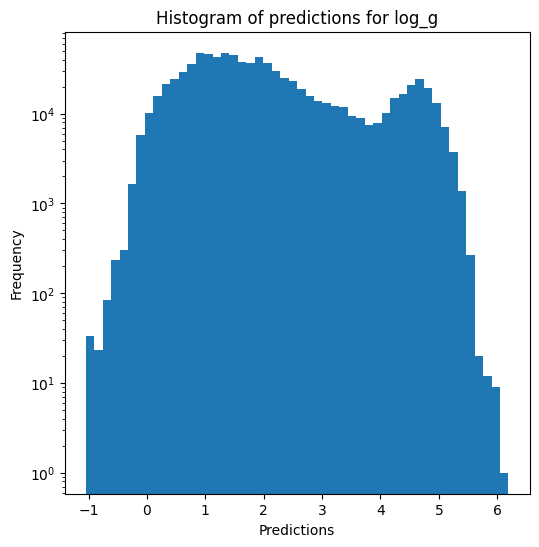

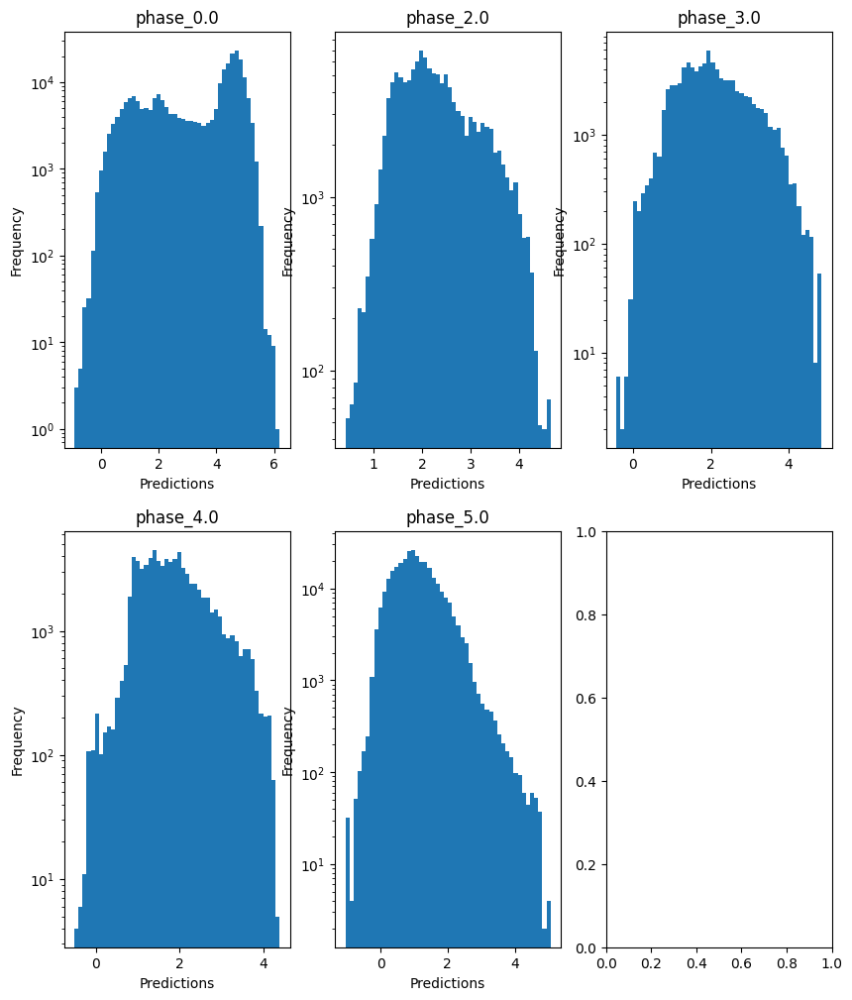

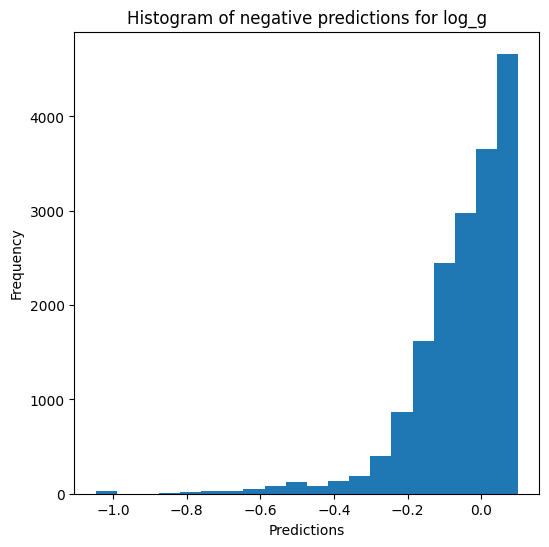


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.0827540579576227
  RVE :  -0.5474327566505712
  RMSE :  0.8753624595872297
  MAE :  0.5631693041712326
  MedAE :  0.1418652061326104
  CORR :  0.5683092990882411
  MAX_ER :  2.635048659623674
  Percentiles : 
    75th percentile :  1.0596775338905282
    90th percentile :  1.6926844278139972
    95th percentile :  1.8909944402096615
    99th percentile :  2.1146498560291156

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.891706235288321
  RVE :  0.11989267910309132
  RMSE :  0.5213922591496254
  MAE :  0.41660469533513067
  MedAE :  0.34509195618414434
  CORR :  0.42995482481137676
  MAX_ER :  1.7612631543838089
  Percentiles : 
    75th percentile :  0.6079188866434574
    90th percentile :  0.8757683942657397
    95th percentile :  1.0378711257208675
    99th percentile :  1.2819120650683693

radius results for the phase category with 

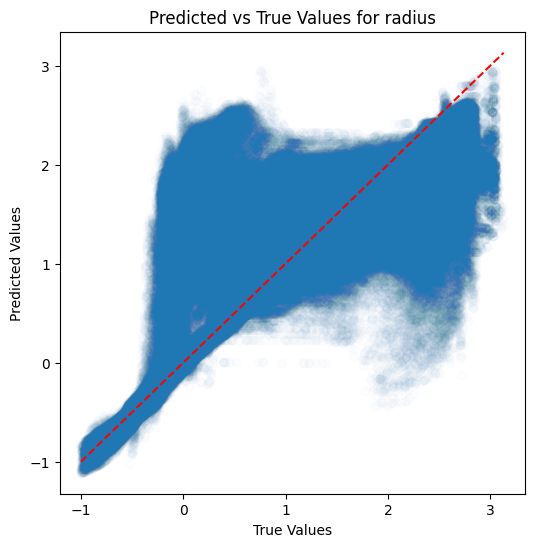

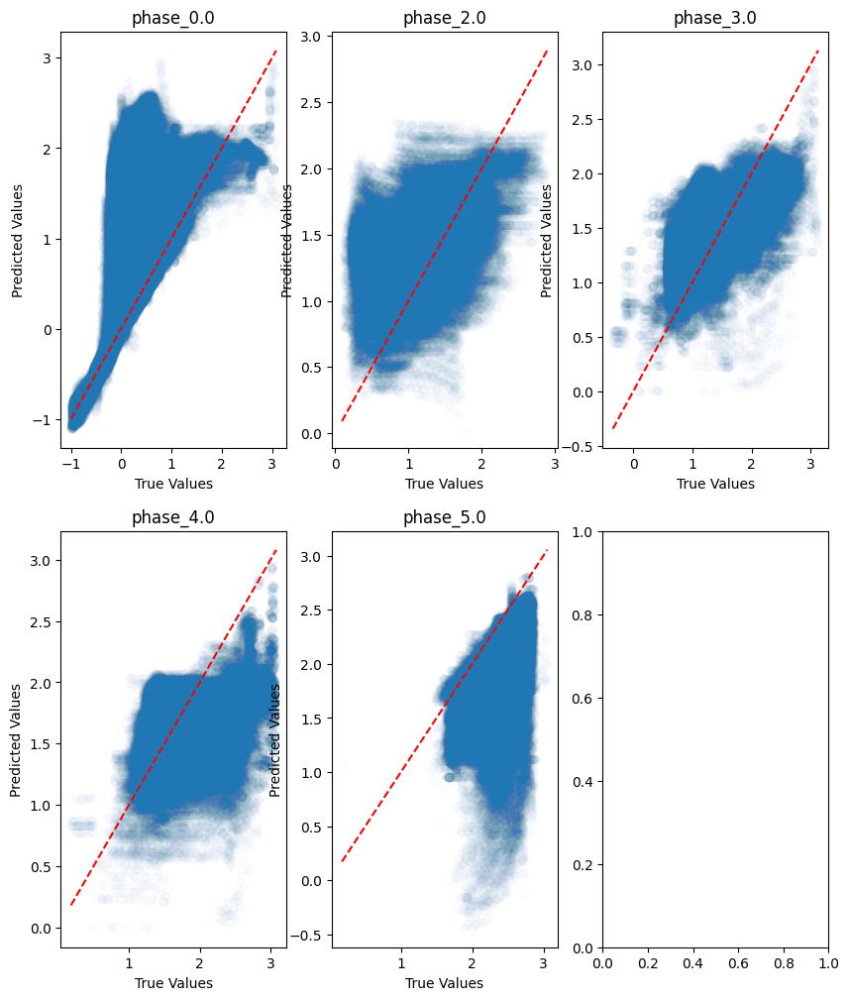

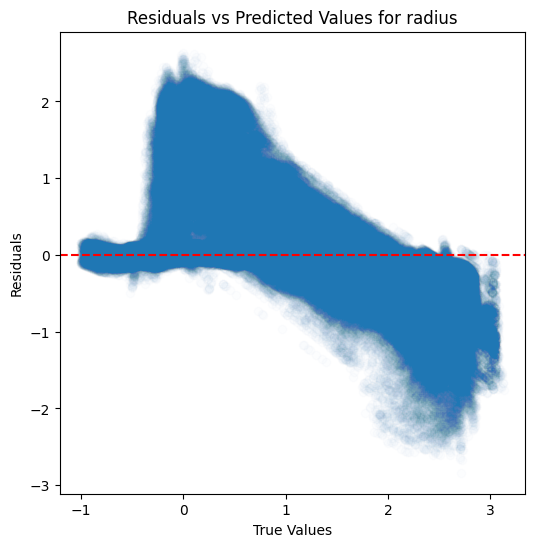

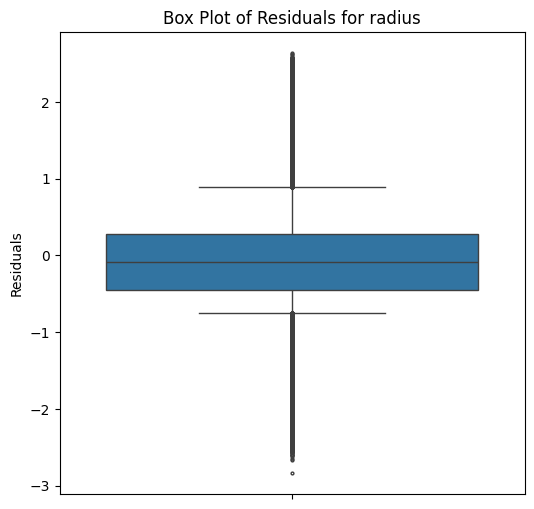

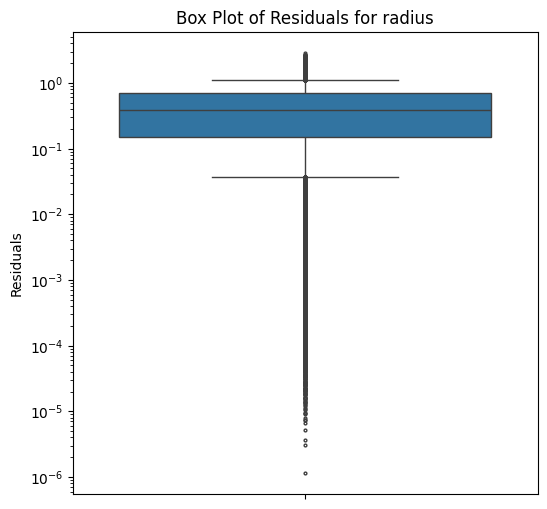

...

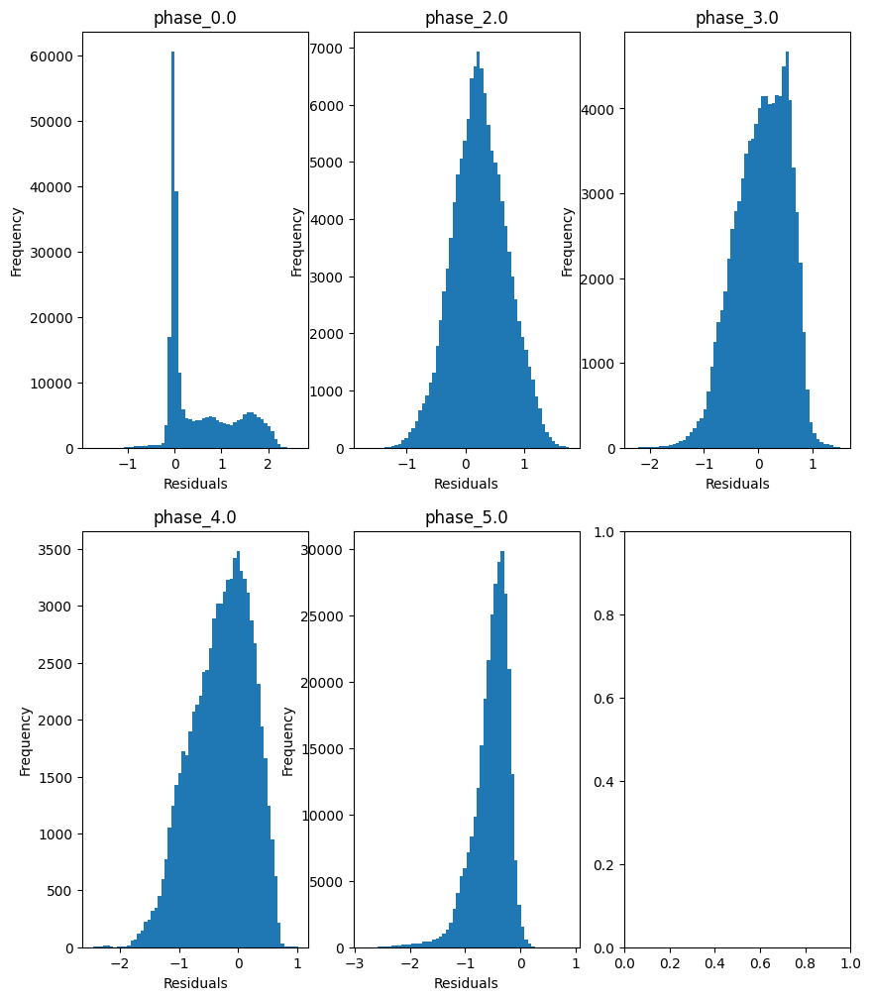

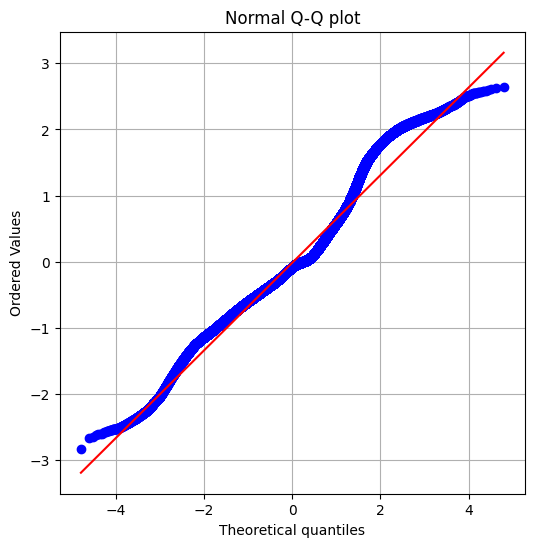

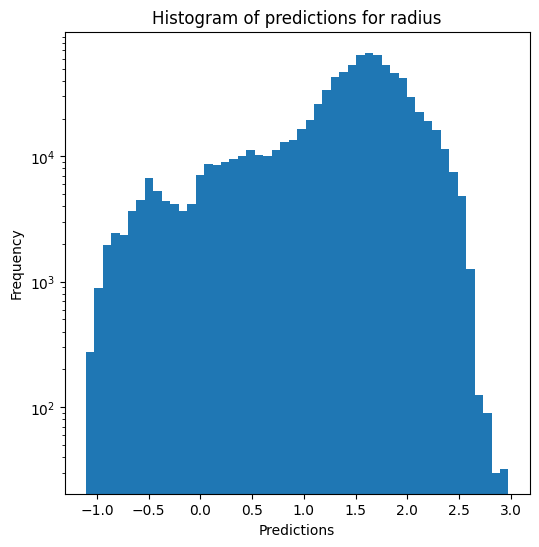

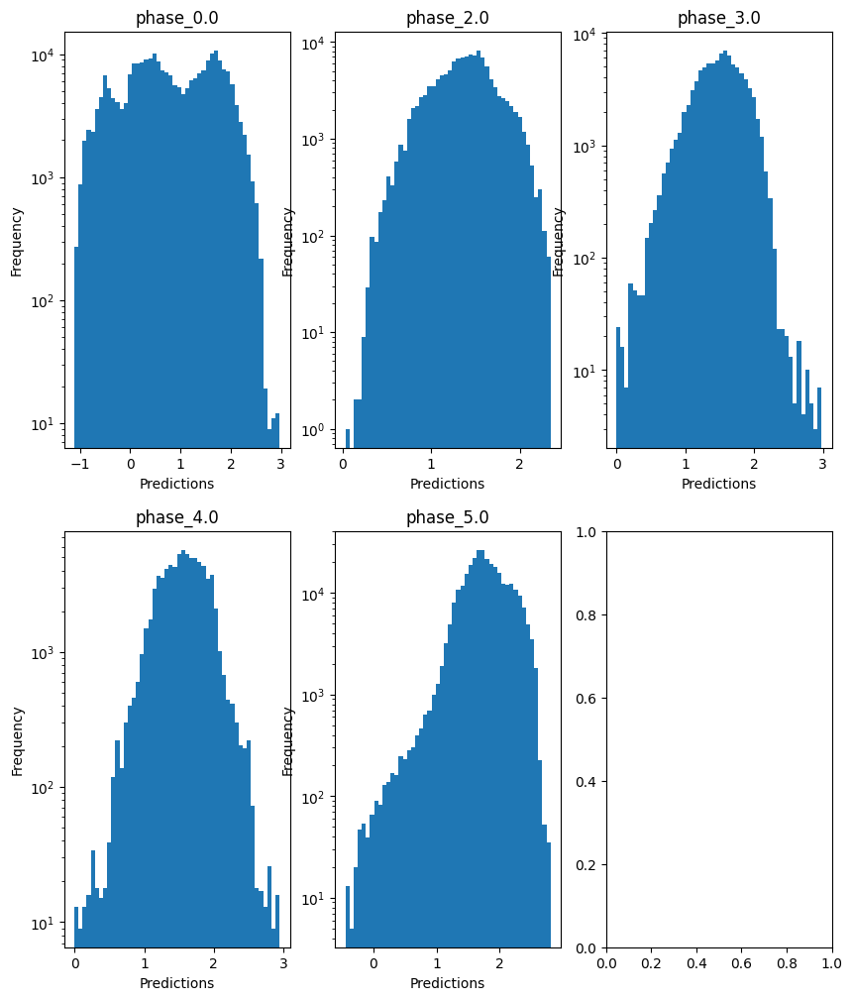

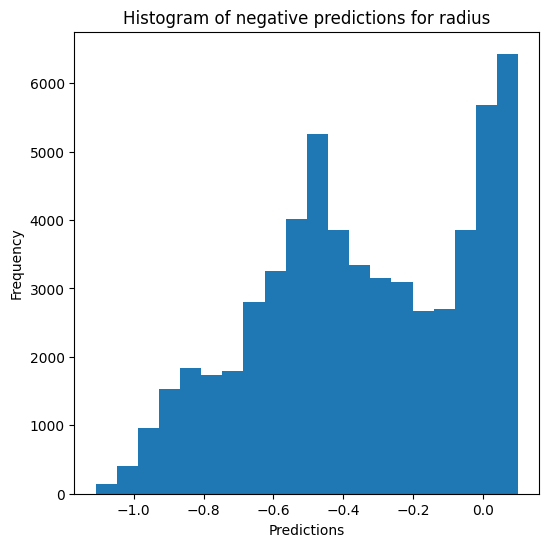

Saving results...


In [21]:
mlp_evaluator.evaluate_Kfold_results(MLPRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, n_splits=5, random_state=12, override=override, use_preds=use_preds, save=save, show=show,
                                      hidden_layer_sizes = (100, 100, 100, 100), max_iter=20, batch_size=400)

Avec batch_size=auto (200):

plus de 30 minutes pour entrainer un seul split de Kfold avec les paramètres par défaut (1 hidden layer de taille 100)

plus de 15 minutes pour entrainer un seul split de Kfold avec les 1 hidden layer de taille 10

- et max_iter=20, hidden_layer_sizes=(100, 50, 25): ~5 minutes par fold (plutôt bon résultats)
- et max_iter=20, hidden_layer_sizes=(100, 100, 100): ~5 minutes par fold

Avec batch_size=400:


Avec learning_rate= :


hidden_layer_sizes = (100, 100), max_iter=20, batch_size=200 => 17 min pour 2 splits et min_loss de 2.1
RMSE = RVE :  0.984867927459382
RMSE :  2.5335132759292107
MAE :  0.7276983504493552
MedAE :  0.3034009994265745
CORR :  0.9927285673947535
MAX_ER :  169.74348568157313
Percentiles : 75th percentile :  0.5113604728134682 90th percentile :  1.1025928446049704 95th percentile :  2.1347654852226015 99th percentile :  9.897101952249908)

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=400 => 7 min pour 2 splits et min_loss de 2.2
RVE :  0.9797171492755655
RMSE :  2.983208723004754
MAE :  0.9125599339275378
MedAE :  0.43124518658659683
CORR :  0.9920536596906272
MAX_ER :  170.53076478793002
Percentiles : 75th percentile :  0.675744507049632 90th percentile :  1.2421052024331438 95th percentile :  2.441733387262636 99th percentile :  11.925724226452427

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=800 => 3 min pour 2 splits et min_loss de 2.3 et 2.7

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=1600 => 3 min 30 pour 2 splits et min_loss de 7.8 et 3.8

=> batch_size plus grand == plus rapide mais moins bon